## some nvidia gpu info

In [1]:
!nvidia-smi
!free
!df -h

Sun Sep 28 15:35:09 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 580.65.06              Driver Version: 580.65.06      CUDA Version: 13.0     |
+-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  Tesla T4                       Off |   00000000:00:04.0 Off |                    0 |
| N/A   77C    P0             34W /   70W |     333MiB /  15360MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

## Dependencies

In [2]:
# --- installs ---
!pip install git+https://github.com/lucidrains/denoising-diffusion-pytorch.git --upgrade
!pip install -q torchvision wandb geomloss
!pip install pot            # Python Optimal Transport library
!pip install scipy          # For statistical analysis and FID computation
!pip install scikit-learn   # For additional metrics if needed

# --- imports ---
import os, math, random, gc
import numpy as np
import matplotlib.pyplot as plt

import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import DataLoader, Subset, TensorDataset
from tqdm import tqdm

from torchvision import datasets, transforms
from torchvision import utils as vutils         # make_grid/save_image helper
from torchvision.utils import make_grid, save_image

from denoising_diffusion_pytorch import Unet, GaussianDiffusion  # <-- missing before
from geomloss import SamplesLoss                                   # <-- missing before
import ot                                                          # POT

from scipy.linalg import sqrtm
from scipy.stats import pearsonr

import wandb                                                       # you installed it; now imported

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print("Using device:", device)


  Cloning https://github.com/lucidrains/denoising-diffusion-pytorch.git to /tmp/pip-req-build-4i5q9wab
  Running command git clone --filter=blob:none --quiet https://github.com/lucidrains/denoising-diffusion-pytorch.git /tmp/pip-req-build-4i5q9wab
  Resolved https://github.com/lucidrains/denoising-diffusion-pytorch.git to commit 8fac8e52126f5d8dbf93c4a8c3af4e9924000369
  Preparing metadata (setup.py) ... done
Using device: cuda


## mount drive

In [3]:
#from google.colab import drive
#drive.mount('/content/drive', force_remount=True)

## arranging the checkpoints directory

In [4]:
import glob
import os
import re

CHECKPOINT_DIR = "/content/drive/MyDrive/_ddpm_mnist_checkpoints"
os.makedirs(CHECKPOINT_DIR, exist_ok=True)

def extract_epoch_number(filename):
    match = re.search(r"epoch(\d+)", filename)
    return int(match.group(1)) if match else -1

# --- BEFORE ---
print('==== BEFORE ====')
checkpoint_paths = glob.glob(os.path.join(CHECKPOINT_DIR, "*.pt"))
start_epoch = 0
for f in sorted(checkpoint_paths, key=extract_epoch_number, reverse=True):
    epoch = extract_epoch_number(f)
    if epoch >= start_epoch:
        print(f)

# --- DELETE ---
start_epoch = 99999  # Change CAREFULLY as needed (CHECKPOINTS OF LARGER EPOCH WILL BE DELETED)
for f in checkpoint_paths:
    epoch = extract_epoch_number(f)
    if epoch >= start_epoch:
        os.remove(f)

# --- AFTER ---
print('==== AFTER ====')
checkpoint_paths = glob.glob(os.path.join(CHECKPOINT_DIR, "*.pt"))
start_epoch = 0
for f in sorted(checkpoint_paths, key=extract_epoch_number, reverse=True):
    epoch = extract_epoch_number(f)
    if epoch >= start_epoch:
        print(f)


==== BEFORE ====
==== AFTER ====


## dataset splits and their loaders

In [5]:
from torchvision import datasets
import torchvision.transforms as T
import torch
from torch.utils.data import DataLoader, random_split

torch.manual_seed(42)  # ensure reproducibility across runs

# --- Config
BATCH_SIZE = 128
IMAGE_SIZE = 28
TIMESTEPS = 1000
SAMPLING_TIMESTEPS = 50

# --- Transform
transform = T.Compose([
    T.Resize(IMAGE_SIZE),
    T.ToTensor(),
    lambda x: x * 2 - 1
])

# --- Full original training set (60K)
full_train_dataset = datasets.MNIST(root='./data', train=True, download=True, transform=transform)

# --- Deterministic split into train/val
VAL_SIZE = 5000
TRAIN_SIZE = len(full_train_dataset) - VAL_SIZE
train_dataset, val_dataset = random_split(full_train_dataset, [TRAIN_SIZE, VAL_SIZE])

# --- True test set (untouched)
test_dataset = datasets.MNIST(root='./data', train=False, download=True, transform=transform)

# --- DataLoaders
train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True, drop_last=True)
val_loader   = DataLoader(val_dataset,   batch_size=BATCH_SIZE, shuffle=False)
test_loader  = DataLoader(test_dataset,  batch_size=BATCH_SIZE, shuffle=False)


## Model

In [6]:
def build_model_and_diffusion(device, image_size=IMAGE_SIZE):
    model = Unet(
        dim=64,
        dim_mults=(1, 2, 4),
        channels=1
    ).to(device)

    diffusion = GaussianDiffusion(
        model,
        image_size=image_size,
        timesteps=TIMESTEPS,                      # training schedule (typically 1000)
        sampling_timesteps=SAMPLING_TIMESTEPS     # number of DDIM steps at inference time (typicall 50)
    ).to(device)

    return model, diffusion


## loss computations

In [7]:
def compute_loss(model, diffusion, x0, device):
    b = x0.size(0)
    T_full = diffusion.num_timesteps

    # Quadratic timestep sampling
    u = torch.rand(b, device=device)
    t = (u ** 2 * T_full).long().clamp(0, T_full - 1).view(-1)

    # Forward noising
    noise = torch.randn_like(x0)
    x_t = diffusion.q_sample(x_start=x0, t=t, noise=noise)

    # Noise prediction
    pred_noise = model(x_t, t)

    # Loss
    return F.mse_loss(pred_noise, noise)


def compute_val_loss(model, diffusion, val_loader, device, max_batches=None):
    model.eval()
    total_loss = 0.0
    count = 0
    with torch.no_grad():
        for i, (x, _) in enumerate(val_loader):
            if max_batches is not None and i >= max_batches:
                break
            x = x.to(device)
            loss = compute_loss(model, diffusion, x, device)
            total_loss += loss.item()
            count += 1
    return total_loss / count if count > 0 else float("nan")


## single step reconstruction

In [8]:
import torch.nn.functional as F

def compute_psnr(x_recon, x_gt):
    """
    Compute PSNR per image in a batch, assuming input images in [-1, 1].
    """
    mse = F.mse_loss(x_recon, x_gt, reduction='none').mean(dim=(1, 2, 3))
    psnr = -10 * torch.log10(mse + 1e-8)
    return psnr

def visualize_reconstructions(model, diffusion, fixed_images, fixed_noise, device, epoch, prefix="train"):
    model.eval()
    with torch.no_grad():
        timesteps_to_eval = [50, 100, 900]  # Change as needed
        b = fixed_images.shape[0]

        psnr_results = []
        recon_grids = []
        noise_mse_results = []

        for t_val in timesteps_to_eval:
            t = torch.full((b,), t_val, device=device, dtype=torch.long)
            x_noisy = diffusion.q_sample(fixed_images, t=t, noise=fixed_noise)

            # Predict noise
            pred_noise = model(x_noisy, t)

            x_recon = diffusion.predict_start_from_noise(x_noisy, t, pred_noise).clamp(-1, 1)

            x_noisy_min = x_noisy.amin(dim=(1, 2, 3), keepdim=True)
            x_noisy_max = x_noisy.amax(dim=(1, 2, 3), keepdim=True)
            x_noisy_norm = 2 * (x_noisy - x_noisy_min) / (x_noisy_max - x_noisy_min + 1e-8) - 1

            # Compute PSNR
            psnr = compute_psnr(x_recon, fixed_images)
            psnr_mean = psnr.mean().item()
            psnr_results.append((t_val, psnr_mean))

            # Compute noise MSE
            noise_mse = F.mse_loss(pred_noise, fixed_noise, reduction='none').mean(dim=(1, 2, 3))
            noise_mse_results.append((t_val, noise_mse.mean().item()))

            combined = torch.cat([fixed_images, x_noisy_norm, x_recon], dim=0)
            combined = (combined + 1) / 2.0  # ← this rescales to [0, 1]
            grid = make_grid(combined, nrow=b, pad_value=1)

            # ✅ Append the grid so it gets logged
            recon_grids.append((t_val, psnr_mean, grid.cpu()))

        # Log scalar metrics
        for t_val, psnr_val in psnr_results:
            wandb.log({f"{prefix}/psnr_t{t_val}": psnr_val}, step=epoch)
        for t_val, noise_mse_val in noise_mse_results:
            wandb.log({f"{prefix}/noise_mse_t{t_val}": noise_mse_val}, step=epoch)

        # Log image grids with PSNR in the caption
        for t_val, psnr_val, grid in recon_grids:
            wandb.log({
                f"{prefix}/recon_grid_t{t_val}": wandb.Image(
                    grid,
                    caption=f"t={t_val} | PSNR={psnr_val:.2f}dB\nTop: GT | Middle: xₜ | Bottom: x̂₀"
                )
            }, step=epoch)


## training script

In [9]:
import torch
import torchvision
import torchvision.transforms as T
from torch.utils.data import DataLoader
from torchvision.utils import make_grid
from tqdm import tqdm
import os
import glob
import wandb
import sys

from denoising_diffusion_pytorch import Unet, GaussianDiffusion


# --- Config
EPOCHS = 35
SAVE_EVERY = 1
NUM_RECONS = 20

max_batches = None  # set to int for quick debug

# --- Init wandb
wandb.init(project="ddpm-mnist-train", config={
    "epochs": EPOCHS,
    "batch_size": BATCH_SIZE,
    "image_size": IMAGE_SIZE
})
wandb.define_metric("epoch")
wandb.define_metric("train_loss", step_metric="epoch")
wandb.define_metric("val_loss", step_metric="epoch")
wandb.define_metric("recon_psnr", step_metric="epoch")


# --- Device setup
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print("Training on", device)

# --- Fixed validation images, noise, and timesteps
fixed_loader = DataLoader(val_dataset, batch_size=NUM_RECONS, shuffle=False)
fixed_images, _ = next(iter(fixed_loader))
fixed_images = fixed_images.to(device)

fixed_noise = torch.randn_like(fixed_images)
norms = fixed_noise.view(NUM_RECONS, -1).norm(dim=1)
sorted_idx = norms.argsort()
fixed_noise = fixed_noise[sorted_idx]
fixed_images = fixed_images[sorted_idx]

# --- Model & Diffusion
model, diffusion = build_model_and_diffusion(device=device, image_size=IMAGE_SIZE)

# --- Optimizer
optimizer = torch.optim.Adam(model.parameters(), lr=2e-4)

# --- Resume from checkpoint if available
latest_ckpt = None
for f in sorted(os.listdir(CHECKPOINT_DIR), reverse=True):
    print('f:',f)
    if f.endswith(".pt"):
        latest_ckpt = os.path.join(CHECKPOINT_DIR, f)
        break

# start_epoch = 1
# if latest_ckpt:
#     print("Resuming from", latest_ckpt)
#     ckpt = torch.load(latest_ckpt, map_location=device)
#     model.load_state_dict(ckpt["model"])
#     start_epoch = ckpt["epoch"] + 1
start_epoch = 1

# --- Training loop
for epoch in range(start_epoch, EPOCHS + 1):
    ckpt_name = f"ddpm_epoch{epoch:03d}.pt"
    ckpt_path = os.path.join(CHECKPOINT_DIR, ckpt_name)

    if os.path.exists(ckpt_path):
        print(f"🔁 Skipping training for epoch {epoch} — loading checkpoint.")
        ckpt = torch.load(ckpt_path, map_location=device)
        model.load_state_dict(ckpt["model"])
    else:
        model.train()
        pbar = tqdm(train_loader, desc=f"Epoch {epoch}/{EPOCHS}")
        total_loss = 0

        for i, (x, _) in enumerate(pbar):
            if max_batches is not None and i >= max_batches:
                break
            # loss
            x0 = x.to(device)
            loss = compute_loss(model, diffusion, x0, device)
            loss.backward()
            # optimization
            optimizer.step()
            optimizer.zero_grad()

            total_loss += loss.item()
            pbar.set_postfix(loss=loss.item())

        avg_loss = total_loss / len(train_loader)
        wandb.log({"epoch": epoch, "train_loss": avg_loss}, step=epoch)
        print(f"Epoch {epoch}: avg loss = {avg_loss:.4f}")

        # Save checkpoint
        if epoch % SAVE_EVERY == 0:
            torch.save({"epoch": epoch, "model": model.state_dict()}, ckpt_path)
            print("Checkpoint saved:", ckpt_path)


    # Sampling
    if epoch % SAVE_EVERY == 0:
        model.eval()
        with torch.no_grad():

            # --- Get real validation images (first 100) ---
            real_images = next(iter(val_loader))[0][:100].to(device)  # (B, C, H, W)
            real_images_flat = real_images.flatten().cpu().numpy()

            # --- Sample from DDIM with 50 and 100 steps ---
            sampled_ddim_50 = diffusion.ddim_sample((100, 1, 28, 28))

            sampled_binary = (sampled_ddim_50 > 0.6).float() # threshold choice was arbitrary (0.77 gives GT statistics)

            # --- Extract numpy arrays for histogram ---
            ddim50 = sampled_ddim_50.flatten().cpu().numpy()
            binary = sampled_binary.flatten().cpu().numpy()

            # --- Create image grids ---
            from torchvision.utils import make_grid

            grid_real = make_grid((real_images * 255).round().to(torch.uint8), nrow=10, pad_value=255)
            grid_50 = make_grid((sampled_ddim_50 * 255).round().to(torch.uint8), nrow=10, pad_value=255)
            grid_binary = make_grid((sampled_binary * 255).round().to(torch.uint8), nrow=10, pad_value=255)

            # --- Log everything to WandB ---
            wandb.log({
                "real_images": wandb.Image(grid_real, caption=f"Real Validation Images (Epoch {epoch})"),
                "samples_ddim_50": wandb.Image(grid_50, caption=f"DDIM Samples (50 Steps, Epoch {epoch})"),
                "samples_binary": wandb.Image(grid_binary, caption=f"DDIM Binary Thresholded (100 Steps, Epoch {epoch})"),
            }, step=epoch)


    # Reconstructions
    if epoch % SAVE_EVERY == 0:
        visualize_reconstructions(model, diffusion, fixed_images, fixed_noise, device, epoch, prefix="train")
        # --- Validation loss ---
        val_loss = compute_val_loss(model, diffusion, val_loader, device)
        wandb.log({"epoch": epoch, "val_loss": val_loss}, step=epoch)
        print(f"✅ Epoch {epoch}: val loss = {val_loss:.4f}")


wandb: Currently logged in as: liannatour15 (liannatour15-university-of-haifa) to https://api.wandb.ai. Use `wandb login --relogin` to force relogin


Training on cuda
f: .ipynb_checkpoints


Epoch 1/35: 100%|██████████| 429/429 [02:57<00:00,  2.41it/s, loss=0.103]

Epoch 1: avg loss = 0.2000
Checkpoint saved: /content/drive/MyDrive/_ddpm_mnist_checkpoints/ddpm_epoch001.pt


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

✅ Epoch 1: val loss = 0.1052


Epoch 2/35: 100%|██████████| 429/429 [02:56<00:00,  2.44it/s, loss=0.085]

Epoch 2: avg loss = 0.0891
Checkpoint saved: /content/drive/MyDrive/_ddpm_mnist_checkpoints/ddpm_epoch002.pt


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

✅ Epoch 2: val loss = 0.0807


Epoch 3/35: 100%|██████████| 429/429 [02:55<00:00,  2.45it/s, loss=0.07]

Epoch 3: avg loss = 0.0768
Checkpoint saved: /content/drive/MyDrive/_ddpm_mnist_checkpoints/ddpm_epoch003.pt


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

✅ Epoch 3: val loss = 0.0763


Epoch 4/35: 100%|██████████| 429/429 [02:56<00:00,  2.44it/s, loss=0.0821]

Epoch 4: avg loss = 0.0718
Checkpoint saved: /content/drive/MyDrive/_ddpm_mnist_checkpoints/ddpm_epoch004.pt


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

✅ Epoch 4: val loss = 0.0702


Epoch 5/35: 100%|██████████| 429/429 [02:56<00:00,  2.44it/s, loss=0.0736]

Epoch 5: avg loss = 0.0709
Checkpoint saved: /content/drive/MyDrive/_ddpm_mnist_checkpoints/ddpm_epoch005.pt


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

✅ Epoch 5: val loss = 0.0693


Epoch 6/35: 100%|██████████| 429/429 [02:55<00:00,  2.44it/s, loss=0.0708]

Epoch 6: avg loss = 0.0673
Checkpoint saved: /content/drive/MyDrive/_ddpm_mnist_checkpoints/ddpm_epoch006.pt


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

✅ Epoch 6: val loss = 0.0681


Epoch 7/35: 100%|██████████| 429/429 [02:55<00:00,  2.44it/s, loss=0.0516]

Epoch 7: avg loss = 0.0659
Checkpoint saved: /content/drive/MyDrive/_ddpm_mnist_checkpoints/ddpm_epoch007.pt


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

✅ Epoch 7: val loss = 0.0649


Epoch 8/35: 100%|██████████| 429/429 [02:56<00:00,  2.44it/s, loss=0.0714]

Epoch 8: avg loss = 0.0644
Checkpoint saved: /content/drive/MyDrive/_ddpm_mnist_checkpoints/ddpm_epoch008.pt


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

✅ Epoch 8: val loss = 0.0638


Epoch 9/35: 100%|██████████| 429/429 [02:55<00:00,  2.44it/s, loss=0.0733]

Epoch 9: avg loss = 0.0640
Checkpoint saved: /content/drive/MyDrive/_ddpm_mnist_checkpoints/ddpm_epoch009.pt


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

✅ Epoch 9: val loss = 0.0652


Epoch 10/35: 100%|██████████| 429/429 [02:56<00:00,  2.43it/s, loss=0.0629]

Epoch 10: avg loss = 0.0635
Checkpoint saved: /content/drive/MyDrive/_ddpm_mnist_checkpoints/ddpm_epoch010.pt


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

✅ Epoch 10: val loss = 0.0625


Epoch 11/35: 100%|██████████| 429/429 [02:55<00:00,  2.44it/s, loss=0.0641]

Epoch 11: avg loss = 0.0620
Checkpoint saved: /content/drive/MyDrive/_ddpm_mnist_checkpoints/ddpm_epoch011.pt


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

✅ Epoch 11: val loss = 0.0611


Epoch 12/35: 100%|██████████| 429/429 [02:56<00:00,  2.43it/s, loss=0.0606]

Epoch 12: avg loss = 0.0618
Checkpoint saved: /content/drive/MyDrive/_ddpm_mnist_checkpoints/ddpm_epoch012.pt


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

✅ Epoch 12: val loss = 0.0609


Epoch 13/35: 100%|██████████| 429/429 [02:55<00:00,  2.44it/s, loss=0.0635]

Epoch 13: avg loss = 0.0616
Checkpoint saved: /content/drive/MyDrive/_ddpm_mnist_checkpoints/ddpm_epoch013.pt


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

✅ Epoch 13: val loss = 0.0598


Epoch 14/35: 100%|██████████| 429/429 [02:55<00:00,  2.44it/s, loss=0.0585]

Epoch 14: avg loss = 0.0609
Checkpoint saved: /content/drive/MyDrive/_ddpm_mnist_checkpoints/ddpm_epoch014.pt


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

✅ Epoch 14: val loss = 0.0607


Epoch 15/35: 100%|██████████| 429/429 [02:55<00:00,  2.44it/s, loss=0.0654]

Epoch 15: avg loss = 0.0609
Checkpoint saved: /content/drive/MyDrive/_ddpm_mnist_checkpoints/ddpm_epoch015.pt


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

✅ Epoch 15: val loss = 0.0607


Epoch 16/35: 100%|██████████| 429/429 [02:55<00:00,  2.44it/s, loss=0.0614]

Epoch 16: avg loss = 0.0608
Checkpoint saved: /content/drive/MyDrive/_ddpm_mnist_checkpoints/ddpm_epoch016.pt


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

✅ Epoch 16: val loss = 0.0581


Epoch 17/35: 100%|██████████| 429/429 [02:55<00:00,  2.44it/s, loss=0.0546]

Epoch 17: avg loss = 0.0607
Checkpoint saved: /content/drive/MyDrive/_ddpm_mnist_checkpoints/ddpm_epoch017.pt


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

✅ Epoch 17: val loss = 0.0595


Epoch 18/35: 100%|██████████| 429/429 [02:56<00:00,  2.44it/s, loss=0.0551]

Epoch 18: avg loss = 0.0600
Checkpoint saved: /content/drive/MyDrive/_ddpm_mnist_checkpoints/ddpm_epoch018.pt


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

✅ Epoch 18: val loss = 0.0615


Epoch 19/35: 100%|██████████| 429/429 [02:55<00:00,  2.44it/s, loss=0.0598]

Epoch 19: avg loss = 0.0598
Checkpoint saved: /content/drive/MyDrive/_ddpm_mnist_checkpoints/ddpm_epoch019.pt


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

✅ Epoch 19: val loss = 0.0587


Epoch 20/35: 100%|██████████| 429/429 [02:56<00:00,  2.44it/s, loss=0.0589]

Epoch 20: avg loss = 0.0596
Checkpoint saved: /content/drive/MyDrive/_ddpm_mnist_checkpoints/ddpm_epoch020.pt


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

✅ Epoch 20: val loss = 0.0593


Epoch 21/35: 100%|██████████| 429/429 [02:55<00:00,  2.45it/s, loss=0.0509]

Epoch 21: avg loss = 0.0593
Checkpoint saved: /content/drive/MyDrive/_ddpm_mnist_checkpoints/ddpm_epoch021.pt


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

✅ Epoch 21: val loss = 0.0594


Epoch 22/35: 100%|██████████| 429/429 [02:55<00:00,  2.44it/s, loss=0.054]

Epoch 22: avg loss = 0.0588
Checkpoint saved: /content/drive/MyDrive/_ddpm_mnist_checkpoints/ddpm_epoch022.pt


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

✅ Epoch 22: val loss = 0.0596


Epoch 23/35: 100%|██████████| 429/429 [02:55<00:00,  2.44it/s, loss=0.0606]

Epoch 23: avg loss = 0.0589
Checkpoint saved: /content/drive/MyDrive/_ddpm_mnist_checkpoints/ddpm_epoch023.pt


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

✅ Epoch 23: val loss = 0.0599


Epoch 24/35: 100%|██████████| 429/429 [02:55<00:00,  2.44it/s, loss=0.0586]

Epoch 24: avg loss = 0.0585
Checkpoint saved: /content/drive/MyDrive/_ddpm_mnist_checkpoints/ddpm_epoch024.pt


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

✅ Epoch 24: val loss = 0.0618


Epoch 25/35: 100%|██████████| 429/429 [02:55<00:00,  2.44it/s, loss=0.0566]

Epoch 25: avg loss = 0.0594
Checkpoint saved: /content/drive/MyDrive/_ddpm_mnist_checkpoints/ddpm_epoch025.pt


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

✅ Epoch 25: val loss = 0.0570


Epoch 26/35: 100%|██████████| 429/429 [02:55<00:00,  2.44it/s, loss=0.0579]

Epoch 26: avg loss = 0.0583
Checkpoint saved: /content/drive/MyDrive/_ddpm_mnist_checkpoints/ddpm_epoch026.pt


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

✅ Epoch 26: val loss = 0.0569


Epoch 27/35: 100%|██████████| 429/429 [02:56<00:00,  2.44it/s, loss=0.055]

Epoch 27: avg loss = 0.0581
Checkpoint saved: /content/drive/MyDrive/_ddpm_mnist_checkpoints/ddpm_epoch027.pt


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

✅ Epoch 27: val loss = 0.0584


Epoch 28/35: 100%|██████████| 429/429 [02:56<00:00,  2.43it/s, loss=0.0604]

Epoch 28: avg loss = 0.0580
Checkpoint saved: /content/drive/MyDrive/_ddpm_mnist_checkpoints/ddpm_epoch028.pt


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

✅ Epoch 28: val loss = 0.0601


Epoch 29/35: 100%|██████████| 429/429 [02:55<00:00,  2.44it/s, loss=0.0629]

Epoch 29: avg loss = 0.0582
Checkpoint saved: /content/drive/MyDrive/_ddpm_mnist_checkpoints/ddpm_epoch029.pt


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

✅ Epoch 29: val loss = 0.0576


Epoch 30/35: 100%|██████████| 429/429 [02:55<00:00,  2.44it/s, loss=0.0604]

Epoch 30: avg loss = 0.0578
Checkpoint saved: /content/drive/MyDrive/_ddpm_mnist_checkpoints/ddpm_epoch030.pt


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

✅ Epoch 30: val loss = 0.0565


Epoch 31/35: 100%|██████████| 429/429 [02:55<00:00,  2.44it/s, loss=0.0565]

Epoch 31: avg loss = 0.0583
Checkpoint saved: /content/drive/MyDrive/_ddpm_mnist_checkpoints/ddpm_epoch031.pt


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

✅ Epoch 31: val loss = 0.0578


Epoch 32/35: 100%|██████████| 429/429 [02:56<00:00,  2.44it/s, loss=0.0554]

Epoch 32: avg loss = 0.0576
Checkpoint saved: /content/drive/MyDrive/_ddpm_mnist_checkpoints/ddpm_epoch032.pt


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

✅ Epoch 32: val loss = 0.0569


Epoch 33/35: 100%|██████████| 429/429 [02:56<00:00,  2.44it/s, loss=0.0572]

Epoch 33: avg loss = 0.0577
Checkpoint saved: /content/drive/MyDrive/_ddpm_mnist_checkpoints/ddpm_epoch033.pt


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

✅ Epoch 33: val loss = 0.0573


Epoch 34/35: 100%|██████████| 429/429 [02:55<00:00,  2.44it/s, loss=0.0532]

Epoch 34: avg loss = 0.0572
Checkpoint saved: /content/drive/MyDrive/_ddpm_mnist_checkpoints/ddpm_epoch034.pt


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

✅ Epoch 34: val loss = 0.0577


Epoch 35/35: 100%|██████████| 429/429 [02:55<00:00,  2.44it/s, loss=0.0604]

Epoch 35: avg loss = 0.0578
Checkpoint saved: /content/drive/MyDrive/_ddpm_mnist_checkpoints/ddpm_epoch035.pt


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

✅ Epoch 35: val loss = 0.0574


Load MNIST Dataset

In [10]:
# Cell 2: Prepare MNIST Dataset
"""
Load and configure MNIST dataset with data transformations.
Create train and test data loaders for the experiments.
"""

# Configure data transformations
data_transform = transforms.Compose([
    transforms.Grayscale(1),
    transforms.Resize((28,28)),
    transforms.ToTensor(),
    lambda x: x * 2 - 1  # Convert to [-1, 1] range


])

# Load complete datasets
mnist_train_full = datasets.MNIST('./data', train=True, download=True, transform=data_transform)
mnist_test_full = datasets.MNIST('./data', train=False, transform=data_transform)

# Configure dataset parameters
n_train_samples = 60000
n_test_samples = 5000
processing_batch_size = 512

# Generate random sample indices
train_sample_indices = torch.randperm(len(mnist_train_full))[:n_train_samples]
test_sample_indices = torch.randperm(len(mnist_test_full))[:n_test_samples]

mnist_train_subset = Subset(mnist_train_full, train_sample_indices)
mnist_test_subset = Subset(mnist_test_full, test_sample_indices)

# Initialize data loaders with larger batch processing
train_data_loader = DataLoader(mnist_train_subset, batch_size=processing_batch_size, shuffle=True)
test_data_loader = DataLoader(mnist_test_subset, batch_size=processing_batch_size, shuffle=False)

# Configure validation split parameters
validation_size = 1000  # 20% of training data for validation
actual_training_size = n_train_samples - validation_size

train_working_subset, val_working_subset = torch.utils.data.random_split(
    mnist_train_subset, [actual_training_size, validation_size])
validation_data_loader = DataLoader(val_working_subset, batch_size=processing_batch_size, shuffle=False)

# Update training loader to use working subset
train_data_loader = DataLoader(train_working_subset, batch_size=processing_batch_size, shuffle=True)

print(f"Dataset configuration:")
print(f"  Training samples: {len(train_working_subset)} (for model training)")
print(f"  Validation samples: {len(val_working_subset)} (for model evaluation)")
print(f"  Test samples: {len(mnist_test_subset)} (for OT experiments)")
print(f"  Processing batch size: {processing_batch_size}")


Dataset configuration:
  Training samples: 59000 (for model training)
  Validation samples: 1000 (for model evaluation)
  Test samples: 5000 (for OT experiments)
  Processing batch size: 512


Define Simple CNN Feature Extracto

In [11]:
"""
Define a simple CNN architecture for MNIST feature extraction.
The network outputs both classification logits and intermediate features.
FIXED: Corrected __init__ method syntax.
"""

class SimpleMNISTFeatureNet(nn.Module):
    def __init__(self):  # FIXED: Double underscores
        super().__init__()
        # Convolutional layers for feature extraction
        self.conv = nn.Sequential(
            nn.Conv2d(1, 32, 3, 1),    # 1->32 channels, 3x3 kernel
            nn.ReLU(),
            nn.MaxPool2d(2),            # Downsample by factor 2
            nn.Conv2d(32, 64, 3, 1),   # 32->64 channels, 3x3 kernel
            nn.ReLU(),
            nn.MaxPool2d(2)             # Downsample by factor 2
        )

        self.flatten = nn.Flatten()

        # Dense layers: 64*5*5 = 1600 -> 128 -> 10
        self.fc_feat = nn.Linear(64 * 5 * 5, 128)  # Feature layer
        self.fc_out = nn.Linear(128, 10)           # Classification layer

    def forward(self, x):
        """
        Forward pass returning both classification output and features.

        Args:
            x: Input tensor of shape (batch_size, 1, 28, 28)

        Returns:
            out: Classification logits (batch_size, 10)
            feat: Feature representation (batch_size, 128)
        """
        x = self.conv(x)
        x = self.flatten(x)
        feat = F.relu(self.fc_feat(x))  # 128-dimensional features
        out = self.fc_out(feat)         # 10-class output
        return out, feat

Training Function for Feature Extractor

In [12]:
# Cell 4: Neural Network Training Pipeline
"""
Train the feature extraction network on MNIST classification task.
This creates meaningful feature representations for OT experiments.
"""

def train_mnist_feature_model(training_loader, validation_loader, device, epochs=10):
    neural_model = SimpleMNISTFeatureNet().to(device)
    loss_function = nn.CrossEntropyLoss()
    model_optimizer = torch.optim.Adam(neural_model.parameters(), lr=0.001)

    for current_epoch in range(epochs):
        neural_model.train()
        for input_data, target_labels in training_loader:
            input_data, target_labels = input_data.to(device), target_labels.to(device)

            # Convert [-1,1] to [0,1] for feature network
            input_data = (input_data + 1.0) / 2.0

            model_optimizer.zero_grad()
            model_output, _ = neural_model(input_data)
            loss = loss_function(model_output, target_labels)
            loss.backward()
            model_optimizer.step()

    return neural_model

In [13]:
!pip install geomloss

import geomloss

Optimal Transport Distance Computation

In [14]:
# Cell 5: Enhanced Sinkhorn Distance Calculator
"""
Implement optimized Sinkhorn optimal transport distance computation
using GeomLoss with proper feature normalization.
"""

def compute_normalized_sinkhorn_distance(feature_set_x, feature_set_y, blur_param=0.05,
                                       power=2, scaling_factor=0.9, backend="tensorized"):
    """Compute Sinkhorn distance with proper normalization."""
    distance_function = geomloss.SamplesLoss(loss="sinkhorn", p=power, blur=float(blur_param),
                                            scaling=scaling_factor, backend=backend)
    return distance_function(feature_set_x, feature_set_y)

def calculate_transport_distance(data_x, data_y, blur_param=0.05):
    """Calculate optimal transport distance between two feature sets."""
    # Convert to tensors if needed
    if isinstance(data_x, np.ndarray):
        data_x = torch.from_numpy(data_x).float()
    if isinstance(data_y, np.ndarray):
        data_y = torch.from_numpy(data_y).float()

    # L2 normalize features to unit vectors
    data_x = data_x / (data_x.norm(dim=1, keepdim=True) + 1e-8)
    data_y = data_y / (data_y.norm(dim=1, keepdim=True) + 1e-8)

    # Compute distance
    with torch.no_grad():
        distance = float(compute_normalized_sinkhorn_distance(
            data_x, data_y, blur_param=blur_param
        ).item())

    return distance

Fréchet Inception Distance (FID) Computation

In [15]:
# Cell 6: Fréchet Inception Distance Calculator
"""
Implement FID score computation for comparing feature distributions.
FID measures the distance between two multivariate Gaussian distributions.
"""

def calculate_frechet_distance(feature_set_x, feature_set_y, stability_epsilon=1e-6):
    """
    Calculate Fréchet Inception Distance between two feature sets.

    Args:
        feature_set_x, feature_set_y: Arrays of shape (n_samples, n_features)
        stability_epsilon: Small constant for numerical stability

    Returns:
        float: FID score (lower indicates better similarity)
    """
    def compute_covariance_and_mean(feature_array, epsilon=1e-6):
        """Calculate covariance matrix and mean with regularization."""
        feature_data = np.asarray(feature_array, dtype=np.float64)
        mean_vector = np.mean(feature_data, axis=0)
        covariance_matrix = np.cov(feature_data, rowvar=False)
        dimensionality = covariance_matrix.shape[0]
        # Add diagonal regularization for numerical stability
        regularized_cov = covariance_matrix + epsilon * np.eye(dimensionality, dtype=np.float64)
        return regularized_cov, mean_vector

    # Calculate statistics for both feature distributions
    covariance_x, mean_x = compute_covariance_and_mean(feature_set_x, stability_epsilon)
    covariance_y, mean_y = compute_covariance_and_mean(feature_set_y, stability_epsilon)
    mean_difference = mean_x - mean_y

    # Calculate trace term: tr(Σ₁) + tr(Σ₂) - 2*tr(√(Σ₁Σ₂))
    try:
        covariance_product_sqrt = sqrtm(covariance_x.dot(covariance_y))
        if np.iscomplexobj(covariance_product_sqrt):
            covariance_product_sqrt = covariance_product_sqrt.real
        trace_component = (np.trace(covariance_x) + np.trace(covariance_y) -
                          2.0 * np.trace(covariance_product_sqrt))
    except:
        # Fallback calculation if matrix square root fails
        trace_component = np.trace(covariance_x) + np.trace(covariance_y)

    # FID = ||μ₁ - μ₂||² + tr(Σ₁ + Σ₂ - 2√(Σ₁Σ₂))
    frechet_distance = float(mean_difference @ mean_difference + trace_component)
    return max(frechet_distance, 0.0)

 Feature Extraction Pipeline

In [16]:
# Cell 7: Dual Feature Extraction Pipeline
"""
Specialized feature extraction for OT and FID analysis.
OT uses raw features for sensitivity, FID uses normalized features for stability.
"""

def convert_range_to_01(tensor_minus1_plus1):
    """Convert tensor from [-1,1] to [0,1] range."""
    return (tensor_minus1_plus1.clamp(-1, 1) + 1.0) / 2.0

@torch.no_grad()
def extract_features_for_ot(model, dataset, device, batch_size=256):
    """Extract raw features optimized for OT computation."""
    model.eval()
    data_loader = DataLoader(dataset, batch_size=batch_size, shuffle=False)

    feature_collections = []
    label_collections = []

    for image_batch, label_batch in tqdm(data_loader, desc="Extracting OT features"):
        image_batch = image_batch.to(device)
        image_batch = convert_range_to_01(image_batch)

        _, feature_vectors = model(image_batch)
        # Raw features - no normalization for OT

        feature_collections.append(feature_vectors.cpu())
        label_collections.append(label_batch)

    return torch.cat(feature_collections).numpy(), torch.cat(label_collections).numpy()

@torch.no_grad()
def extract_features_for_fid(model, dataset, device, batch_size=256):
    """Extract normalized features optimized for FID computation."""
    model.eval()
    data_loader = DataLoader(dataset, batch_size=batch_size, shuffle=False)

    feature_collections = []
    label_collections = []

    for image_batch, label_batch in tqdm(data_loader, desc="Extracting FID features"):
        image_batch = image_batch.to(device)
        image_batch = convert_range_to_01(image_batch)

        _, feature_vectors = model(image_batch)
        # L2 normalize for FID stability
        feature_vectors = feature_vectors / (feature_vectors.norm(dim=1, keepdim=True) + 1e-8)

        feature_collections.append(feature_vectors.cpu())
        label_collections.append(label_batch)

    return torch.cat(feature_collections).numpy(), torch.cat(label_collections).numpy()

Balanced Subsampling and Utility Functions

In [17]:
# Cell 8: Balanced Sampling and Utility Functions
"""
Create balanced subsets with fixed sizes for fair comparison between domains.
This ensures each class is equally represented in the analysis.
"""

def create_balanced_feature_subset(feature_data, class_labels, target_subset_size=5000,
                                 total_classes=10, enable_class_balancing=True, rng=None):
    """
    Create a balanced subsample with fixed size from feature set.

    Args:
        feature_data: Feature array (n_samples, n_features)
        class_labels: Label array (n_samples,)
        target_subset_size: Target number of samples
        total_classes: Number of classes in dataset
        enable_class_balancing: Whether to balance across classes
        rng: Random number generator

    Returns:
        sampled_features: Subsampled features
        sampled_labels: Corresponding labels
    """
    if rng is None:
        rng = np.random.default_rng(42)

    total_samples = len(feature_data)
    if total_samples == 0:
        raise ValueError("Feature array is empty")

    # If no valid labels or no balancing requested, perform uniform sampling
    if ((class_labels is None) or (np.asarray(class_labels) < 0).all() or
        (not enable_class_balancing)):
        use_replacement = target_subset_size > total_samples
        selected_indices = rng.choice(total_samples, size=target_subset_size,
                                                 replace=use_replacement)
        return (feature_data[selected_indices],
                (class_labels[selected_indices] if class_labels is not None else None))

    # Balance by class: allocate equal quota per class
    samples_per_class = int(np.ceil(target_subset_size / total_classes))
    class_index_collections = []

    for class_id in range(total_classes):
        class_sample_indices = np.where(class_labels == class_id)[0]
        if len(class_sample_indices) == 0:
            continue

        if len(class_sample_indices) >= samples_per_class:
            # Sufficient samples: random selection without replacement
            chosen_indices = rng.choice(class_sample_indices,
                                                   size=samples_per_class, replace=False)
        else:
            # Insufficient samples: use all + oversample with replacement
            sample_deficit = samples_per_class - len(class_sample_indices)
            if sample_deficit > 0:
                additional_samples = rng.choice(class_sample_indices,
                                                           size=sample_deficit, replace=True)
                chosen_indices = np.concatenate([class_sample_indices, additional_samples], axis=0)
            else:
                chosen_indices = class_sample_indices
        class_index_collections.append(chosen_indices)

    # Fallback if no classes found
    if not class_index_collections:
        use_replacement = target_subset_size > total_samples
        selected_indices = rng.choice(total_samples, size=target_subset_size,
                                                 replace=use_replacement)
        return feature_data[selected_indices], class_labels[selected_indices]

    final_selected_indices = np.concatenate(class_index_collections, axis=0)

    # Ensure exact target size
    if len(final_selected_indices) > target_subset_size:
        final_selected_indices = rng.choice(final_selected_indices,
                                                        size=target_subset_size, replace=False)
    elif len(final_selected_indices) < target_subset_size:
        sample_deficit = target_subset_size - len(final_selected_indices)
        additional_samples = rng.choice(total_samples, size=sample_deficit,
                                                   replace=(sample_deficit > total_samples))
        final_selected_indices = np.concatenate([final_selected_indices, additional_samples], axis=0)

    return feature_data[final_selected_indices], class_labels[final_selected_indices]

def inject_gaussian_noise(base_features, noise_strength, rng=None, per_feature_scaling=True):
    """
    Inject Gaussian noise into feature vectors.

    Args:
        base_features: Base features array (n_samples, n_features)
        noise_strength: Noise strength multiplier
        random_generator: Random number generator
        per_feature_scaling: If True, scale noise by per-feature std

    Returns:
        Noisy features array
    """
    if rng is None:
        rng = np.random.default_rng()
    base_array = np.asarray(base_features, dtype=np.float64)

    if per_feature_scaling:
        # Scale noise by standard deviation of each feature dimension
        feature_scaling = np.std(base_array, axis=0, ddof=1)
        feature_scaling[feature_scaling == 0] = 1.0  # Avoid division by zero
        noise_array = rng.normal(loc=0.0, scale=noise_strength * feature_scaling,
                                            size=base_array.shape)
    else:
        # Global scaling by overall standard deviation
        global_std = float(np.std(base_array, ddof=1))
        if global_std == 0:
            global_std = 1.0
        noise_array = rng.normal(loc=0.0, scale=noise_strength * global_std,
                                            size=base_array.shape)

    return base_array + noise_array

def equalize_array_sizes(array_a, array_b,  rng=None):
    """
    Align two arrays to have equal sizes for fair comparison.

    Args:
        array_a, array_b: Feature arrays to align
        random_generator: Random number generator

    Returns:
        aligned_array_a, aligned_array_b: Arrays with equal sizes
    """
    if rng is None:
        rng = np.random.default_rng()

    size_a, size_b = len(array_a), len(array_b)
    target_size = min(size_a, size_b)

    if size_a > target_size:
        indices_a = rng.choice(size_a, size=target_size, replace=False)
        array_a = array_a[indices_a]
    if size_b > target_size:
        indices_b = rng.choice(size_b, size=target_size, replace=False)
        array_b = array_b[indices_b]

    return array_a, array_b

 Experiment 1 - Precision/Fidelity Analysis

In [18]:
# Cell 9: Precision/Fidelity Experiment
"""
Test how distance metrics respond to increasing noise levels using specialized features.
This measures precision/fidelity of the distance measures.
"""

def run_precision_fidelity_analysis(train_features_ot, test_features_ot,
                                  train_features_fid, test_features_fid,
                                  noise_level_range=None, blur=0.05):
    """
    Analyze how distance metrics respond to controlled noise injection.

    Args:
        train_features_ot: Training features for OT (raw)
        test_features_ot: Test features for OT (raw)
        train_features_fid: Training features for FID (normalized)
        test_features_fid: Test features for FID (normalized)
        noise_level_range: Array of noise levels to test
        blur: Blur parameter for GeomLoss Sinkhorn

    Returns:
        List of results with noise levels and corresponding distances
    """
    if noise_level_range is None:
        noise_level_range = np.linspace(0.0, 1.0, 10)

    print("Precision/Fidelity Analysis Experiment")
    print("-" * 40)

    random_gen = np.random.default_rng(42)

    # Ensure equal sizes for fair comparison
    train_ot_eq, test_ot_eq = equalize_array_sizes(train_features_ot, test_features_ot, rng=random_gen)
    train_fid_eq, test_fid_eq = equalize_array_sizes(train_features_fid, test_features_fid, rng=random_gen)

    experiment_results = []

    for noise_sigma in noise_level_range:
        print(f"Testing noise level: {noise_sigma:.3f}")

        # Add controlled noise to both feature types
        noisy_ot_features = inject_gaussian_noise(test_ot_eq, noise_sigma, rng=random_gen, per_feature_scaling=True)
        noisy_fid_features = inject_gaussian_noise(test_fid_eq, noise_sigma, rng=random_gen, per_feature_scaling=True)

        # Compute distances using appropriate feature types
        optimal_transport_distance = calculate_transport_distance(train_ot_eq, noisy_ot_features, blur_param=blur)
        frechet_distance_score = calculate_frechet_distance(train_fid_eq, noisy_fid_features)

        experiment_results.append({
            'noise_level': noise_sigma,
            'ot_distance': optimal_transport_distance,
            'fid_score': frechet_distance_score
        })

        print(f"  OT distance: {optimal_transport_distance:.6f}")
        print(f"  FID score: {frechet_distance_score:.6f}")

    return experiment_results

 Experiment 2 - Coverage/Diversity Analysis

In [19]:
# Cell 10: Coverage/Diversity Experiment
"""
Test how distance metrics respond to reduced diversity using specialized features.
This measures coverage/diversity sensitivity of the distance measures.
"""

def run_coverage_diversity_analysis(train_features_ot, test_features_ot,
                                  train_features_fid, test_features_fid,
                                  reference_labels, blur=0.05):
    """
    Analyze how distance metrics respond to reduced diversity (missing classes).

    Args:
        train_features_ot: Training features for OT (raw)
        test_features_ot: Test features for OT (raw)
        train_features_fid: Training features for FID (normalized)
        test_features_fid: Test features for FID (normalized)
        reference_labels: Training labels for class-based filtering
        blur: Blur parameter for GeomLoss Sinkhorn

    Returns:
        List of results with missing classes and corresponding distances
    """
    print("Coverage/Diversity Analysis Experiment")
    print("-" * 40)

    random_gen = np.random.default_rng(42)
    experiment_results = []

    # Test effect of removing increasing numbers of classes
    for num_removed_classes in range(1, 10):
        print(f"Removing {num_removed_classes} classes from reference set")

        available_classes = list(range(10 - num_removed_classes))

        # Create reduced reference set with missing classes
        class_sample_indices = []
        for class_identifier in available_classes:
            class_indices = np.where(reference_labels == class_identifier)[0]
            if len(class_indices) > 0:
                class_sample_indices.extend(class_indices[:200])

        if len(class_sample_indices) == 0:
            continue

        # Reduce both feature types
        reduced_ot_features = train_features_ot[class_sample_indices]
        reduced_fid_features = train_features_fid[class_sample_indices]

        # Align sizes and compute distances
        reduced_ot_eq, test_ot_eq = equalize_array_sizes(reduced_ot_features, test_features_ot, rng=random_gen)
        reduced_fid_eq, test_fid_eq = equalize_array_sizes(reduced_fid_features, test_features_fid, rng=random_gen)

        # Use appropriate distance functions
        optimal_transport_distance = calculate_transport_distance(reduced_ot_eq, test_ot_eq, blur_param=blur)
        frechet_distance_score = calculate_frechet_distance(reduced_fid_eq, test_fid_eq)

        experiment_results.append({
            'n_classes_removed': num_removed_classes,
            'n_remaining_classes': len(available_classes),
            'ot_distance': optimal_transport_distance,
            'fid_score': frechet_distance_score
        })

        print(f"  OT distance: {optimal_transport_distance:.6f}")
        print(f"  FID score: {frechet_distance_score:.6f}")

    return experiment_results

 Results Visualization

In [20]:
def generate_combined_visualizations(precision_results, coverage_results, metric="ot"):
    """
    Create 2 plots for a single metric: (metric vs noise) and (metric vs classes removed).

    metric: "ot" or "fid"
    """
    # Extract plotting data
    noise = [r['noise_level'] for r in precision_results]
    removed_classes = [r['n_classes_removed'] for r in coverage_results]

    if metric == "ot":
        y_noise  = [r['ot_distance'] for r in precision_results]
        y_cover  = [r['ot_distance'] for r in coverage_results]
        y_label  = "Sinkhorn OT Distance"
        title_l  = "Precision/Fidelity: OT vs Noise"
        title_r  = "Coverage/Diversity: OT vs Missing Classes"
        suptitle = "Combined View: Optimal Transport (OT)"
        style    = dict(linestyle='-', marker='o', linewidth=2, markersize=8)
    elif metric == "fid":
        y_noise  = [r['fid_score'] for r in precision_results]
        y_cover  = [r['fid_score'] for r in coverage_results]
        y_label  = "FID Score"
        title_l  = "Precision/Fidelity: FID vs Noise"
        title_r  = "Coverage/Diversity: FID vs Missing Classes"
        suptitle = "Combined View: FID"
        style    = dict(linestyle='--', marker='s', linewidth=2, markersize=8)
    else:
        raise ValueError("metric must be 'ot' or 'fid'")

    fig, axes = plt.subplots(1, 2, figsize=(14, 6))

    # Left: metric vs noise
    axes[0].plot(noise, y_noise, **style)
    axes[0].set_xlabel('Noise Level σ', fontsize=12)
    axes[0].set_ylabel(y_label, fontsize=12)
    axes[0].set_title(title_l, fontsize=13, fontweight='bold')
    axes[0].grid(True, alpha=0.3)
    axes[0].tick_params(axis='both', which='major', labelsize=10)

    # Right: metric vs classes removed
    axes[1].plot(removed_classes, y_cover, **style)
    axes[1].set_xlabel('Classes Removed', fontsize=12)
    axes[1].set_ylabel(y_label, fontsize=12)
    axes[1].set_title(title_r, fontsize=13, fontweight='bold')
    axes[1].grid(True, alpha=0.3)
    axes[1].tick_params(axis='both', which='major', labelsize=10)

    fig.suptitle(suptitle, fontsize=16, fontweight='bold', y=1.02)
    plt.tight_layout()
    plt.show()
    return fig


In [21]:
# Run this in one cell, then stop
print("Step 1: Training feature extraction model...")

# Smaller training parameters to avoid crashes
trained_model = train_mnist_feature_model(
    train_data_loader, validation_data_loader, device, epochs=10  # Reduced epochs
)

# Save the model immediately
torch.save(trained_model.state_dict(), "feature_model.pth")
print("Feature model saved!")

# Clear memory
import gc
torch.cuda.empty_cache()
gc.collect()

Step 1: Training feature extraction model...
Feature model saved!


23

In [22]:
# Cell 12: Complete Experimental Pipeline
"""
Execute the complete experimental pipeline:
1. Train feature extractor
2. Extract features from datasets
3. Create balanced subsets
4. Run precision and coverage experiments
5. Visualize and analyze results
"""

# Step 1: Load trained model
print("="*80)
print("OPTIMAL TRANSPORT EXPERIMENTS - COMPLETE PIPELINE")
print("="*80)

print("\nStep 1: Loading trained feature extraction model...")
trained_feature_network = SimpleMNISTFeatureNet().to(device)
trained_feature_network.load_state_dict(torch.load("feature_model.pth"))
trained_feature_network.eval()

# Step 2: Extract features optimized for each metric
print("\nStep 2: Extracting features from datasets...")
train_features_ot, train_labels = extract_features_for_ot(
    trained_feature_network, mnist_train_subset, device, batch_size=256)
test_features_ot, test_labels = extract_features_for_ot(
    trained_feature_network, mnist_test_subset, device, batch_size=256)

train_features_fid, _ = extract_features_for_fid(
    trained_feature_network, mnist_train_subset, device, batch_size=256)
test_features_fid, _ = extract_features_for_fid(
    trained_feature_network, mnist_test_subset, device, batch_size=256)

# Step 3: Create balanced subsets for both feature types
print("\nStep 3: Creating balanced feature subsets...")
experiment_subset_size =5000

train_ot_subset, train_label_subset = create_balanced_feature_subset(
    train_features_ot, train_labels, target_subset_size=experiment_subset_size,
    enable_class_balancing=True)
test_ot_subset, test_label_subset = create_balanced_feature_subset(
    test_features_ot, test_labels, target_subset_size=experiment_subset_size,
    enable_class_balancing=True)

train_fid_subset, _ = create_balanced_feature_subset(
    train_features_fid, train_labels, target_subset_size=experiment_subset_size,
    enable_class_balancing=True)
test_fid_subset, _ = create_balanced_feature_subset(
    test_features_fid, test_labels, target_subset_size=experiment_subset_size,
    enable_class_balancing=True)

print(f"Feature subset configurations:")
print(f"  OT Training subset: {train_ot_subset.shape}")
print(f"  OT Test subset: {test_ot_subset.shape}")
print(f"  FID Training subset: {train_fid_subset.shape}")
print(f"  FID Test subset: {test_fid_subset.shape}")


OPTIMAL TRANSPORT EXPERIMENTS - COMPLETE PIPELINE

Step 1: Loading trained feature extraction model...

Step 2: Extracting features from datasets...


Extracting FID features: 100%|██████████| 20/20 [00:01<00:00, 19.87it/s]


Step 3: Creating balanced feature subsets...
Feature subset configurations:
  OT Training subset: (5000, 128)
  OT Test subset: (5000, 128)
  FID Training subset: (5000, 128)
  FID Test subset: (5000, 128)



Step 4: Running experimental analyses...
Precision/Fidelity Analysis Experiment
----------------------------------------
Testing noise level: 0.000
  OT distance: 0.024549
  FID score: 0.001075
Testing noise level: 0.111
  OT distance: 0.027135
  FID score: 0.316806
Testing noise level: 0.222
  OT distance: 0.034868
  FID score: 1.274855
Testing noise level: 0.333
  OT distance: 0.047498
  FID score: 2.875416
Testing noise level: 0.444
  OT distance: 0.064220
  FID score: 5.148080
Testing noise level: 0.556
  OT distance: 0.084080
  FID score: 8.068276
Testing noise level: 0.667
  OT distance: 0.106409
  FID score: 11.593621
Testing noise level: 0.778
  OT distance: 0.130461
  FID score: 15.782718
Testing noise level: 0.889
  OT distance: 0.155401
  FID score: 20.738471
Testing noise level: 1.000
  OT distance: 0.181087
  FID score: 26.177637
Coverage/Diversity Analysis Experiment
----------------------------------------
Removing 1 classes from reference set
  OT distance: 0.042010
  

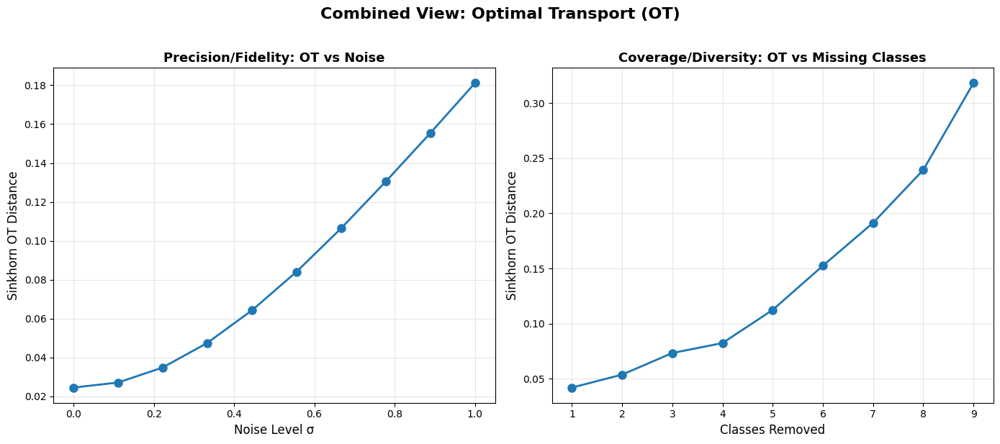

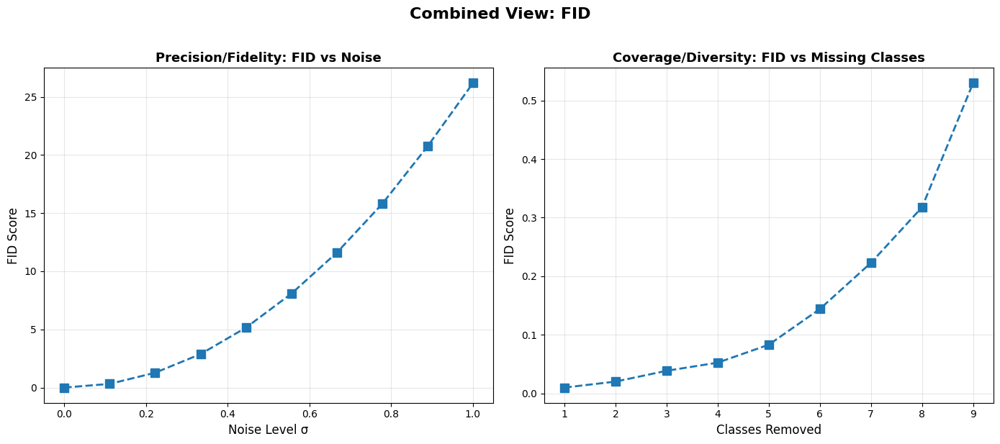


EXPERIMENTAL PIPELINE COMPLETED SUCCESSFULLY!

Summary:
Precision experiment: 10 noise levels tested
Coverage experiment: 9 class removal tests
OT-FID correlation: 0.996


In [23]:
# Step 4: Execute experimental analyses with specialized features
print("\nStep 4: Running experimental analyses...")
precision_experiment_results = run_precision_fidelity_analysis(
    train_ot_subset, test_ot_subset, train_fid_subset, test_fid_subset, blur=0.05)
coverage_experiment_results = run_coverage_diversity_analysis(
    train_ot_subset, test_ot_subset, train_fid_subset, test_fid_subset, train_label_subset, blur=0.05)
# Step 5: Generate comprehensive visualizations
print("\nStep 5: Generating visualizations...")

# Create both visualization types
# Combined views for each metric
combined_ot  = generate_combined_visualizations(
    precision_experiment_results, coverage_experiment_results, metric="ot"
)
combined_fid = generate_combined_visualizations(
    precision_experiment_results, coverage_experiment_results, metric="fid"
)


print("\n" + "="*50)
print("EXPERIMENTAL PIPELINE COMPLETED SUCCESSFULLY!")
print("="*50)

# Print summary statistics
print(f"\nSummary:")
print(f"Precision experiment: {len(precision_experiment_results)} noise levels tested")
print(f"Coverage experiment: {len(coverage_experiment_results)} class removal tests")

# Show correlation between OT and FID
ot_values = [r['ot_distance'] for r in precision_experiment_results]
fid_values = [r['fid_score'] for r in precision_experiment_results]
correlation = np.corrcoef(ot_values, fid_values)[0,1]
print(f"OT-FID correlation: {correlation:.3f}")

In [24]:
# === Updated evaluation script ===
import torch
import torch.nn.functional as F
from torch.utils.data import TensorDataset, DataLoader
from denoising_diffusion_pytorch import Unet, GaussianDiffusion
import matplotlib.pyplot as plt
import numpy as np
import gc

def _grade_ratio(r, tight=1.1, good=1.3, ok=1.5):
    if r <= tight: return "excellent"
    if r <= good:  return "good"
    if r <= ok:    return "borderline"
    return "needs improvement"

def _auto_blur_param(X: np.ndarray, Y: np.ndarray, max_samples=2000):
    """Heuristic for Sinkhorn blur based on median pairwise distance."""
    import torch
    X = torch.as_tensor(X, dtype=torch.float32)
    Y = torch.as_tensor(Y, dtype=torch.float32)
    nx = min(max_samples, X.shape[0]); ny = min(max_samples, Y.shape[0])
    xs = X[torch.randperm(X.shape[0])[:nx]]
    ys = Y[torch.randperm(Y.shape[0])[:ny]]
    with torch.no_grad():
        med = torch.median(torch.cdist(xs, ys, p=2)).item()
    return max(1e-3, 0.5 * med)


In [25]:
def _l2_normalize(arr: np.ndarray) -> np.ndarray:
    arr = np.asarray(arr, dtype=np.float32)
    norms = np.linalg.norm(arr, axis=1, keepdims=True) + 1e-8
    return arr / norms

In [26]:
def load_diffusion_model(checkpoint_path, computation_device):
    """Load and setup diffusion model from checkpoint."""
    try:
        # Define same UNet as during training
        neural_model = Unet(
            dim=64,
            dim_mults=(1, 2, 4),
            channels=1
        ).to(computation_device)

        diffusion_process = GaussianDiffusion(
            neural_model,
            image_size=28,
            timesteps=1000,         # must match training
            sampling_timesteps=100  # fewer for faster inference
        ).to(computation_device)

        # Load checkpoint with error handling
        print(f"Loading checkpoint from: {checkpoint_path}")
        checkpoint_data = torch.load(checkpoint_path, map_location=computation_device)

        # Handle different checkpoint formats
        if "model" in checkpoint_data:
            neural_model.load_state_dict(checkpoint_data["model"])
        elif "model_state_dict" in checkpoint_data:
            neural_model.load_state_dict(checkpoint_data["model_state_dict"])
        else:
            # Assume the checkpoint is just the state dict
            neural_model.load_state_dict(checkpoint_data)

        neural_model.eval()  # Set to evaluation mode
        print("Model loaded successfully!")
        return neural_model, diffusion_process

    except FileNotFoundError:
        print(f"Error: Checkpoint file not found at {checkpoint_path}")
        return None, None
    except Exception as e:
        print(f"Error loading model: {e}")
        return None, None


In [27]:
def generate_samples_in_batches(diffusion_model, total_samples, processing_batch_size=128, computation_device='cuda'):
    """Generate samples in batches with memory management."""
    print(f"Generating {total_samples} samples in batches of {processing_batch_size}...")

    generated_image_batches = []
    samples_generated = 0

    with torch.no_grad():  # Important: disable gradients for inference
        while samples_generated < total_samples:
            current_batch_size = min(processing_batch_size, total_samples - samples_generated)
            try:
                # Generate batch (GaussianDiffusion.sample returns on the model's device)
                generated_batch = diffusion_model.sample(batch_size=current_batch_size)

                # Expect (B,1,28,28) in [-1,1] — clamp just in case
                if generated_batch.dim() == 4 and generated_batch.size(1) == 1:
                    generated_batch = torch.clamp(generated_batch, -1, 1)
                    generated_image_batches.append(generated_batch.cpu())
                    samples_generated += current_batch_size

                    if samples_generated % 500 == 0:
                        print(f"Generated {samples_generated}/{total_samples} samples")
                else:
                    print(f"Warning: Unexpected tensor shape: {generated_batch.shape}")
                    break

            except RuntimeError as e:
                if "out of memory" in str(e).lower():
                    print(f"GPU OOM at batch size {current_batch_size}. Trying smaller batches...")
                    torch.cuda.empty_cache()
                    gc.collect()
                    processing_batch_size = max(16, processing_batch_size // 2)
                    continue
                else:
                    print(f"Error during generation: {e}")
                    break

            # Periodic clean-up
            if samples_generated % 1000 == 0:
                torch.cuda.empty_cache()

    if not generated_image_batches:
        print("Error: No samples were generated successfully")
        return None

    final_generated_images = torch.cat(generated_image_batches, dim=0)[:total_samples]
    print(f"Final generated tensor shape: {final_generated_images.shape}")
    return final_generated_images


def evaluate_generated_sample_quality(
    generated_images,
    train_feature_subset,   # RAW OT features for train (from your pipeline)
    test_feature_subset,    # RAW OT features for test  (from your pipeline)
    trained_feature_network,
    computation_device,
    regularization_param=0.1  # if None -> auto blur
):
    """Extract features from generated samples and compute OT + FID metrics."""
    if generated_images is None:
        print("Error: No generated images to evaluate")
        return None

    print("Extracting features from generated samples...")
    gen_labels = torch.full((len(generated_images),), -1, dtype=torch.long)
    generated_dataset = TensorDataset(generated_images, gen_labels)

    try:
        # --- OT features for generated (raw; extractor handles [-1,1]→[0,1]) ---
        generated_features_full, generated_labels_full = extract_features_for_ot(
            trained_feature_network, generated_dataset, device=computation_device, batch_size=256
        )
        generated_feature_subset, _ = create_balanced_feature_subset(
            generated_features_full, generated_labels_full,
            target_subset_size=min(5000, len(generated_features_full)),
            enable_class_balancing=False
        )
        print(f"Generated features shape: {generated_feature_subset.shape}")
    except Exception as e:
        print(f"Error extracting features: {e}")
        return None

    # ---------- Distances ----------
    print("Computing distance metrics...")

    # Optional: auto blur tuned to train vs test geometry
    blur = regularization_param
    if blur is None:
        try:
            blur = _auto_blur_param(train_feature_subset, test_feature_subset)
            print(f"(auto) Using blur={blur:.4f} for Sinkhorn")
        except Exception:
            blur = 0.05
            print("(auto) blur selection failed; fallback blur=0.05")

    try:
        # ------ OT (raw features; your calculate_transport_distance does L2-normalize inside) ------
        d_tt_ot = calculate_transport_distance(train_feature_subset, test_feature_subset,  blur_param=blur)
        d_tg_ot = calculate_transport_distance(train_feature_subset, generated_feature_subset, blur_param=blur)
        d_sg_ot = calculate_transport_distance(test_feature_subset,  generated_feature_subset,  blur_param=blur)

        # ------ FID (normalize copies so we don't change callers' arrays) ------
        train_fid = _l2_normalize(train_feature_subset)
        test_fid  = _l2_normalize(test_feature_subset)
        gen_fid   = _l2_normalize(generated_feature_subset)

        d_tt_fid = calculate_frechet_distance(train_fid, test_fid)
        d_tg_fid = calculate_frechet_distance(train_fid, gen_fid)
        d_sg_fid = calculate_frechet_distance(test_fid,  gen_fid)

        # ---------- Ratio-based interpretation (scale-invariant) ----------
        eps = 1e-12
        r_cov_ot = d_tg_ot / (d_tt_ot + eps)   # coverage ratio (train–gen vs train–test)
        r_fid_ot = d_sg_ot / (d_tt_ot + eps)   # fidelity ratio  (test–gen  vs train–test)

        r_cov_fd = d_tg_fid / (d_tt_fid + eps) if d_tt_fid > 0 else float('inf')
        r_fid_fd = d_sg_fid / (d_tt_fid + eps) if d_tt_fid > 0 else float('inf')

        print("\n" + "="*50)
        print("DIFFUSION MODEL EVALUATION RESULTS")
        print("="*50)

        print("\n=== OT Distances ===")
        print(f"Train-Test: {d_tt_ot:.6f} (baseline)")
        print(f"Train-Gen:  {d_tg_ot:.6f}  | ratio={r_cov_ot:.2f} → { _grade_ratio(r_cov_ot) }")
        print(f"Test-Gen:   {d_sg_ot:.6f}  | ratio={r_fid_ot:.2f} → { _grade_ratio(r_fid_ot) }")

        print("\n=== FID Scores ===")
        print(f"Train-Test: {d_tt_fid:.6f} (baseline)")
        print(f"Train-Gen:  {d_tg_fid:.6f}  | ratio={r_cov_fd:.2f} → { _grade_ratio(r_cov_fd) }")
        print(f"Test-Gen:   {d_sg_fid:.6f}  | ratio={r_fid_fd:.2f} → { _grade_ratio(r_fid_fd) }")

        # A single scalar summary: mean of the four ratios
        quality_ratio = float(np.mean([r_cov_ot, r_fid_ot, r_cov_fd, r_fid_fd]))
        print("\n=== Quality Summary ===")
        print(f"Mean ratio across OT/FID: {quality_ratio:.2f} "
              f"({ _grade_ratio(quality_ratio) })")

        return {
            'ot_distances': {'train_test': d_tt_ot, 'train_gen': d_tg_ot, 'test_gen': d_sg_ot},
            'fid_scores':  {'train_test': d_tt_fid, 'train_gen': d_tg_fid, 'test_gen': d_sg_fid},
            'ratios':      {'ot_cov': r_cov_ot, 'ot_fid': r_fid_ot, 'fid_cov': r_cov_fd, 'fid_fid': r_fid_fd},
            'quality_ratio': quality_ratio,
            'generated_features': generated_feature_subset
        }

    except Exception as e:
        print(f"Error computing metrics: {e}")
        return None

In [28]:

def run_complete_diffusion_evaluation(
    checkpoint_path,
    train_feature_subset,   # pass your RAW OT train subset (e.g., train_ot_subset)
    test_feature_subset,    # pass your RAW OT test  subset (e.g., test_ot_subset)
    trained_feature_network,
    computation_device='cuda',
    total_samples=5000
):
    """Main function to evaluate diffusion model."""
    print("Starting diffusion model evaluation...")

    # Load model
    neural_model, diffusion_process = load_diffusion_model(checkpoint_path, computation_device)
    if neural_model is None or diffusion_process is None:
        return None

    # Generate samples
    generated_image_samples = generate_samples_in_batches(
        diffusion_process,
        total_samples=total_samples,
        processing_batch_size=256,  # adjust based on GPU memory
        computation_device=computation_device
    )
    if generated_image_samples is None:
        return None

    # Evaluate
    evaluation_results = evaluate_generated_sample_quality(
        generated_image_samples,
        train_feature_subset,
        test_feature_subset,
        trained_feature_network,
        computation_device
    )

    # Clean up
    del neural_model, diffusion_process, generated_image_samples
    torch.cuda.empty_cache()
    gc.collect()
    return evaluation_results

In [29]:
epoch_results = []
computing_device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Using device: {computing_device}")

max_epoch = 35  # or whatever your last epoch is
for ep in range(1, max_epoch + 1):
    results = run_complete_diffusion_evaluation(
        checkpoint_path=f"/content/drive/MyDrive/_ddpm_mnist_checkpoints/ddpm_epoch{ep:03d}.pt",
        train_feature_subset=train_ot_subset,   # <-- pass RAW OT train features
        test_feature_subset=test_ot_subset,     # <-- pass RAW OT test  features
        trained_feature_network=trained_feature_network,
        computation_device=computing_device,
        total_samples=1500
    )
    if results:
        epoch_results.append({
            'epoch': ep,
            'ot_train_gen':   results['ot_distances']['train_gen'],
            'ot_test_gen':    results['ot_distances']['test_gen'],
            'fid_train_gen':  results['fid_scores']['train_gen'],
            'fid_test_gen':   results['fid_scores']['test_gen'],
            'ot_train_test':  results['ot_distances']['train_test'],
            'fid_train_test': results['fid_scores']['train_test']
        })

Using device: cuda
Starting diffusion model evaluation...
Loading checkpoint from: /content/drive/MyDrive/_ddpm_mnist_checkpoints/ddpm_epoch001.pt
Model loaded successfully!
Generating 1500 samples in batches of 256...


sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

Generated 1500/1500 samples
Final generated tensor shape: torch.Size([1500, 1, 28, 28])
Extracting features from generated samples...


Extracting OT features: 100%|██████████| 6/6 [00:00<00:00, 194.08it/s]

Generated features shape: (1500, 128)
Computing distance metrics...



DIFFUSION MODEL EVALUATION RESULTS

=== OT Distances ===
Train-Test: 0.013730 (baseline)
Train-Gen:  0.230681  | ratio=16.80 → needs improvement
Test-Gen:   0.231357  | ratio=16.85 → needs improvement

=== FID Scores ===
Train-Test: 0.001075 (baseline)
Train-Gen:  0.435934  | ratio=405.63 → needs improvement
Test-Gen:   0.436925  | ratio=406.55 → needs improvement

=== Quality Summary ===
Mean ratio across OT/FID: 211.46 (needs improvement)
Starting diffusion model evaluation...
Loading checkpoint from: /content/drive/MyDrive/_ddpm_mnist_checkpoints/ddpm_epoch002.pt
Model loaded successfully!
Generating 1500 samples in batches of 256...


sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

Generated 1500/1500 samples
Final generated tensor shape: torch.Size([1500, 1, 28, 28])
Extracting features from generated samples...


Extracting OT features: 100%|██████████| 6/6 [00:00<00:00, 209.49it/s]

Generated features shape: (1500, 128)
Computing distance metrics...



DIFFUSION MODEL EVALUATION RESULTS

=== OT Distances ===
Train-Test: 0.013730 (baseline)
Train-Gen:  0.159666  | ratio=11.63 → needs improvement
Test-Gen:   0.160064  | ratio=11.66 → needs improvement

=== FID Scores ===
Train-Test: 0.001075 (baseline)
Train-Gen:  0.275343  | ratio=256.20 → needs improvement
Test-Gen:   0.276032  | ratio=256.85 → needs improvement

=== Quality Summary ===
Mean ratio across OT/FID: 134.08 (needs improvement)
Starting diffusion model evaluation...
Loading checkpoint from: /content/drive/MyDrive/_ddpm_mnist_checkpoints/ddpm_epoch003.pt
Model loaded successfully!
Generating 1500 samples in batches of 256...


sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

Generated 1500/1500 samples
Final generated tensor shape: torch.Size([1500, 1, 28, 28])
Extracting features from generated samples...


Extracting OT features: 100%|██████████| 6/6 [00:00<00:00, 166.82it/s]

Generated features shape: (1500, 128)
Computing distance metrics...



DIFFUSION MODEL EVALUATION RESULTS

=== OT Distances ===
Train-Test: 0.013730 (baseline)
Train-Gen:  0.169949  | ratio=12.38 → needs improvement
Test-Gen:   0.170585  | ratio=12.42 → needs improvement

=== FID Scores ===
Train-Test: 0.001075 (baseline)
Train-Gen:  0.297739  | ratio=277.04 → needs improvement
Test-Gen:   0.298740  | ratio=277.97 → needs improvement

=== Quality Summary ===
Mean ratio across OT/FID: 144.96 (needs improvement)
Starting diffusion model evaluation...
Loading checkpoint from: /content/drive/MyDrive/_ddpm_mnist_checkpoints/ddpm_epoch004.pt
Model loaded successfully!
Generating 1500 samples in batches of 256...


sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

Generated 1500/1500 samples
Final generated tensor shape: torch.Size([1500, 1, 28, 28])
Extracting features from generated samples...


Extracting OT features: 100%|██████████| 6/6 [00:00<00:00, 212.53it/s]

Generated features shape: (1500, 128)
Computing distance metrics...



DIFFUSION MODEL EVALUATION RESULTS

=== OT Distances ===
Train-Test: 0.013730 (baseline)
Train-Gen:  0.174869  | ratio=12.74 → needs improvement
Test-Gen:   0.175370  | ratio=12.77 → needs improvement

=== FID Scores ===
Train-Test: 0.001075 (baseline)
Train-Gen:  0.306762  | ratio=285.44 → needs improvement
Test-Gen:   0.307413  | ratio=286.05 → needs improvement

=== Quality Summary ===
Mean ratio across OT/FID: 149.25 (needs improvement)
Starting diffusion model evaluation...
Loading checkpoint from: /content/drive/MyDrive/_ddpm_mnist_checkpoints/ddpm_epoch005.pt
Model loaded successfully!
Generating 1500 samples in batches of 256...


sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

Generated 1500/1500 samples
Final generated tensor shape: torch.Size([1500, 1, 28, 28])
Extracting features from generated samples...


Extracting OT features: 100%|██████████| 6/6 [00:00<00:00, 201.68it/s]

Generated features shape: (1500, 128)
Computing distance metrics...



DIFFUSION MODEL EVALUATION RESULTS

=== OT Distances ===
Train-Test: 0.013730 (baseline)
Train-Gen:  0.164983  | ratio=12.02 → needs improvement
Test-Gen:   0.165442  | ratio=12.05 → needs improvement

=== FID Scores ===
Train-Test: 0.001075 (baseline)
Train-Gen:  0.283906  | ratio=264.17 → needs improvement
Test-Gen:   0.284388  | ratio=264.62 → needs improvement

=== Quality Summary ===
Mean ratio across OT/FID: 138.21 (needs improvement)
Starting diffusion model evaluation...
Loading checkpoint from: /content/drive/MyDrive/_ddpm_mnist_checkpoints/ddpm_epoch006.pt
Model loaded successfully!
Generating 1500 samples in batches of 256...


sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

Generated 1500/1500 samples
Final generated tensor shape: torch.Size([1500, 1, 28, 28])
Extracting features from generated samples...


Extracting OT features: 100%|██████████| 6/6 [00:00<00:00, 190.15it/s]

Generated features shape: (1500, 128)
Computing distance metrics...



DIFFUSION MODEL EVALUATION RESULTS

=== OT Distances ===
Train-Test: 0.013730 (baseline)
Train-Gen:  0.167784  | ratio=12.22 → needs improvement
Test-Gen:   0.168509  | ratio=12.27 → needs improvement

=== FID Scores ===
Train-Test: 0.001075 (baseline)
Train-Gen:  0.293683  | ratio=273.27 → needs improvement
Test-Gen:   0.294882  | ratio=274.38 → needs improvement

=== Quality Summary ===
Mean ratio across OT/FID: 143.04 (needs improvement)
Starting diffusion model evaluation...
Loading checkpoint from: /content/drive/MyDrive/_ddpm_mnist_checkpoints/ddpm_epoch007.pt
Model loaded successfully!
Generating 1500 samples in batches of 256...


sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

Generated 1500/1500 samples
Final generated tensor shape: torch.Size([1500, 1, 28, 28])
Extracting features from generated samples...


Extracting OT features: 100%|██████████| 6/6 [00:00<00:00, 201.98it/s]

Generated features shape: (1500, 128)
Computing distance metrics...



DIFFUSION MODEL EVALUATION RESULTS

=== OT Distances ===
Train-Test: 0.013730 (baseline)
Train-Gen:  0.126337  | ratio=9.20 → needs improvement
Test-Gen:   0.126797  | ratio=9.24 → needs improvement

=== FID Scores ===
Train-Test: 0.001075 (baseline)
Train-Gen:  0.217714  | ratio=202.58 → needs improvement
Test-Gen:   0.218496  | ratio=203.31 → needs improvement

=== Quality Summary ===
Mean ratio across OT/FID: 106.08 (needs improvement)
Starting diffusion model evaluation...
Loading checkpoint from: /content/drive/MyDrive/_ddpm_mnist_checkpoints/ddpm_epoch008.pt
Model loaded successfully!
Generating 1500 samples in batches of 256...


sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

Generated 1500/1500 samples
Final generated tensor shape: torch.Size([1500, 1, 28, 28])
Extracting features from generated samples...


Extracting OT features: 100%|██████████| 6/6 [00:00<00:00, 206.52it/s]

Generated features shape: (1500, 128)
Computing distance metrics...



DIFFUSION MODEL EVALUATION RESULTS

=== OT Distances ===
Train-Test: 0.013730 (baseline)
Train-Gen:  0.151614  | ratio=11.04 → needs improvement
Test-Gen:   0.151991  | ratio=11.07 → needs improvement

=== FID Scores ===
Train-Test: 0.001075 (baseline)
Train-Gen:  0.261588  | ratio=243.41 → needs improvement
Test-Gen:   0.262285  | ratio=244.05 → needs improvement

=== Quality Summary ===
Mean ratio across OT/FID: 127.39 (needs improvement)
Starting diffusion model evaluation...
Loading checkpoint from: /content/drive/MyDrive/_ddpm_mnist_checkpoints/ddpm_epoch009.pt
Model loaded successfully!
Generating 1500 samples in batches of 256...


sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

Generated 1500/1500 samples
Final generated tensor shape: torch.Size([1500, 1, 28, 28])
Extracting features from generated samples...


Extracting OT features: 100%|██████████| 6/6 [00:00<00:00, 205.81it/s]

Generated features shape: (1500, 128)
Computing distance metrics...



DIFFUSION MODEL EVALUATION RESULTS

=== OT Distances ===
Train-Test: 0.013730 (baseline)
Train-Gen:  0.145820  | ratio=10.62 → needs improvement
Test-Gen:   0.146726  | ratio=10.69 → needs improvement

=== FID Scores ===
Train-Test: 0.001075 (baseline)
Train-Gen:  0.250030  | ratio=232.65 → needs improvement
Test-Gen:   0.251738  | ratio=234.24 → needs improvement

=== Quality Summary ===
Mean ratio across OT/FID: 122.05 (needs improvement)
Starting diffusion model evaluation...
Loading checkpoint from: /content/drive/MyDrive/_ddpm_mnist_checkpoints/ddpm_epoch010.pt
Model loaded successfully!
Generating 1500 samples in batches of 256...


sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

Generated 1500/1500 samples
Final generated tensor shape: torch.Size([1500, 1, 28, 28])
Extracting features from generated samples...


Extracting OT features: 100%|██████████| 6/6 [00:00<00:00, 165.05it/s]

Generated features shape: (1500, 128)
Computing distance metrics...



DIFFUSION MODEL EVALUATION RESULTS

=== OT Distances ===
Train-Test: 0.013730 (baseline)
Train-Gen:  0.144721  | ratio=10.54 → needs improvement
Test-Gen:   0.145481  | ratio=10.60 → needs improvement

=== FID Scores ===
Train-Test: 0.001075 (baseline)
Train-Gen:  0.251565  | ratio=234.08 → needs improvement
Test-Gen:   0.252761  | ratio=235.19 → needs improvement

=== Quality Summary ===
Mean ratio across OT/FID: 122.60 (needs improvement)
Starting diffusion model evaluation...
Loading checkpoint from: /content/drive/MyDrive/_ddpm_mnist_checkpoints/ddpm_epoch011.pt
Model loaded successfully!
Generating 1500 samples in batches of 256...


sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

Generated 1500/1500 samples
Final generated tensor shape: torch.Size([1500, 1, 28, 28])
Extracting features from generated samples...


Extracting OT features: 100%|██████████| 6/6 [00:00<00:00, 207.27it/s]

Generated features shape: (1500, 128)
Computing distance metrics...



DIFFUSION MODEL EVALUATION RESULTS

=== OT Distances ===
Train-Test: 0.013730 (baseline)
Train-Gen:  0.132197  | ratio=9.63 → needs improvement
Test-Gen:   0.132811  | ratio=9.67 → needs improvement

=== FID Scores ===
Train-Test: 0.001075 (baseline)
Train-Gen:  0.226603  | ratio=210.85 → needs improvement
Test-Gen:   0.227661  | ratio=211.84 → needs improvement

=== Quality Summary ===
Mean ratio across OT/FID: 110.50 (needs improvement)
Starting diffusion model evaluation...
Loading checkpoint from: /content/drive/MyDrive/_ddpm_mnist_checkpoints/ddpm_epoch012.pt
Model loaded successfully!
Generating 1500 samples in batches of 256...


sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

Generated 1500/1500 samples
Final generated tensor shape: torch.Size([1500, 1, 28, 28])
Extracting features from generated samples...


Extracting OT features: 100%|██████████| 6/6 [00:00<00:00, 209.51it/s]

Generated features shape: (1500, 128)
Computing distance metrics...



DIFFUSION MODEL EVALUATION RESULTS

=== OT Distances ===
Train-Test: 0.013730 (baseline)
Train-Gen:  0.144007  | ratio=10.49 → needs improvement
Test-Gen:   0.144899  | ratio=10.55 → needs improvement

=== FID Scores ===
Train-Test: 0.001075 (baseline)
Train-Gen:  0.248349  | ratio=231.09 → needs improvement
Test-Gen:   0.249475  | ratio=232.13 → needs improvement

=== Quality Summary ===
Mean ratio across OT/FID: 121.07 (needs improvement)
Starting diffusion model evaluation...
Loading checkpoint from: /content/drive/MyDrive/_ddpm_mnist_checkpoints/ddpm_epoch013.pt
Model loaded successfully!
Generating 1500 samples in batches of 256...


sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

Generated 1500/1500 samples
Final generated tensor shape: torch.Size([1500, 1, 28, 28])
Extracting features from generated samples...


Extracting OT features: 100%|██████████| 6/6 [00:00<00:00, 205.30it/s]

Generated features shape: (1500, 128)
Computing distance metrics...



DIFFUSION MODEL EVALUATION RESULTS

=== OT Distances ===
Train-Test: 0.013730 (baseline)
Train-Gen:  0.142773  | ratio=10.40 → needs improvement
Test-Gen:   0.143146  | ratio=10.43 → needs improvement

=== FID Scores ===
Train-Test: 0.001075 (baseline)
Train-Gen:  0.245994  | ratio=228.89 → needs improvement
Test-Gen:   0.246488  | ratio=229.35 → needs improvement

=== Quality Summary ===
Mean ratio across OT/FID: 119.77 (needs improvement)
Starting diffusion model evaluation...
Loading checkpoint from: /content/drive/MyDrive/_ddpm_mnist_checkpoints/ddpm_epoch014.pt
Model loaded successfully!
Generating 1500 samples in batches of 256...


sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

Generated 1500/1500 samples
Final generated tensor shape: torch.Size([1500, 1, 28, 28])
Extracting features from generated samples...


Extracting OT features: 100%|██████████| 6/6 [00:00<00:00, 206.96it/s]

Generated features shape: (1500, 128)
Computing distance metrics...



DIFFUSION MODEL EVALUATION RESULTS

=== OT Distances ===
Train-Test: 0.013730 (baseline)
Train-Gen:  0.133076  | ratio=9.69 → needs improvement
Test-Gen:   0.133397  | ratio=9.72 → needs improvement

=== FID Scores ===
Train-Test: 0.001075 (baseline)
Train-Gen:  0.226090  | ratio=210.37 → needs improvement
Test-Gen:   0.226660  | ratio=210.91 → needs improvement

=== Quality Summary ===
Mean ratio across OT/FID: 110.17 (needs improvement)
Starting diffusion model evaluation...
Loading checkpoint from: /content/drive/MyDrive/_ddpm_mnist_checkpoints/ddpm_epoch015.pt
Model loaded successfully!
Generating 1500 samples in batches of 256...


sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

Generated 1500/1500 samples
Final generated tensor shape: torch.Size([1500, 1, 28, 28])
Extracting features from generated samples...


Extracting OT features: 100%|██████████| 6/6 [00:00<00:00, 202.71it/s]

Generated features shape: (1500, 128)
Computing distance metrics...



DIFFUSION MODEL EVALUATION RESULTS

=== OT Distances ===
Train-Test: 0.013730 (baseline)
Train-Gen:  0.126407  | ratio=9.21 → needs improvement
Test-Gen:   0.126869  | ratio=9.24 → needs improvement

=== FID Scores ===
Train-Test: 0.001075 (baseline)
Train-Gen:  0.219131  | ratio=203.90 → needs improvement
Test-Gen:   0.219743  | ratio=204.47 → needs improvement

=== Quality Summary ===
Mean ratio across OT/FID: 106.70 (needs improvement)
Starting diffusion model evaluation...
Loading checkpoint from: /content/drive/MyDrive/_ddpm_mnist_checkpoints/ddpm_epoch016.pt
Model loaded successfully!
Generating 1500 samples in batches of 256...


sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

Generated 1500/1500 samples
Final generated tensor shape: torch.Size([1500, 1, 28, 28])
Extracting features from generated samples...


Extracting OT features: 100%|██████████| 6/6 [00:00<00:00, 166.17it/s]

Generated features shape: (1500, 128)
Computing distance metrics...



DIFFUSION MODEL EVALUATION RESULTS

=== OT Distances ===
Train-Test: 0.013730 (baseline)
Train-Gen:  0.137792  | ratio=10.04 → needs improvement
Test-Gen:   0.138174  | ratio=10.06 → needs improvement

=== FID Scores ===
Train-Test: 0.001075 (baseline)
Train-Gen:  0.237370  | ratio=220.87 → needs improvement
Test-Gen:   0.237943  | ratio=221.40 → needs improvement

=== Quality Summary ===
Mean ratio across OT/FID: 115.59 (needs improvement)
Starting diffusion model evaluation...
Loading checkpoint from: /content/drive/MyDrive/_ddpm_mnist_checkpoints/ddpm_epoch017.pt
Model loaded successfully!
Generating 1500 samples in batches of 256...


sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

Generated 1500/1500 samples
Final generated tensor shape: torch.Size([1500, 1, 28, 28])
Extracting features from generated samples...


Extracting OT features: 100%|██████████| 6/6 [00:00<00:00, 178.28it/s]

Generated features shape: (1500, 128)
Computing distance metrics...



DIFFUSION MODEL EVALUATION RESULTS

=== OT Distances ===
Train-Test: 0.013730 (baseline)
Train-Gen:  0.133081  | ratio=9.69 → needs improvement
Test-Gen:   0.134181  | ratio=9.77 → needs improvement

=== FID Scores ===
Train-Test: 0.001075 (baseline)
Train-Gen:  0.229866  | ratio=213.89 → needs improvement
Test-Gen:   0.231660  | ratio=215.56 → needs improvement

=== Quality Summary ===
Mean ratio across OT/FID: 112.23 (needs improvement)
Starting diffusion model evaluation...
Loading checkpoint from: /content/drive/MyDrive/_ddpm_mnist_checkpoints/ddpm_epoch018.pt
Model loaded successfully!
Generating 1500 samples in batches of 256...


sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

Generated 1500/1500 samples
Final generated tensor shape: torch.Size([1500, 1, 28, 28])
Extracting features from generated samples...


Extracting OT features: 100%|██████████| 6/6 [00:00<00:00, 201.08it/s]

Generated features shape: (1500, 128)
Computing distance metrics...



DIFFUSION MODEL EVALUATION RESULTS

=== OT Distances ===
Train-Test: 0.013730 (baseline)
Train-Gen:  0.129951  | ratio=9.46 → needs improvement
Test-Gen:   0.130504  | ratio=9.51 → needs improvement

=== FID Scores ===
Train-Test: 0.001075 (baseline)
Train-Gen:  0.223297  | ratio=207.78 → needs improvement
Test-Gen:   0.224118  | ratio=208.54 → needs improvement

=== Quality Summary ===
Mean ratio across OT/FID: 108.82 (needs improvement)
Starting diffusion model evaluation...
Loading checkpoint from: /content/drive/MyDrive/_ddpm_mnist_checkpoints/ddpm_epoch019.pt
Model loaded successfully!
Generating 1500 samples in batches of 256...


sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

Generated 1500/1500 samples
Final generated tensor shape: torch.Size([1500, 1, 28, 28])
Extracting features from generated samples...


Extracting OT features: 100%|██████████| 6/6 [00:00<00:00, 210.07it/s]

Generated features shape: (1500, 128)
Computing distance metrics...



DIFFUSION MODEL EVALUATION RESULTS

=== OT Distances ===
Train-Test: 0.013730 (baseline)
Train-Gen:  0.145081  | ratio=10.57 → needs improvement
Test-Gen:   0.145913  | ratio=10.63 → needs improvement

=== FID Scores ===
Train-Test: 0.001075 (baseline)
Train-Gen:  0.250446  | ratio=233.04 → needs improvement
Test-Gen:   0.251751  | ratio=234.25 → needs improvement

=== Quality Summary ===
Mean ratio across OT/FID: 122.12 (needs improvement)
Starting diffusion model evaluation...
Loading checkpoint from: /content/drive/MyDrive/_ddpm_mnist_checkpoints/ddpm_epoch020.pt
Model loaded successfully!
Generating 1500 samples in batches of 256...


sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

Generated 1500/1500 samples
Final generated tensor shape: torch.Size([1500, 1, 28, 28])
Extracting features from generated samples...


Extracting OT features: 100%|██████████| 6/6 [00:00<00:00, 199.36it/s]

Generated features shape: (1500, 128)
Computing distance metrics...



DIFFUSION MODEL EVALUATION RESULTS

=== OT Distances ===
Train-Test: 0.013730 (baseline)
Train-Gen:  0.136612  | ratio=9.95 → needs improvement
Test-Gen:   0.137648  | ratio=10.03 → needs improvement

=== FID Scores ===
Train-Test: 0.001075 (baseline)
Train-Gen:  0.231915  | ratio=215.79 → needs improvement
Test-Gen:   0.233664  | ratio=217.42 → needs improvement

=== Quality Summary ===
Mean ratio across OT/FID: 113.30 (needs improvement)
Starting diffusion model evaluation...
Loading checkpoint from: /content/drive/MyDrive/_ddpm_mnist_checkpoints/ddpm_epoch021.pt
Model loaded successfully!
Generating 1500 samples in batches of 256...


sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

Generated 1500/1500 samples
Final generated tensor shape: torch.Size([1500, 1, 28, 28])
Extracting features from generated samples...


Extracting OT features: 100%|██████████| 6/6 [00:00<00:00, 206.45it/s]

Generated features shape: (1500, 128)
Computing distance metrics...



DIFFUSION MODEL EVALUATION RESULTS

=== OT Distances ===
Train-Test: 0.013730 (baseline)
Train-Gen:  0.132614  | ratio=9.66 → needs improvement
Test-Gen:   0.133496  | ratio=9.72 → needs improvement

=== FID Scores ===
Train-Test: 0.001075 (baseline)
Train-Gen:  0.226046  | ratio=210.33 → needs improvement
Test-Gen:   0.227601  | ratio=211.78 → needs improvement

=== Quality Summary ===
Mean ratio across OT/FID: 110.37 (needs improvement)
Starting diffusion model evaluation...
Loading checkpoint from: /content/drive/MyDrive/_ddpm_mnist_checkpoints/ddpm_epoch022.pt
Model loaded successfully!
Generating 1500 samples in batches of 256...


sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

Generated 1500/1500 samples
Final generated tensor shape: torch.Size([1500, 1, 28, 28])
Extracting features from generated samples...


Extracting OT features: 100%|██████████| 6/6 [00:00<00:00, 204.40it/s]

Generated features shape: (1500, 128)
Computing distance metrics...



DIFFUSION MODEL EVALUATION RESULTS

=== OT Distances ===
Train-Test: 0.013730 (baseline)
Train-Gen:  0.131172  | ratio=9.55 → needs improvement
Test-Gen:   0.132090  | ratio=9.62 → needs improvement

=== FID Scores ===
Train-Test: 0.001075 (baseline)
Train-Gen:  0.229960  | ratio=213.98 → needs improvement
Test-Gen:   0.231148  | ratio=215.08 → needs improvement

=== Quality Summary ===
Mean ratio across OT/FID: 112.06 (needs improvement)
Starting diffusion model evaluation...
Loading checkpoint from: /content/drive/MyDrive/_ddpm_mnist_checkpoints/ddpm_epoch023.pt
Model loaded successfully!
Generating 1500 samples in batches of 256...


sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

Generated 1500/1500 samples
Final generated tensor shape: torch.Size([1500, 1, 28, 28])
Extracting features from generated samples...


Extracting OT features: 100%|██████████| 6/6 [00:00<00:00, 172.90it/s]

Generated features shape: (1500, 128)
Computing distance metrics...



DIFFUSION MODEL EVALUATION RESULTS

=== OT Distances ===
Train-Test: 0.013730 (baseline)
Train-Gen:  0.133257  | ratio=9.71 → needs improvement
Test-Gen:   0.133975  | ratio=9.76 → needs improvement

=== FID Scores ===
Train-Test: 0.001075 (baseline)
Train-Gen:  0.228498  | ratio=212.61 → needs improvement
Test-Gen:   0.229700  | ratio=213.73 → needs improvement

=== Quality Summary ===
Mean ratio across OT/FID: 111.45 (needs improvement)
Starting diffusion model evaluation...
Loading checkpoint from: /content/drive/MyDrive/_ddpm_mnist_checkpoints/ddpm_epoch024.pt
Model loaded successfully!
Generating 1500 samples in batches of 256...


sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

Generated 1500/1500 samples
Final generated tensor shape: torch.Size([1500, 1, 28, 28])
Extracting features from generated samples...


Extracting OT features: 100%|██████████| 6/6 [00:00<00:00, 164.78it/s]

Generated features shape: (1500, 128)
Computing distance metrics...



DIFFUSION MODEL EVALUATION RESULTS

=== OT Distances ===
Train-Test: 0.013730 (baseline)
Train-Gen:  0.145622  | ratio=10.61 → needs improvement
Test-Gen:   0.146263  | ratio=10.65 → needs improvement

=== FID Scores ===
Train-Test: 0.001075 (baseline)
Train-Gen:  0.250474  | ratio=233.06 → needs improvement
Test-Gen:   0.251567  | ratio=234.08 → needs improvement

=== Quality Summary ===
Mean ratio across OT/FID: 122.10 (needs improvement)
Starting diffusion model evaluation...
Loading checkpoint from: /content/drive/MyDrive/_ddpm_mnist_checkpoints/ddpm_epoch025.pt
Model loaded successfully!
Generating 1500 samples in batches of 256...


sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

Generated 1500/1500 samples
Final generated tensor shape: torch.Size([1500, 1, 28, 28])
Extracting features from generated samples...


Extracting OT features: 100%|██████████| 6/6 [00:00<00:00, 167.66it/s]

Generated features shape: (1500, 128)
Computing distance metrics...



DIFFUSION MODEL EVALUATION RESULTS

=== OT Distances ===
Train-Test: 0.013730 (baseline)
Train-Gen:  0.133764  | ratio=9.74 → needs improvement
Test-Gen:   0.134541  | ratio=9.80 → needs improvement

=== FID Scores ===
Train-Test: 0.001075 (baseline)
Train-Gen:  0.238241  | ratio=221.68 → needs improvement
Test-Gen:   0.239272  | ratio=222.64 → needs improvement

=== Quality Summary ===
Mean ratio across OT/FID: 115.97 (needs improvement)
Starting diffusion model evaluation...
Loading checkpoint from: /content/drive/MyDrive/_ddpm_mnist_checkpoints/ddpm_epoch026.pt
Model loaded successfully!
Generating 1500 samples in batches of 256...


sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

Generated 1500/1500 samples
Final generated tensor shape: torch.Size([1500, 1, 28, 28])
Extracting features from generated samples...


Extracting OT features: 100%|██████████| 6/6 [00:00<00:00, 206.35it/s]

Generated features shape: (1500, 128)
Computing distance metrics...



DIFFUSION MODEL EVALUATION RESULTS

=== OT Distances ===
Train-Test: 0.013730 (baseline)
Train-Gen:  0.127126  | ratio=9.26 → needs improvement
Test-Gen:   0.127968  | ratio=9.32 → needs improvement

=== FID Scores ===
Train-Test: 0.001075 (baseline)
Train-Gen:  0.220904  | ratio=205.55 → needs improvement
Test-Gen:   0.221989  | ratio=206.56 → needs improvement

=== Quality Summary ===
Mean ratio across OT/FID: 107.67 (needs improvement)
Starting diffusion model evaluation...
Loading checkpoint from: /content/drive/MyDrive/_ddpm_mnist_checkpoints/ddpm_epoch027.pt
Model loaded successfully!
Generating 1500 samples in batches of 256...


sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

Generated 1500/1500 samples
Final generated tensor shape: torch.Size([1500, 1, 28, 28])
Extracting features from generated samples...


Extracting OT features: 100%|██████████| 6/6 [00:00<00:00, 198.74it/s]

Generated features shape: (1500, 128)
Computing distance metrics...



DIFFUSION MODEL EVALUATION RESULTS

=== OT Distances ===
Train-Test: 0.013730 (baseline)
Train-Gen:  0.145033  | ratio=10.56 → needs improvement
Test-Gen:   0.145537  | ratio=10.60 → needs improvement

=== FID Scores ===
Train-Test: 0.001075 (baseline)
Train-Gen:  0.249191  | ratio=231.87 → needs improvement
Test-Gen:   0.249924  | ratio=232.55 → needs improvement

=== Quality Summary ===
Mean ratio across OT/FID: 121.40 (needs improvement)
Starting diffusion model evaluation...
Loading checkpoint from: /content/drive/MyDrive/_ddpm_mnist_checkpoints/ddpm_epoch028.pt
Model loaded successfully!
Generating 1500 samples in batches of 256...


sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

Generated 1500/1500 samples
Final generated tensor shape: torch.Size([1500, 1, 28, 28])
Extracting features from generated samples...


Extracting OT features: 100%|██████████| 6/6 [00:00<00:00, 166.03it/s]

Generated features shape: (1500, 128)
Computing distance metrics...



DIFFUSION MODEL EVALUATION RESULTS

=== OT Distances ===
Train-Test: 0.013730 (baseline)
Train-Gen:  0.135125  | ratio=9.84 → needs improvement
Test-Gen:   0.135822  | ratio=9.89 → needs improvement

=== FID Scores ===
Train-Test: 0.001075 (baseline)
Train-Gen:  0.231901  | ratio=215.78 → needs improvement
Test-Gen:   0.232977  | ratio=216.78 → needs improvement

=== Quality Summary ===
Mean ratio across OT/FID: 113.07 (needs improvement)
Starting diffusion model evaluation...
Loading checkpoint from: /content/drive/MyDrive/_ddpm_mnist_checkpoints/ddpm_epoch029.pt
Model loaded successfully!
Generating 1500 samples in batches of 256...


sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

Generated 1500/1500 samples
Final generated tensor shape: torch.Size([1500, 1, 28, 28])
Extracting features from generated samples...


Extracting OT features: 100%|██████████| 6/6 [00:00<00:00, 190.34it/s]

Generated features shape: (1500, 128)
Computing distance metrics...



DIFFUSION MODEL EVALUATION RESULTS

=== OT Distances ===
Train-Test: 0.013730 (baseline)
Train-Gen:  0.141679  | ratio=10.32 → needs improvement
Test-Gen:   0.142457  | ratio=10.38 → needs improvement

=== FID Scores ===
Train-Test: 0.001075 (baseline)
Train-Gen:  0.243882  | ratio=226.93 → needs improvement
Test-Gen:   0.245194  | ratio=228.15 → needs improvement

=== Quality Summary ===
Mean ratio across OT/FID: 118.94 (needs improvement)
Starting diffusion model evaluation...
Loading checkpoint from: /content/drive/MyDrive/_ddpm_mnist_checkpoints/ddpm_epoch030.pt
Model loaded successfully!
Generating 1500 samples in batches of 256...


sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

Generated 1500/1500 samples
Final generated tensor shape: torch.Size([1500, 1, 28, 28])
Extracting features from generated samples...


Extracting OT features: 100%|██████████| 6/6 [00:00<00:00, 205.81it/s]

Generated features shape: (1500, 128)
Computing distance metrics...



DIFFUSION MODEL EVALUATION RESULTS

=== OT Distances ===
Train-Test: 0.013730 (baseline)
Train-Gen:  0.145713  | ratio=10.61 → needs improvement
Test-Gen:   0.146132  | ratio=10.64 → needs improvement

=== FID Scores ===
Train-Test: 0.001075 (baseline)
Train-Gen:  0.250846  | ratio=233.41 → needs improvement
Test-Gen:   0.251466  | ratio=233.99 → needs improvement

=== Quality Summary ===
Mean ratio across OT/FID: 122.16 (needs improvement)
Starting diffusion model evaluation...
Loading checkpoint from: /content/drive/MyDrive/_ddpm_mnist_checkpoints/ddpm_epoch031.pt
Model loaded successfully!
Generating 1500 samples in batches of 256...


sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

Generated 1500/1500 samples
Final generated tensor shape: torch.Size([1500, 1, 28, 28])
Extracting features from generated samples...


Extracting OT features: 100%|██████████| 6/6 [00:00<00:00, 204.58it/s]

Generated features shape: (1500, 128)
Computing distance metrics...



DIFFUSION MODEL EVALUATION RESULTS

=== OT Distances ===
Train-Test: 0.013730 (baseline)
Train-Gen:  0.132058  | ratio=9.62 → needs improvement
Test-Gen:   0.132792  | ratio=9.67 → needs improvement

=== FID Scores ===
Train-Test: 0.001075 (baseline)
Train-Gen:  0.225386  | ratio=209.72 → needs improvement
Test-Gen:   0.226594  | ratio=210.84 → needs improvement

=== Quality Summary ===
Mean ratio across OT/FID: 109.96 (needs improvement)
Starting diffusion model evaluation...
Loading checkpoint from: /content/drive/MyDrive/_ddpm_mnist_checkpoints/ddpm_epoch032.pt
Model loaded successfully!
Generating 1500 samples in batches of 256...


sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

Generated 1500/1500 samples
Final generated tensor shape: torch.Size([1500, 1, 28, 28])
Extracting features from generated samples...


Extracting OT features: 100%|██████████| 6/6 [00:00<00:00, 197.91it/s]

Generated features shape: (1500, 128)
Computing distance metrics...



DIFFUSION MODEL EVALUATION RESULTS

=== OT Distances ===
Train-Test: 0.013730 (baseline)
Train-Gen:  0.134133  | ratio=9.77 → needs improvement
Test-Gen:   0.134935  | ratio=9.83 → needs improvement

=== FID Scores ===
Train-Test: 0.001075 (baseline)
Train-Gen:  0.232156  | ratio=216.02 → needs improvement
Test-Gen:   0.233209  | ratio=217.00 → needs improvement

=== Quality Summary ===
Mean ratio across OT/FID: 113.15 (needs improvement)
Starting diffusion model evaluation...
Loading checkpoint from: /content/drive/MyDrive/_ddpm_mnist_checkpoints/ddpm_epoch033.pt
Model loaded successfully!
Generating 1500 samples in batches of 256...


sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

Generated 1500/1500 samples
Final generated tensor shape: torch.Size([1500, 1, 28, 28])
Extracting features from generated samples...


Extracting OT features: 100%|██████████| 6/6 [00:00<00:00, 202.38it/s]

Generated features shape: (1500, 128)
Computing distance metrics...



DIFFUSION MODEL EVALUATION RESULTS

=== OT Distances ===
Train-Test: 0.013730 (baseline)
Train-Gen:  0.135555  | ratio=9.87 → needs improvement
Test-Gen:   0.136387  | ratio=9.93 → needs improvement

=== FID Scores ===
Train-Test: 0.001075 (baseline)
Train-Gen:  0.233379  | ratio=217.16 → needs improvement
Test-Gen:   0.234715  | ratio=218.40 → needs improvement

=== Quality Summary ===
Mean ratio across OT/FID: 113.84 (needs improvement)
Starting diffusion model evaluation...
Loading checkpoint from: /content/drive/MyDrive/_ddpm_mnist_checkpoints/ddpm_epoch034.pt
Model loaded successfully!
Generating 1500 samples in batches of 256...


sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

Generated 1500/1500 samples
Final generated tensor shape: torch.Size([1500, 1, 28, 28])
Extracting features from generated samples...


Extracting OT features: 100%|██████████| 6/6 [00:00<00:00, 203.80it/s]

Generated features shape: (1500, 128)
Computing distance metrics...



DIFFUSION MODEL EVALUATION RESULTS

=== OT Distances ===
Train-Test: 0.013730 (baseline)
Train-Gen:  0.139174  | ratio=10.14 → needs improvement
Test-Gen:   0.140039  | ratio=10.20 → needs improvement

=== FID Scores ===
Train-Test: 0.001075 (baseline)
Train-Gen:  0.240226  | ratio=223.53 → needs improvement
Test-Gen:   0.241670  | ratio=224.87 → needs improvement

=== Quality Summary ===
Mean ratio across OT/FID: 117.18 (needs improvement)
Starting diffusion model evaluation...
Loading checkpoint from: /content/drive/MyDrive/_ddpm_mnist_checkpoints/ddpm_epoch035.pt
Model loaded successfully!
Generating 1500 samples in batches of 256...


sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

Generated 1500/1500 samples
Final generated tensor shape: torch.Size([1500, 1, 28, 28])
Extracting features from generated samples...


Extracting OT features: 100%|██████████| 6/6 [00:00<00:00, 191.52it/s]

Generated features shape: (1500, 128)
Computing distance metrics...



DIFFUSION MODEL EVALUATION RESULTS

=== OT Distances ===
Train-Test: 0.013730 (baseline)
Train-Gen:  0.135925  | ratio=9.90 → needs improvement
Test-Gen:   0.136651  | ratio=9.95 → needs improvement

=== FID Scores ===
Train-Test: 0.001075 (baseline)
Train-Gen:  0.233231  | ratio=217.02 → needs improvement
Test-Gen:   0.234268  | ratio=217.98 → needs improvement

=== Quality Summary ===
Mean ratio across OT/FID: 113.71 (needs improvement)


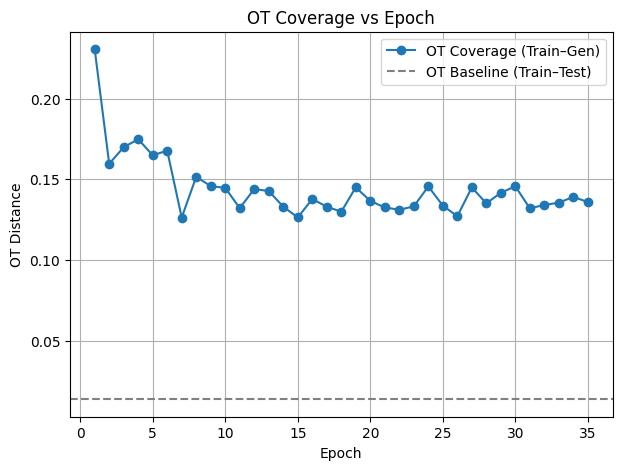

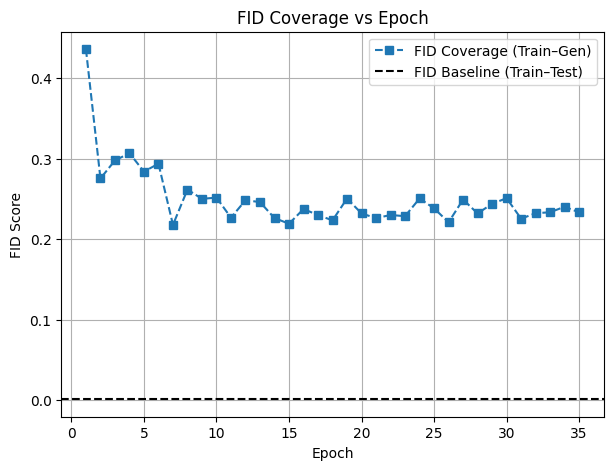

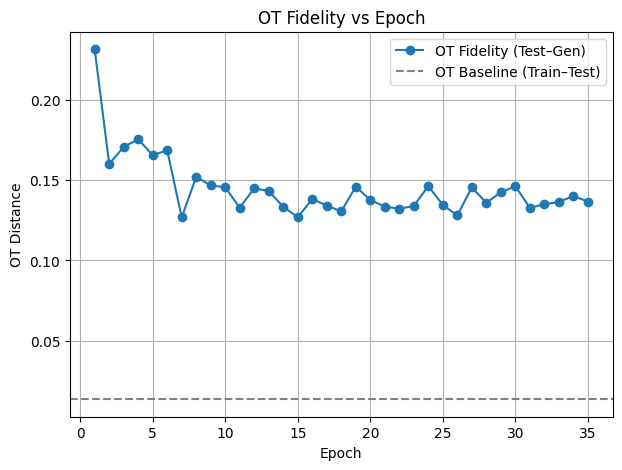

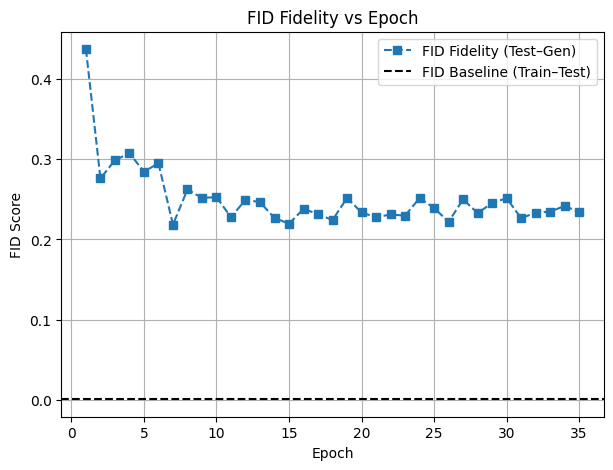

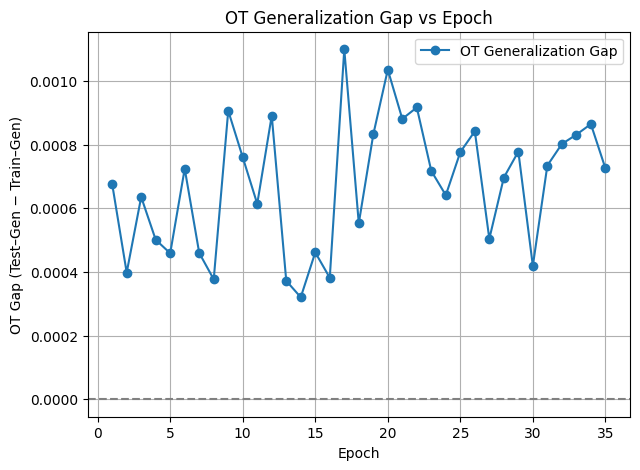

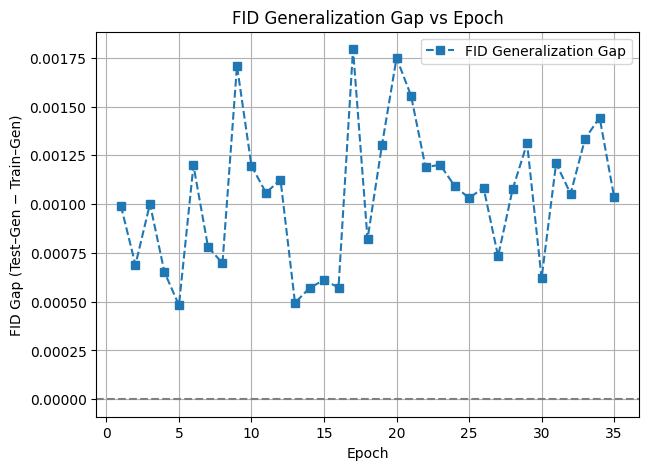

In [30]:
def plot_coverage_trends(epoch_results):
    """Formerly plot_recall: Train–Gen = coverage."""
    epochs = [r['epoch'] for r in epoch_results]
    ot_cov = [r['ot_train_gen'] for r in epoch_results]
    fid_cov = [r['fid_train_gen'] for r in epoch_results]

    # --- OT Coverage ---
    plt.figure(figsize=(7,5))
    plt.plot(epochs, ot_cov, '-o', label="OT Coverage (Train–Gen)")
    plt.axhline(epoch_results[0]['ot_train_test'], color="gray", linestyle="--",
                label="OT Baseline (Train–Test)")
    plt.xlabel("Epoch"); plt.ylabel("OT Distance");
    plt.title("OT Coverage vs Epoch")
    plt.legend(); plt.grid(True); plt.show()

    # --- FID Coverage ---
    plt.figure(figsize=(7,5))
    plt.plot(epochs, fid_cov, '--s', label="FID Coverage (Train–Gen)")
    plt.axhline(epoch_results[0]['fid_train_test'], color="black", linestyle="--",
                label="FID Baseline (Train–Test)")
    plt.xlabel("Epoch"); plt.ylabel("FID Score");
    plt.title("FID Coverage vs Epoch")
    plt.legend(); plt.grid(True); plt.show()


def plot_fidelity_trends(epoch_results):
    """Formerly plot_precision: Test–Gen = fidelity/precision."""
    epochs = [r['epoch'] for r in epoch_results]
    ot_fid = [r['ot_test_gen'] for r in epoch_results]
    fid_fid = [r['fid_test_gen'] for r in epoch_results]

    # --- OT Fidelity ---
    plt.figure(figsize=(7,5))
    plt.plot(epochs, ot_fid, '-o', label="OT Fidelity (Test–Gen)")
    plt.axhline(epoch_results[0]['ot_train_test'], color="gray", linestyle="--",
                label="OT Baseline (Train–Test)")
    plt.xlabel("Epoch"); plt.ylabel("OT Distance");
    plt.title("OT Fidelity vs Epoch")
    plt.legend(); plt.grid(True); plt.show()

    # --- FID Fidelity ---
    plt.figure(figsize=(7,5))
    plt.plot(epochs, fid_fid, '--s', label="FID Fidelity (Test–Gen)")
    plt.axhline(epoch_results[0]['fid_train_test'], color="black", linestyle="--",
                label="FID Baseline (Train–Test)")
    plt.xlabel("Epoch"); plt.ylabel("FID Score");
    plt.title("FID Fidelity vs Epoch")
    plt.legend(); plt.grid(True); plt.show()


def plot_generalization_gap(epoch_results):
    """Formerly plot_overfitting: (Test–Gen) − (Train–Gen)."""
    epochs = [r['epoch'] for r in epoch_results]
    ot_gap = [r['ot_test_gen'] - r['ot_train_gen'] for r in epoch_results]
    fid_gap = [r['fid_test_gen'] - r['fid_train_gen'] for r in epoch_results]

    # --- OT Gap ---
    plt.figure(figsize=(7,5))
    plt.plot(epochs, ot_gap, '-o', label="OT Generalization Gap")
    plt.axhline(0, color="gray", linestyle="--")
    plt.xlabel("Epoch"); plt.ylabel("OT Gap (Test–Gen − Train–Gen)");
    plt.title("OT Generalization Gap vs Epoch")
    plt.legend(); plt.grid(True); plt.show()

    # --- FID Gap ---
    plt.figure(figsize=(7,5))
    plt.plot(epochs, fid_gap, '--s', label="FID Generalization Gap")
    plt.axhline(0, color="gray", linestyle="--")
    plt.xlabel("Epoch"); plt.ylabel("FID Gap (Test–Gen − Train–Gen)");
    plt.title("FID Generalization Gap vs Epoch")
    plt.legend(); plt.grid(True); plt.show()


# Updated calls
plot_coverage_trends(epoch_results)
plot_fidelity_trends(epoch_results)
plot_generalization_gap(epoch_results)


Active Phase

In [86]:
# ============================================================================
# COMPLETE ACTIVE PHASE: Full Implementation with Simple Visualizations
# Run everything with a single function call at the bottom
# ============================================================================

!pip install geomloss seaborn pandas
import torch
import torch.nn as nn
import torch.nn.functional as F
import numpy as np
import random
import os
import shutil
from torch.utils.data import DataLoader, TensorDataset
from torchvision import transforms
from tqdm import tqdm
import wandb
from geomloss import SamplesLoss
import matplotlib.pyplot as plt
import seaborn as sns
from torchvision.utils import make_grid, save_image
import pandas as pd
import gc
from scipy import stats

# Set plotting style
plt.style.use('seaborn-v0_8-whitegrid')
sns.set_palette("husl")

# ============================================================================
# Configuration
# ============================================================================

# Training parameters
BASELINE_EPOCHS = 35
ACTIVE_EPOCHS = 35
BATCH_SIZE = 128
LEARNING_RATE = 2e-4
SAVE_INTERVAL = 1

# OT parameters
TRANSPORT_WEIGHT = 0.001
SINKHORN_BLUR = 0.2
REFERENCE_POOL_SIZE = 2000

# Generation-time guidance
GUIDANCE_SCALE = 0.5
NUM_GUIDANCE_STEPS = 10
OT_CORRECTION_STEPS = 3

# Directories
BASELINE_CHECKPOINT_DIR = "/content/drive/MyDrive/_ddpm_mnist_checkpoints_baseline"
ACTIVE_CHECKPOINT_DIR = "/content/drive/MyDrive/_ddpm_mnist_checkpoints_active"
PLOTS_DIR = "/content/drive/MyDrive/_ddpm_plots"

for dir_path in [BASELINE_CHECKPOINT_DIR, ACTIVE_CHECKPOINT_DIR, PLOTS_DIR]:
    os.makedirs(dir_path, exist_ok=True)

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Device: {device}")

# Global storage for metrics
TRAINING_METRICS = {
    'baseline': {'epochs': [], 'train_loss': [], 'val_loss': []},
    'ot_enhanced': {'epochs': [], 'train_loss': [], 'mse_loss': [], 'ot_loss': [], 'val_loss': []}
}
EVALUATION_RESULTS = {}

Device: cuda


In [87]:
# ============================================================================
# Feature Extractor Setup
# ============================================================================

def setup_feature_extractor(device, checkpoint_path="feature_model.pth"):
    """Setup frozen feature extractor"""
    # Instantiate the feature network and move it to the specified device (CPU/GPU)
    feature_model = SimpleMNISTFeatureNet().to(device)

    # Load pretrained weights; map_location lets you load CPU/GPU checkpoints flexibly
    feature_model.load_state_dict(torch.load(checkpoint_path, map_location=device))

    # Freeze all weights so no gradients are computed/updated during backprop
    for param in feature_model.parameters():
        param.requires_grad_(False)

    # Switch to eval mode (disables dropout, uses running stats for BatchNorm, etc.)
    feature_model.eval()

    # Return a ready-to-use, frozen feature extractor
    return feature_model

def convert_to_feature_input(image_batch):
    """Convert diffusion output to feature network input"""

    # Diffusion outputs are typically in [-1, 1].
    # Clamp for safety, then rescale to [0, 1] because the feature net was trained on [0, 1].
    # Shape is preserved: (B, C, H, W) -> (B, C, H, W)
    return  (image_batch.clamp(-1, 1) + 1.0) / 2.0

def extract_features_with_gradients(feature_extractor, images, enable_gradients=False):
    """Extract features with gradient control"""
    # Normalize images to the expected [0, 1] range for the feature network
    normalized_images = convert_to_feature_input(images)

    if enable_gradients:
        # Forward pass with gradients enabled.
        # Assumes the feature_extractor returns (logits, features); we take 'features'.
        _, features = feature_extractor(normalized_images)
    else:
        # No-grad context saves memory and compute when you don't need backprop through images.
        with torch.no_grad():
            _, features = feature_extractor(normalized_images)

    # Features have shape (B, D): one embedding vector per image in the batch.
    return features


In [88]:
# ============================================================================
# Disjoint Reference Sampling
# ============================================================================

def get_disjoint_reference_indices(total_size, current_indices, reference_size):
    """Sample disjoint reference indices"""
    # Build the set of ALL possible indices in the dataset: {0, 1, ..., total_size-1}
    all_indices = set(range(total_size))
    # Convert the currently-used batch indices to a set for fast subtraction
    forbidden = set(current_indices)
    # Compute indices that are NOT in the current batch (the "disjoint" pool)
    available = list(all_indices - forbidden)

    # If the available pool is smaller than we want, sample WITH replacement
    # (keeps the reference_size fixed but may repeat some indices)
    if len(available) < reference_size:
        return random.choices(available, k=reference_size)
    else:
        # Otherwise, sample WITHOUT replacement to avoid duplicates
        return random.sample(available, reference_size)

def load_batch_from_indices(dataset, indices, device):
    """Load batch from absolute indices"""
    batch_data = []
    # Gather images by absolute index directly from the dataset
    for idx in indices:
        image, _ = dataset[idx]   # assume dataset returns (image, label)
        batch_data.append(image)
    # Stack list of tensors into a single batch tensor and move it to the device
    return torch.stack(batch_data).to(device, non_blocking=True)


In [89]:
# ============================================================================
# Loss Functions
# ============================================================================

def compute_baseline_loss(model, diffusion, images, device):
    """Standard diffusion loss"""
    # Batch size
    b = images.size(0)

    # Sample a (possibly different) timestep t for each image in the batch, uniform in [0, T-1]
    t = torch.randint(0, diffusion.num_timesteps, (b,), device=device).long()

    # Draw Gaussian noise with the same shape as images
    noise = torch.randn_like(images)

    # Forward diffuse clean images x0 to xt using the known noising process q(xt|x0, t)
    noisy_images = diffusion.q_sample(x_start=images, t=t, noise=noise)

    # The model tries to predict the noise that was added at timestep t
    predicted_noise = model(noisy_images, t)

    # Standard DDPM objective: MSE between predicted noise and true noise
    mse_loss = F.mse_loss(predicted_noise, noise)

    # Return:
    #  - total loss (here just mse_loss)
    #  - a detached copy of mse_loss for logging (no gradients)
    #  - a zero OT term (kept for consistent return signature)
    return mse_loss, mse_loss.detach(), torch.tensor(0.0, device=device)

def compute_ot_enhanced_loss(model, diffusion, images, device, feature_extractor,
                           reference_batch=None, transport_weight=TRANSPORT_WEIGHT,
                           blur=SINKHORN_BLUR):
    """OT-enhanced loss"""
    # Batch size
    b = images.size(0)

    # Sample per-example timestep
    t = torch.randint(0, diffusion.num_timesteps, (b,), device=device).long()

    # Gaussian noise and forward diffusion to build xt
    noise = torch.randn_like(images)
    noisy_images = diffusion.q_sample(x_start=images, t=t, noise=noise)

    # Predict the noise at timestep t and compute the usual MSE loss
    predicted_noise = model(noisy_images, t)
    mse_loss = F.mse_loss(predicted_noise, noise)

    # If we don't have a feature extractor or a reference batch, fall back to baseline loss
    if feature_extractor is None or reference_batch is None:
        return mse_loss, mse_loss.detach(), torch.tensor(0.0, device=device)

    # Reconstruct the model's estimate of the clean image x0 from (xt, t, predicted_noise)
    predicted_x0 = diffusion.predict_start_from_noise(noisy_images, t, predicted_noise)

    # Light squashing to keep values bounded; also promotes numerical stability for features
    pred_smooth = torch.tanh(predicted_x0)
    ref_smooth = torch.tanh(reference_batch)

    # Extract features for the predicted images WITH gradients
    # (so that the OT term can backpropagate into the generator)
    pred_features = extract_features_with_gradients(
        feature_extractor, pred_smooth, enable_gradients=True
    )

    # Extract features for the reference real images WITHOUT gradients
    # (we don't want/need to update the feature net or real data)
    with torch.no_grad():
        ref_features = extract_features_with_gradients(
            feature_extractor, ref_smooth, enable_gradients=False
        )

    # Define Sinkhorn OT loss in feature space:
    #   - loss="sinkhorn": entropic regularization (fast/stable)
    #   - p=2: 2-Wasserstein geometry (squared Euclidean ground cost)
    #   - blur: regularization/smoothing strength
    ot_loss_fn = SamplesLoss(loss="sinkhorn", p=2, blur=blur, backend="auto")

    # Compute OT distance between distributions of predicted vs reference features
    ot_distance = ot_loss_fn(pred_features.float(), ref_features.float())

    # Combine objectives: standard noise MSE + λ * OT(feature_pred, feature_ref)
    total_loss = mse_loss + transport_weight * ot_distance

    # Return:
    #  - total loss (drives training)
    #  - detached MSE (for logging)
    #  - detached, weighted OT term (for logging)
    return total_loss, mse_loss.detach(), (transport_weight * ot_distance).detach()


In [90]:
# ============================================================================
# Generation-Time OT Guidance
# ============================================================================

def ot_guided_ddim_sampling(diffusion, shape, feature_extractor, reference_features,
                           num_ddim_steps=50, num_guide_steps=NUM_GUIDANCE_STEPS,
                           guidance_scale=GUIDANCE_SCALE, blur=SINKHORN_BLUR):
    """DDIM sampling with OT guidance"""
    model = diffusion.model
    batch, C, H, W = shape
    device = next(model.parameters()).device  # use same device as the model

    # Start from standard Gaussian noise
    x = torch.randn(shape, device=device)

    # Create a decreasing sequence of time indices for DDIM (T-1 -> 0) with exactly num_ddim_steps steps
    timesteps = torch.linspace(diffusion.num_timesteps - 1, 0, num_ddim_steps, dtype=torch.long)

    # We don't backpropagate through the model during sampling; only the inner OT corrections need grads
    with torch.no_grad():
        for i, t in enumerate(tqdm(timesteps, desc="OT-guided sampling", leave=False)):
            # Vector of current time index for the whole batch
            t_batch = torch.full((batch,), int(t), device=device, dtype=torch.long)

            # Standard deterministic DDIM update for all but the final step
            if i < len(timesteps) - 1:
                t_next = timesteps[i + 1]
                x = ddim_step(diffusion, x, t_batch, t_next)
            else:
                # Final step: predict the clean image x0 explicitly and clamp to valid range
                predicted_noise = model(x, t_batch)
                x = diffusion.predict_start_from_noise(x, t_batch, predicted_noise)
                x = x.clamp(-1, 1)

            # OT guidance during the first `num_guide_steps` steps
            if i < num_guide_steps and guidance_scale > 0:
                x = apply_ot_guidance(
                    x, feature_extractor, reference_features,
                    guidance_scale, blur, OT_CORRECTION_STEPS
                )

    # Return final images in [-1, 1]
    return x.clamp(-1, 1)

def ddim_step(diffusion, x_t, t, t_next):
    """Single DDIM step"""
    model = diffusion.model
    # Predict the noise at time t
    predicted_noise = model(x_t, t)

    # Retrieve alpha (cumulative product of (1 - beta)) values for current and next times
    alpha_t = diffusion.alphas_cumprod[t]
    # For the last transition, treat alpha_next as 1 (i.e., fully denoised)
    alpha_next = diffusion.alphas_cumprod[t_next] if t_next >= 0 else torch.tensor(1.0)

    # Match shapes to (B,1,1,1) for broadcasting over image tensors
    alpha_t = alpha_t.view(-1, 1, 1, 1)
    alpha_next = alpha_next.view(-1, 1, 1, 1)

    # Estimate x0 from x_t and predicted noise (DDPM inversion formula)
    x0_pred = (x_t - torch.sqrt(1 - alpha_t) * predicted_noise) / torch.sqrt(alpha_t)
    x0_pred = x0_pred.clamp(-1, 1)  # keep images in a stable numeric range

    # Deterministic DDIM update toward t_next (no additional stochastic noise)
    x_next = torch.sqrt(alpha_next) * x0_pred + torch.sqrt(1 - alpha_next) * predicted_noise
    return x_next

def apply_ot_guidance(x0, feature_extractor, reference_features, guidance_scale, blur, steps):
    """Apply OT guidance to x0"""
    # Create a leaf tensor we can optimize directly
    x0_corrected = x0.clone().detach().requires_grad_(True)

    # Optimize the image tensor itself using Adam (small learning rate)
    optimizer = torch.optim.Adam([x0_corrected], lr=0.01)

    # Sinkhorn OT distance in feature space (p=2 Wasserstein, entropic smoothing via 'blur')
    ot_loss_fn = SamplesLoss(loss="sinkhorn", p=2, blur=blur, backend="auto")

    for _ in range(steps):
        optimizer.zero_grad()

        # Extract features with gradients so OT loss can update x0_corrected
        current_features = extract_features_with_gradients(
            feature_extractor, x0_corrected, enable_gradients=True
        )

        # Compute OT distance to the target (precomputed) reference feature distribution
        ot_loss = ot_loss_fn(current_features, reference_features)

        # Scale the guidance effect and backprop through x0_corrected (not the model)
        (guidance_scale * ot_loss).backward()
        optimizer.step()

        # Keep images in [-1,1] after each small correction step
        x0_corrected.data.clamp_(-1, 1)

    # Return the corrected images, detached from graph
    return x0_corrected.detach()


In [91]:
# ============================================================================
# Training Functions with Metrics Tracking
# ============================================================================

def train_baseline_model():
    """Train baseline model with comprehensive metrics tracking"""
    print("="*60)
    print("TRAINING BASELINE MODEL")
    print("="*60)

    model, diffusion = build_model_and_diffusion(device=device)
    optimizer = torch.optim.Adam(model.parameters(), lr=LEARNING_RATE)

    for epoch in range(1, BASELINE_EPOCHS + 1):
        checkpoint_path = os.path.join(BASELINE_CHECKPOINT_DIR, f"baseline_epoch{epoch:03d}.pt")

        if os.path.exists(checkpoint_path):
            print(f"Loading existing checkpoint: epoch {epoch}")
            checkpoint = torch.load(checkpoint_path, map_location=device)
            model.load_state_dict(checkpoint['model'])

            # Load metrics if available
            if 'metrics' in checkpoint:
                TRAINING_METRICS['baseline']['epochs'].append(epoch)
                TRAINING_METRICS['baseline']['train_loss'].append(checkpoint['metrics']['train_loss'])
                TRAINING_METRICS['baseline']['val_loss'].append(checkpoint['metrics']['val_loss'])
            continue

        # Training
        model.train()
        total_loss = 0.0

        pbar = tqdm(train_loader, desc=f"Baseline Epoch {epoch}")
        for batch_images, _ in pbar:
            batch_images = batch_images.to(device)

            optimizer.zero_grad()
            loss, _, _ = compute_baseline_loss(model, diffusion, batch_images, device)
            loss.backward()
            optimizer.step()

            total_loss += loss.item()
            pbar.set_postfix(loss=loss.item())

        train_loss = total_loss / len(train_loader)

        # Validation
        model.eval()
        val_loss = 0.0
        with torch.no_grad():
            for val_images, _ in val_loader:
                val_images = val_images.to(device)
                loss, _, _ = compute_baseline_loss(model, diffusion, val_images, device)
                val_loss += loss.item()
        val_loss /= len(val_loader)

        # Store metrics
        TRAINING_METRICS['baseline']['epochs'].append(epoch)
        TRAINING_METRICS['baseline']['train_loss'].append(train_loss)
        TRAINING_METRICS['baseline']['val_loss'].append(val_loss)

        print(f"Baseline Epoch {epoch}: Train Loss = {train_loss:.6f}, Val Loss = {val_loss:.6f}")

        # Save checkpoint with metrics
        if epoch % SAVE_INTERVAL == 0:
            torch.save({
                "epoch": epoch,
                "model": model.state_dict(),
                "optimizer": optimizer.state_dict(),
                "metrics": {"train_loss": train_loss, "val_loss": val_loss},
                "model_type": "baseline"
            }, checkpoint_path)


!rm -rf wandb/*
import torch, gc
torch.cuda.empty_cache()
gc.collect()


5977

In [92]:
def train_ot_enhanced_model():
    """Train OT-enhanced model with comprehensive tracking"""
    print("="*60)
    print("TRAINING OT-ENHANCED MODEL")
    print("="*60)

    feature_extractor = setup_feature_extractor(device)
    model, diffusion = build_model_and_diffusion(device=device)
    optimizer = torch.optim.Adam(model.parameters(), lr=LEARNING_RATE)

    # Load baseline model
    baseline_files = [f for f in os.listdir(BASELINE_CHECKPOINT_DIR) if f.endswith('.pt')]
    if baseline_files:
        latest_baseline = sorted(baseline_files)[-1]
        baseline_path = os.path.join(BASELINE_CHECKPOINT_DIR, latest_baseline)
        checkpoint = torch.load(baseline_path, map_location=device)
        model.load_state_dict(checkpoint['model'])
        print(f"Loaded baseline: {latest_baseline}")

    all_train_indices = list(range(len(full_train_dataset)))

    for epoch in range(1, ACTIVE_EPOCHS + 1):
        checkpoint_path = os.path.join(ACTIVE_CHECKPOINT_DIR, f"ot_enhanced_epoch{epoch:03d}.pt")

        if os.path.exists(checkpoint_path):
            print(f"Loading existing OT checkpoint: epoch {epoch}")
            checkpoint = torch.load(checkpoint_path, map_location=device)
            model.load_state_dict(checkpoint['model'])

            if 'metrics' in checkpoint:
                TRAINING_METRICS['ot_enhanced']['epochs'].append(epoch)
                TRAINING_METRICS['ot_enhanced']['train_loss'].append(checkpoint['metrics']['train_loss'])
                TRAINING_METRICS['ot_enhanced']['mse_loss'].append(checkpoint['metrics']['mse_loss'])
                TRAINING_METRICS['ot_enhanced']['ot_loss'].append(checkpoint['metrics']['ot_loss'])
                TRAINING_METRICS['ot_enhanced']['val_loss'].append(checkpoint['metrics']['val_loss'])
            continue

        # Shuffle for this epoch
        epoch_indices = all_train_indices.copy()
        random.shuffle(epoch_indices)

        num_batches = len(epoch_indices) // BATCH_SIZE
        batch_indices_list = [
            epoch_indices[i*BATCH_SIZE:(i+1)*BATCH_SIZE]
            for i in range(num_batches)
        ]

        model.train()
        epoch_total_loss = 0.0
        epoch_mse_loss = 0.0
        epoch_ot_loss = 0.0

        pbar = tqdm(batch_indices_list, desc=f"OT Epoch {epoch}")
        for batch_indices in pbar:
            current_batch = load_batch_from_indices(full_train_dataset, batch_indices, device)

            ref_indices = get_disjoint_reference_indices(
                len(full_train_dataset), batch_indices, REFERENCE_POOL_SIZE
            )
            reference_batch = load_batch_from_indices(full_train_dataset, ref_indices, device)

            optimizer.zero_grad()
            total_loss, mse_loss, ot_loss = compute_ot_enhanced_loss(
                model, diffusion, current_batch, device, feature_extractor,
                reference_batch, TRANSPORT_WEIGHT, SINKHORN_BLUR
            )

            total_loss.backward()
            optimizer.step()

            epoch_total_loss += total_loss.item()
            epoch_mse_loss += mse_loss.item()
            epoch_ot_loss += ot_loss.item()

            pbar.set_postfix({
                'total': total_loss.item(),
                'mse': mse_loss.item(),
                'ot': ot_loss.item()
            })

        # Calculate averages
        train_loss = epoch_total_loss / num_batches
        mse_loss_avg = epoch_mse_loss / num_batches
        ot_loss_avg = epoch_ot_loss / num_batches

        # Validation
        model.eval()
        val_loss = 0.0
        with torch.no_grad():
            for val_images, _ in val_loader:
                val_images = val_images.to(device)
                loss, _, _ = compute_ot_enhanced_loss(
                    model, diffusion, val_images, device, feature_extractor,
                    val_images, TRANSPORT_WEIGHT, SINKHORN_BLUR
                )
                val_loss += loss.item()
        val_loss /= len(val_loader)

        # Store metrics
        TRAINING_METRICS['ot_enhanced']['epochs'].append(epoch)
        TRAINING_METRICS['ot_enhanced']['train_loss'].append(train_loss)
        TRAINING_METRICS['ot_enhanced']['mse_loss'].append(mse_loss_avg)
        TRAINING_METRICS['ot_enhanced']['ot_loss'].append(ot_loss_avg)
        TRAINING_METRICS['ot_enhanced']['val_loss'].append(val_loss)

        print(f"OT Epoch {epoch}: Total={train_loss:.6f}, MSE={mse_loss_avg:.6f}, OT={ot_loss_avg:.6f}, Val={val_loss:.6f}")

        # Save checkpoint
        if epoch % SAVE_INTERVAL == 0:
            torch.save({
                "epoch": epoch,
                "model": model.state_dict(),
                "optimizer": optimizer.state_dict(),
                "metrics": {
                    "train_loss": train_loss,
                    "mse_loss": mse_loss_avg,
                    "ot_loss": ot_loss_avg,
                    "val_loss": val_loss
                },
                "model_type": "ot_enhanced"
            }, checkpoint_path)

In [93]:
def to_01(x: torch.Tensor) -> torch.Tensor:
    """
    Ensure a tensor is in [0,1] for display.
    If it's already [0,1], clamp and return.
    If it's in [-1,1], map to [0,1].
    """
    x_min, x_max = x.min().item(), x.max().item()
    # Already [0,1] (or very close) → just clamp
    if x_min >= -1e-4 and x_max <= 1.0 + 1e-4 and x_min >= 0.0 - 1e-4:
        return x.clamp(0, 1)
    # Likely [-1,1] → map to [0,1]
    return (x.clamp(-1, 1) + 1.0) / 2.0


In [94]:
# ============================================================================
# Simple Visualization Functions (ONLY THESE TWO)
# ============================================================================

def plot_simple_three_panel_comparison():
    """Generate simple 3-panel comparison: Real | Before | After"""
    print("Generating Simple Three-Panel Comparison...")

    try:
        # Load models
        baseline_model, baseline_diffusion = build_model_and_diffusion(device=device)
        ot_model, ot_diffusion = build_model_and_diffusion(device=device)

        # Find latest checkpoints
        baseline_files = [f for f in os.listdir(BASELINE_CHECKPOINT_DIR) if f.endswith('.pt')]
        ot_files = [f for f in os.listdir(ACTIVE_CHECKPOINT_DIR) if f.endswith('.pt')]

        if not baseline_files or not ot_files:
            print("Missing checkpoints for comparison")
            return

        baseline_path = os.path.join(BASELINE_CHECKPOINT_DIR, sorted(baseline_files)[-1])
        ot_path = os.path.join(ACTIVE_CHECKPOINT_DIR, sorted(ot_files)[-1])

        # Load checkpoints
        baseline_checkpoint = torch.load(baseline_path, map_location=device)
        baseline_model.load_state_dict(baseline_checkpoint['model'])
        baseline_model.eval()

        ot_checkpoint = torch.load(ot_path, map_location=device)
        ot_model.load_state_dict(ot_checkpoint['model'])
        ot_model.eval()

        with torch.no_grad():
            # Get real test images (100 samples, arrange as 10x10 grid)
            real_samples = []
            for images, _ in test_loader:
                real_samples.append(images)
                if len(real_samples) * BATCH_SIZE >= 100:
                    break
            real_samples = torch.cat(real_samples)[:100].to(device)

            # Generate from baseline model (100 samples)
            baseline_samples = baseline_diffusion.ddim_sample((100, 1, 28, 28))

            # Generate from OT-enhanced model (100 samples)
            ot_samples = ot_diffusion.ddim_sample((100, 1, 28, 28))

        # Create 10x10 grids
        # Use robust mapping to [0,1] and make grid gaps BLACK
        real_grid     = make_grid(to_01(real_samples),     nrow=10, padding=1, pad_value=0.0)
        baseline_grid = make_grid(to_01(baseline_samples), nrow=10, padding=1, pad_value=0.0)
        ot_grid       = make_grid(to_01(ot_samples),       nrow=10, padding=1, pad_value=0.0)




        # Create the 3-panel comparison
        fig, axes = plt.subplots(1, 3, figsize=(18, 6))
        # Draw (add interpolation='nearest' for crisper digits)


        # Panel 1: Real Test Images
        axes[0].imshow(real_grid.permute(1, 2, 0).cpu(), cmap='gray', vmin=0, vmax=1)
        #axes[0].imshow(real_grid.permute(1, 2, 0).cpu(), cmap='gray', vmin=0, vmax=1, interpolation='nearest')

        axes[0].set_title('Real Test Images', fontsize=16, fontweight='bold', pad=20)
        axes[0].axis('off')

        # Panel 2: Generated by Old Model (Baseline)
        axes[1].imshow(baseline_grid.permute(1, 2, 0).cpu(), cmap='gray', vmin=0, vmax=1)
        #axes[1].imshow(baseline_grid.permute(1, 2, 0).cpu(), cmap='gray', vmin=0, vmax=1, interpolation='nearest')
        axes[1].set_title('Generated before enhancing', fontsize=16, fontweight='bold', pad=20)
        axes[1].axis('off')

        # Panel 3: Generated by New Model (OT-Enhanced)
        axes[2].imshow(ot_grid.permute(1, 2, 0).cpu(), cmap='gray', vmin=0, vmax=1)
        #axes[2].imshow(ot_grid.permute(1, 2, 0).cpu(), cmap='gray', vmin=0, vmax=1, interpolation='nearest')
        axes[2].set_title('Generated after enhancing', fontsize=16, fontweight='bold', pad=20)
        axes[2].axis('off')

        # Adjust layout and save
        plt.tight_layout()
        plt.subplots_adjust(top=0.85)  # Make room for titles

        # Save the comparison
        comparison_path = os.path.join(PLOTS_DIR, 'three_panel_comparison.png')
        plt.savefig(comparison_path, dpi=200, bbox_inches='tight',
                   facecolor='white', edgecolor='none')
        plt.show()

        # Also save individual grids separately
        save_image(real_grid, os.path.join(PLOTS_DIR, 'real_test_images.png'),
                  normalize=False, pad_value=1.0)
        save_image(baseline_grid, os.path.join(PLOTS_DIR, 'generated_old_model.png'),
                  normalize=False, pad_value=1.0)
        save_image(ot_grid, os.path.join(PLOTS_DIR, 'generated_new_model.png'),
                  normalize=False, pad_value=1.0)

        print(f"Three-panel comparison saved to: {comparison_path}")
        print("Individual panels saved as:")
        print("- real_test_images.png")
        print("- generated_old_model.png")
        print("- generated_new_model.png")

        # Clean up
        del baseline_model, ot_model, baseline_diffusion, ot_diffusion
        torch.cuda.empty_cache()
        gc.collect()

    except Exception as e:
        print(f"Error generating comparison: {e}")
        import traceback
        traceback.print_exc()

def plot_distance_comparison():
    """Plot before/after distance comparison"""
    print("Generating Distance Comparison...")

    try:
        # Load models
        baseline_model, baseline_diffusion = build_model_and_diffusion(device=device)
        ot_model, ot_diffusion = build_model_and_diffusion(device=device)
        feature_extractor = setup_feature_extractor(device)

        # Find checkpoints
        baseline_files = [f for f in os.listdir(BASELINE_CHECKPOINT_DIR) if f.endswith('.pt')]
        ot_files = [f for f in os.listdir(ACTIVE_CHECKPOINT_DIR) if f.endswith('.pt')]

        if not baseline_files or not ot_files:
            print("Missing checkpoints for distance comparison")
            return

        baseline_path = os.path.join(BASELINE_CHECKPOINT_DIR, sorted(baseline_files)[-1])
        ot_path = os.path.join(ACTIVE_CHECKPOINT_DIR, sorted(ot_files)[-1])

        # Load models
        baseline_checkpoint = torch.load(baseline_path, map_location=device)
        baseline_model.load_state_dict(baseline_checkpoint['model'])
        baseline_model.eval()

        ot_checkpoint = torch.load(ot_path, map_location=device)
        ot_model.load_state_dict(ot_checkpoint['model'])
        ot_model.eval()

        with torch.no_grad():
            # Real samples for comparison
            real_samples = next(iter(val_loader))[0][:128].to(device)

            # Generate samples
            baseline_samples = baseline_diffusion.ddim_sample((128, 1, 28, 28))
            ot_samples = ot_diffusion.ddim_sample((128, 1, 28, 28))

            # Extract features
            real_features = extract_features_with_gradients(feature_extractor, real_samples, False)
            baseline_features = extract_features_with_gradients(feature_extractor, baseline_samples, False)
            ot_features = extract_features_with_gradients(feature_extractor, ot_samples, False)

            # Calculate OT distances
            ot_loss_fn = SamplesLoss(loss="sinkhorn", p=2, blur=0.3, backend="auto")

            baseline_distance = ot_loss_fn(real_features, baseline_features).item()
            ot_distance = ot_loss_fn(real_features, ot_features).item()

        # Create distance comparison plot
        fig, axes = plt.subplots(1, 2, figsize=(12, 5))

        # Bar chart comparison
        models = ['Before OT\n(Baseline)', 'After OT\n(Enhanced)']
        distances = [baseline_distance, ot_distance]
        colors = ['red', 'green']

        bars = axes[0].bar(models, distances, color=colors, alpha=0.7, width=0.6)
        axes[0].set_title('OT Distance to Real Data', fontweight='bold', fontsize=14)
        axes[0].set_ylabel('OT Distance', fontsize=12)
        axes[0].grid(True, alpha=0.3)

        # Add value labels on bars
        for bar, dist in zip(bars, distances):
            height = bar.get_height()
            axes[0].text(bar.get_x() + bar.get_width()/2., height + height*0.01,
                        f'{dist:.4f}', ha='center', va='bottom', fontweight='bold', fontsize=11)

        # Improvement visualization
        improvement = baseline_distance - ot_distance
        improvement_pct = (improvement / baseline_distance) * 100

        axes[1].bar(['Distance\nImprovement'], [improvement], color='blue', alpha=0.7, width=0.4)
        axes[1].set_title('OT Distance Improvement', fontweight='bold', fontsize=14)
        axes[1].set_ylabel('Distance Reduction', fontsize=12)
        axes[1].grid(True, alpha=0.3)

        # Add improvement text
        axes[1].text(0, improvement/2, f'{improvement:.4f}\n({improvement_pct:.1f}%)',
                    ha='center', va='center', fontweight='bold', color='white', fontsize=12)

        plt.tight_layout()

        # Save the plot
        distance_path = os.path.join(PLOTS_DIR, 'distance_comparison.png')
        plt.savefig(distance_path, dpi=200, bbox_inches='tight', facecolor='white')
        plt.show()

        print(f"Distance comparison saved to: {distance_path}")
        print(f"\nResults Summary:")
        print(f"Baseline OT Distance: {baseline_distance:.6f}")
        print(f"Enhanced OT Distance: {ot_distance:.6f}")
        print(f"Improvement: {improvement:.6f} ({improvement_pct:.1f}%)")

        # Clean up
        del baseline_model, ot_model, baseline_diffusion, ot_diffusion, feature_extractor
        torch.cuda.empty_cache()
        gc.collect()

        return {
            'baseline_distance': baseline_distance,
            'ot_distance': ot_distance,
            'improvement': improvement,
            'improvement_pct': improvement_pct
        }

    except Exception as e:
        print(f"Error generating distance comparison: {e}")
        import traceback
        traceback.print_exc()
        return None

In [95]:
def run_model_evaluation():
    """Run comprehensive model evaluation using your passive phase framework"""
    global EVALUATION_RESULTS

    print("="*60)
    print("RUNNING COMPREHENSIVE MODEL EVALUATION")
    print("="*60)

    # Find latest checkpoints
    baseline_files = [f for f in os.listdir(BASELINE_CHECKPOINT_DIR) if f.endswith('.pt')]
    ot_files = [f for f in os.listdir(ACTIVE_CHECKPOINT_DIR) if f.endswith('.pt')]

    if not baseline_files or not ot_files:
        print("Missing checkpoints for evaluation!")
        return

    baseline_path = os.path.join(BASELINE_CHECKPOINT_DIR, sorted(baseline_files)[-1])
    ot_path = os.path.join(ACTIVE_CHECKPOINT_DIR, sorted(ot_files)[-1])

    print(f"Evaluating baseline: {baseline_path}")
    print(f"Evaluating OT-enhanced: {ot_path}")

    # Run evaluations using your passive phase evaluation framework
    print("\nEvaluating Baseline Model...")
    baseline_results = run_complete_diffusion_evaluation(
        baseline_path, train_ot_subset, test_ot_subset,
        trained_feature_network, device, total_samples=2000
    )

    print("\nEvaluating OT-Enhanced Model...")
    ot_results = run_complete_diffusion_evaluation(
        ot_path, train_ot_subset, test_ot_subset,
        trained_feature_network, device, total_samples=2000
    )

    # Store results
    EVALUATION_RESULTS['baseline'] = baseline_results
    EVALUATION_RESULTS['ot_enhanced'] = ot_results

    if baseline_results and ot_results:
        print("\n" + "="*60)
        print("EVALUATION COMPLETE - SUMMARY")
        print("="*60)

        # Print key improvements
        ot_train_improvement = baseline_results['ot_distances']['train_gen'] - ot_results['ot_distances']['train_gen']
        ot_test_improvement = baseline_results['ot_distances']['test_gen'] - ot_results['ot_distances']['test_gen']
        fid_train_improvement = baseline_results['fid_scores']['train_gen'] - ot_results['fid_scores']['train_gen']
        fid_test_improvement = baseline_results['fid_scores']['test_gen'] - ot_results['fid_scores']['test_gen']

        print(f"OT Distance Improvements:")
        print(f"  Train-Gen: {ot_train_improvement:+.6f}")
        print(f"  Test-Gen:  {ot_test_improvement:+.6f}")
        print(f"FID Score Improvements:")
        print(f"  Train-Gen: {fid_train_improvement:+.6f}")
        print(f"  Test-Gen:  {fid_test_improvement:+.6f}")

        return baseline_results, ot_results

    return None, None


In [96]:
def plot_before_after_ot_fid(baseline_results, ot_results, save_dir=PLOTS_DIR):
    b_ot_train = baseline_results['ot_distances']['train_gen']
    b_ot_test  = baseline_results['ot_distances']['test_gen']
    b_fid_train = baseline_results['fid_scores']['train_gen']
    b_fid_test  = baseline_results['fid_scores']['test_gen']

    o_ot_train = ot_results['ot_distances']['train_gen']
    o_ot_test  = ot_results['ot_distances']['test_gen']
    o_fid_train = ot_results['fid_scores']['train_gen']
    o_fid_test  = ot_results['fid_scores']['test_gen']

    labels = ['Train-Gen', 'Test-Gen']
    x = np.arange(len(labels))
    width = 0.35

    fig, axes = plt.subplots(1, 2, figsize=(12, 5))

    ot_before = [b_ot_train, b_ot_test]
    ot_after  = [o_ot_train, o_ot_test]
    bars1 = axes[0].bar(x - width/2, ot_before, width, label='Before')
    bars2 = axes[0].bar(x + width/2, ot_after,  width, label='After')
    axes[0].set_title('OT distance')
    axes[0].set_xticks(x, labels)
    axes[0].set_ylabel('OT')
    axes[0].legend()
    axes[0].grid(True, alpha=0.3)
    for b in bars1 + bars2:
        h = b.get_height()
        axes[0].text(b.get_x() + b.get_width()/2, h, f'{h:.4f}', ha='center', va='bottom', fontsize=9)

    fid_before = [b_fid_train, b_fid_test]
    fid_after  = [o_fid_train, o_fid_test]
    bars3 = axes[1].bar(x - width/2, fid_before, width, label='Before')
    bars4 = axes[1].bar(x + width/2, fid_after,  width, label='After')
    axes[1].set_title('FID')
    axes[1].set_xticks(x, labels)
    axes[1].set_ylabel('FID')
    axes[1].legend()
    axes[1].grid(True, alpha=0.3)
    for b in bars3 + bars4:
        h = b.get_height()
        axes[1].text(b.get_x() + b.get_width()/2, h, f'{h:.4f}', ha='center', va='bottom', fontsize=9)

    plt.tight_layout()
    out = os.path.join(save_dir, "before_after_ot_fid.png")
    plt.savefig(out, dpi=200, bbox_inches='tight', facecolor='white')
    plt.show()
    print(f"Saved: {out}")

Starting Complete Active Phase with Simple Visualizations

 Step 1: Training Baseline Model
TRAINING BASELINE MODEL


Baseline Epoch 1: 100%|██████████| 429/429 [02:57<00:00,  2.42it/s, loss=0.0572]


Baseline Epoch 1: Train Loss = 0.136798, Val Loss = 0.064114


Baseline Epoch 2: 100%|██████████| 429/429 [02:56<00:00,  2.44it/s, loss=0.0547]


Baseline Epoch 2: Train Loss = 0.057200, Val Loss = 0.050220


Baseline Epoch 3: 100%|██████████| 429/429 [02:56<00:00,  2.43it/s, loss=0.0373]


Baseline Epoch 3: Train Loss = 0.047505, Val Loss = 0.044203


Baseline Epoch 4: 100%|██████████| 429/429 [02:55<00:00,  2.44it/s, loss=0.0398]


Baseline Epoch 4: Train Loss = 0.044250, Val Loss = 0.042807


Baseline Epoch 5: 100%|██████████| 429/429 [02:56<00:00,  2.43it/s, loss=0.0449]


Baseline Epoch 5: Train Loss = 0.042514, Val Loss = 0.039913


Baseline Epoch 6: 100%|██████████| 429/429 [02:55<00:00,  2.44it/s, loss=0.0414]


Baseline Epoch 6: Train Loss = 0.041061, Val Loss = 0.039764


Baseline Epoch 7: 100%|██████████| 429/429 [02:56<00:00,  2.43it/s, loss=0.0429]


Baseline Epoch 7: Train Loss = 0.040329, Val Loss = 0.039532


Baseline Epoch 8: 100%|██████████| 429/429 [02:56<00:00,  2.44it/s, loss=0.0399]


Baseline Epoch 8: Train Loss = 0.039623, Val Loss = 0.039370


Baseline Epoch 9: 100%|██████████| 429/429 [02:55<00:00,  2.44it/s, loss=0.0434]


Baseline Epoch 9: Train Loss = 0.038907, Val Loss = 0.038118


Baseline Epoch 10: 100%|██████████| 429/429 [02:56<00:00,  2.44it/s, loss=0.0385]


Baseline Epoch 10: Train Loss = 0.038799, Val Loss = 0.038464


Baseline Epoch 11: 100%|██████████| 429/429 [02:55<00:00,  2.44it/s, loss=0.0411]


Baseline Epoch 11: Train Loss = 0.038506, Val Loss = 0.038162


Baseline Epoch 12: 100%|██████████| 429/429 [02:56<00:00,  2.44it/s, loss=0.0428]


Baseline Epoch 12: Train Loss = 0.038034, Val Loss = 0.038254


Baseline Epoch 13: 100%|██████████| 429/429 [02:55<00:00,  2.44it/s, loss=0.0348]


Baseline Epoch 13: Train Loss = 0.038066, Val Loss = 0.037236


Baseline Epoch 14: 100%|██████████| 429/429 [02:56<00:00,  2.44it/s, loss=0.0314]


Baseline Epoch 14: Train Loss = 0.037610, Val Loss = 0.036571


Baseline Epoch 15: 100%|██████████| 429/429 [02:55<00:00,  2.44it/s, loss=0.0434]


Baseline Epoch 15: Train Loss = 0.037623, Val Loss = 0.037147


Baseline Epoch 16: 100%|██████████| 429/429 [02:55<00:00,  2.44it/s, loss=0.0423]


Baseline Epoch 16: Train Loss = 0.037099, Val Loss = 0.038358


Baseline Epoch 17: 100%|██████████| 429/429 [02:56<00:00,  2.43it/s, loss=0.0331]


Baseline Epoch 17: Train Loss = 0.036747, Val Loss = 0.036176


Baseline Epoch 18: 100%|██████████| 429/429 [02:56<00:00,  2.43it/s, loss=0.0345]


Baseline Epoch 18: Train Loss = 0.036965, Val Loss = 0.036069


Baseline Epoch 19: 100%|██████████| 429/429 [02:56<00:00,  2.42it/s, loss=0.0353]


Baseline Epoch 19: Train Loss = 0.036707, Val Loss = 0.037786


Baseline Epoch 20: 100%|██████████| 429/429 [02:56<00:00,  2.43it/s, loss=0.0337]


Baseline Epoch 20: Train Loss = 0.036828, Val Loss = 0.036496


Baseline Epoch 21: 100%|██████████| 429/429 [02:55<00:00,  2.45it/s, loss=0.0411]


Baseline Epoch 21: Train Loss = 0.036486, Val Loss = 0.035926


Baseline Epoch 22: 100%|██████████| 429/429 [02:55<00:00,  2.44it/s, loss=0.0341]


Baseline Epoch 22: Train Loss = 0.036512, Val Loss = 0.036487


Baseline Epoch 23: 100%|██████████| 429/429 [02:56<00:00,  2.43it/s, loss=0.0373]


Baseline Epoch 23: Train Loss = 0.036571, Val Loss = 0.037225


Baseline Epoch 24: 100%|██████████| 429/429 [02:55<00:00,  2.44it/s, loss=0.0322]


Baseline Epoch 24: Train Loss = 0.036097, Val Loss = 0.036238


Baseline Epoch 25: 100%|██████████| 429/429 [02:55<00:00,  2.44it/s, loss=0.0335]


Baseline Epoch 25: Train Loss = 0.036127, Val Loss = 0.035928


Baseline Epoch 26: 100%|██████████| 429/429 [02:56<00:00,  2.43it/s, loss=0.0391]


Baseline Epoch 26: Train Loss = 0.036045, Val Loss = 0.035965


Baseline Epoch 27: 100%|██████████| 429/429 [02:57<00:00,  2.42it/s, loss=0.0362]


Baseline Epoch 27: Train Loss = 0.035719, Val Loss = 0.036244


Baseline Epoch 28: 100%|██████████| 429/429 [02:55<00:00,  2.44it/s, loss=0.0351]


Baseline Epoch 28: Train Loss = 0.035994, Val Loss = 0.038713


Baseline Epoch 29: 100%|██████████| 429/429 [02:55<00:00,  2.44it/s, loss=0.0365]


Baseline Epoch 29: Train Loss = 0.035635, Val Loss = 0.036124


Baseline Epoch 30: 100%|██████████| 429/429 [02:56<00:00,  2.43it/s, loss=0.0302]


Baseline Epoch 30: Train Loss = 0.035775, Val Loss = 0.036102


Baseline Epoch 31: 100%|██████████| 429/429 [02:56<00:00,  2.43it/s, loss=0.0414]


Baseline Epoch 31: Train Loss = 0.035890, Val Loss = 0.036223


Baseline Epoch 32: 100%|██████████| 429/429 [02:56<00:00,  2.43it/s, loss=0.0364]


Baseline Epoch 32: Train Loss = 0.035689, Val Loss = 0.036061


Baseline Epoch 33: 100%|██████████| 429/429 [02:55<00:00,  2.44it/s, loss=0.0333]


Baseline Epoch 33: Train Loss = 0.035516, Val Loss = 0.035367


Baseline Epoch 34: 100%|██████████| 429/429 [02:55<00:00,  2.44it/s, loss=0.0382]


Baseline Epoch 34: Train Loss = 0.035393, Val Loss = 0.035926


Baseline Epoch 35: 100%|██████████| 429/429 [02:56<00:00,  2.44it/s, loss=0.0331]


Baseline Epoch 35: Train Loss = 0.035413, Val Loss = 0.036044

 Step 2: Training OT-Enhanced Model
TRAINING OT-ENHANCED MODEL
Loaded baseline: baseline_epoch035.pt


OT Epoch 1: 100%|██████████| 468/468 [06:07<00:00,  1.27it/s, total=0.129, mse=0.0445, ot=0.0846]


OT Epoch 1: Total=0.126228, MSE=0.039834, OT=0.086393, Val=0.081926


OT Epoch 2: 100%|██████████| 468/468 [06:10<00:00,  1.26it/s, total=0.118, mse=0.0352, ot=0.0832]


OT Epoch 2: Total=0.124985, MSE=0.039723, OT=0.085261, Val=0.081536


OT Epoch 3: 100%|██████████| 468/468 [06:10<00:00,  1.26it/s, total=0.119, mse=0.0397, ot=0.0795]


OT Epoch 3: Total=0.125946, MSE=0.040148, OT=0.085798, Val=0.077194


OT Epoch 4: 100%|██████████| 468/468 [06:10<00:00,  1.26it/s, total=0.121, mse=0.04, ot=0.0808]


OT Epoch 4: Total=0.125756, MSE=0.039993, OT=0.085764, Val=0.085438


OT Epoch 5: 100%|██████████| 468/468 [06:10<00:00,  1.26it/s, total=0.132, mse=0.0399, ot=0.0923]


OT Epoch 5: Total=0.126032, MSE=0.040452, OT=0.085580, Val=0.086066


OT Epoch 6: 100%|██████████| 468/468 [06:09<00:00,  1.27it/s, total=0.123, mse=0.0405, ot=0.0826]


OT Epoch 6: Total=0.126196, MSE=0.040599, OT=0.085596, Val=0.082722


OT Epoch 7: 100%|██████████| 468/468 [06:09<00:00,  1.27it/s, total=0.129, mse=0.0379, ot=0.0914]


OT Epoch 7: Total=0.124889, MSE=0.040023, OT=0.084865, Val=0.084095


OT Epoch 8: 100%|██████████| 468/468 [06:11<00:00,  1.26it/s, total=0.123, mse=0.0375, ot=0.0855]


OT Epoch 8: Total=0.125223, MSE=0.040298, OT=0.084925, Val=0.078333


OT Epoch 9: 100%|██████████| 468/468 [06:09<00:00,  1.27it/s, total=0.133, mse=0.0391, ot=0.094]


OT Epoch 9: Total=0.126074, MSE=0.040680, OT=0.085394, Val=0.079156


OT Epoch 10: 100%|██████████| 468/468 [06:12<00:00,  1.26it/s, total=0.12, mse=0.0393, ot=0.0804]


OT Epoch 10: Total=0.125153, MSE=0.040483, OT=0.084670, Val=0.082629


OT Epoch 11: 100%|██████████| 468/468 [06:12<00:00,  1.26it/s, total=0.129, mse=0.0437, ot=0.0852]


OT Epoch 11: Total=0.125560, MSE=0.040481, OT=0.085079, Val=0.082962


OT Epoch 12: 100%|██████████| 468/468 [06:11<00:00,  1.26it/s, total=0.132, mse=0.0436, ot=0.0879]


OT Epoch 12: Total=0.125375, MSE=0.040107, OT=0.085268, Val=0.084917


OT Epoch 13: 100%|██████████| 468/468 [06:10<00:00,  1.26it/s, total=0.124, mse=0.0405, ot=0.0838]


OT Epoch 13: Total=0.125619, MSE=0.040203, OT=0.085415, Val=0.084897


OT Epoch 14: 100%|██████████| 468/468 [06:10<00:00,  1.26it/s, total=0.121, mse=0.0372, ot=0.0838]


OT Epoch 14: Total=0.124718, MSE=0.040120, OT=0.084598, Val=0.080942


OT Epoch 15: 100%|██████████| 468/468 [06:07<00:00,  1.27it/s, total=0.13, mse=0.0449, ot=0.0853]


OT Epoch 15: Total=0.125579, MSE=0.040493, OT=0.085086, Val=0.087459


OT Epoch 16: 100%|██████████| 468/468 [06:09<00:00,  1.27it/s, total=0.127, mse=0.0433, ot=0.0841]


OT Epoch 16: Total=0.125702, MSE=0.040371, OT=0.085330, Val=0.078790


OT Epoch 17: 100%|██████████| 468/468 [06:09<00:00,  1.27it/s, total=0.132, mse=0.0477, ot=0.0842]


OT Epoch 17: Total=0.124877, MSE=0.040093, OT=0.084785, Val=0.084540


OT Epoch 18: 100%|██████████| 468/468 [06:09<00:00,  1.27it/s, total=0.128, mse=0.0357, ot=0.0924]


OT Epoch 18: Total=0.124713, MSE=0.039831, OT=0.084882, Val=0.083942


OT Epoch 19: 100%|██████████| 468/468 [06:10<00:00,  1.26it/s, total=0.13, mse=0.0386, ot=0.0913]


OT Epoch 19: Total=0.125669, MSE=0.040308, OT=0.085362, Val=0.081835


OT Epoch 20: 100%|██████████| 468/468 [06:08<00:00,  1.27it/s, total=0.127, mse=0.0383, ot=0.0891]


OT Epoch 20: Total=0.126230, MSE=0.040706, OT=0.085524, Val=0.092715


OT Epoch 21: 100%|██████████| 468/468 [06:07<00:00,  1.28it/s, total=0.122, mse=0.0401, ot=0.0822]


OT Epoch 21: Total=0.125546, MSE=0.040118, OT=0.085428, Val=0.084785


OT Epoch 22: 100%|██████████| 468/468 [06:07<00:00,  1.27it/s, total=0.122, mse=0.0403, ot=0.0814]


OT Epoch 22: Total=0.125206, MSE=0.040051, OT=0.085155, Val=0.085056


OT Epoch 23: 100%|██████████| 468/468 [06:07<00:00,  1.27it/s, total=0.126, mse=0.0434, ot=0.0825]


OT Epoch 23: Total=0.125212, MSE=0.040287, OT=0.084925, Val=0.085266


OT Epoch 24: 100%|██████████| 468/468 [06:09<00:00,  1.27it/s, total=0.13, mse=0.0422, ot=0.0875]


OT Epoch 24: Total=0.125559, MSE=0.040103, OT=0.085456, Val=0.086667


OT Epoch 25: 100%|██████████| 468/468 [06:08<00:00,  1.27it/s, total=0.124, mse=0.038, ot=0.0858]


OT Epoch 25: Total=0.125921, MSE=0.040263, OT=0.085658, Val=0.086331


OT Epoch 26: 100%|██████████| 468/468 [06:10<00:00,  1.26it/s, total=0.125, mse=0.038, ot=0.0874]


OT Epoch 26: Total=0.124581, MSE=0.039895, OT=0.084686, Val=0.087778


OT Epoch 27: 100%|██████████| 468/468 [06:10<00:00,  1.26it/s, total=0.125, mse=0.0384, ot=0.0861]


OT Epoch 27: Total=0.125145, MSE=0.040202, OT=0.084942, Val=0.081239


OT Epoch 28: 100%|██████████| 468/468 [06:12<00:00,  1.26it/s, total=0.128, mse=0.0426, ot=0.0854]


OT Epoch 28: Total=0.124767, MSE=0.039842, OT=0.084925, Val=0.081368


OT Epoch 29: 100%|██████████| 468/468 [06:09<00:00,  1.27it/s, total=0.125, mse=0.04, ot=0.0846]


OT Epoch 29: Total=0.125657, MSE=0.040554, OT=0.085103, Val=0.081184


OT Epoch 30: 100%|██████████| 468/468 [06:12<00:00,  1.26it/s, total=0.121, mse=0.0398, ot=0.0815]


OT Epoch 30: Total=0.124542, MSE=0.040020, OT=0.084521, Val=0.078845


OT Epoch 31: 100%|██████████| 468/468 [06:12<00:00,  1.26it/s, total=0.12, mse=0.0373, ot=0.0828]


OT Epoch 31: Total=0.125687, MSE=0.040226, OT=0.085461, Val=0.083401


OT Epoch 32: 100%|██████████| 468/468 [06:09<00:00,  1.27it/s, total=0.13, mse=0.0386, ot=0.0917]


OT Epoch 32: Total=0.125361, MSE=0.040082, OT=0.085279, Val=0.078615


OT Epoch 33: 100%|██████████| 468/468 [06:07<00:00,  1.27it/s, total=0.127, mse=0.0409, ot=0.086]


OT Epoch 33: Total=0.124576, MSE=0.040030, OT=0.084546, Val=0.082158


OT Epoch 34: 100%|██████████| 468/468 [06:09<00:00,  1.27it/s, total=0.123, mse=0.0397, ot=0.0835]


OT Epoch 34: Total=0.124697, MSE=0.040017, OT=0.084679, Val=0.078052


OT Epoch 35: 100%|██████████| 468/468 [06:12<00:00,  1.26it/s, total=0.14, mse=0.0414, ot=0.0984]


OT Epoch 35: Total=0.125101, MSE=0.039985, OT=0.085116, Val=0.083869

 Step 3: Generating Three-Panel Comparison
Generating Simple Three-Panel Comparison...


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

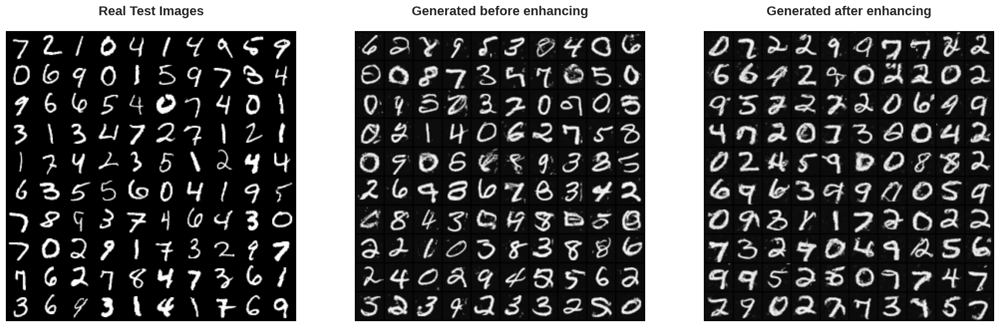

Three-panel comparison saved to: /content/drive/MyDrive/_ddpm_plots/three_panel_comparison.png
Individual panels saved as:
- real_test_images.png
- generated_old_model.png
- generated_new_model.png


In [97]:
def run_complete_active_phase_simplified():
    """
    MAIN FUNCTION: Execute complete active phase with simple visualizations
    This is the ONE FUNCTION you call to run everything
    """
    print("Starting Complete Active Phase with Simple Visualizations")
    print("=" * 80)

    try:
        # Step 1: Train baseline model
        print("\n Step 1: Training Baseline Model")
        train_baseline_model()

        # Step 2: Train OT-enhanced model
        print("\n Step 2: Training OT-Enhanced Model")
        train_ot_enhanced_model()

        # Step 3: Generate simple three-panel comparison
        print("\n Step 3: Generating Three-Panel Comparison")
        plot_simple_three_panel_comparison()

        # Step 4: Generate distance comparison
       # print("\n Step 4: Generating Distance Comparison")
      #  distance_results = plot_distance_comparison()


    except Exception as e:
        print(f"Error during execution: {e}")
        import traceback
        traceback.print_exc()
        return None, None, None

# ============================================================================
# SINGLE LINE EXECUTION
# ============================================================================

# Copy and run this single line to execute everything:
run_complete_active_phase_simplified()

RUNNING COMPREHENSIVE MODEL EVALUATION
Evaluating baseline: /content/drive/MyDrive/_ddpm_mnist_checkpoints_baseline/baseline_epoch035.pt
Evaluating OT-enhanced: /content/drive/MyDrive/_ddpm_mnist_checkpoints_active/ot_enhanced_epoch035.pt

Evaluating Baseline Model...
Starting diffusion model evaluation...
Loading checkpoint from: /content/drive/MyDrive/_ddpm_mnist_checkpoints_baseline/baseline_epoch035.pt
Model loaded successfully!
Generating 2000 samples in batches of 256...


sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

Generated 2000/2000 samples
Final generated tensor shape: torch.Size([2000, 1, 28, 28])
Extracting features from generated samples...


Extracting OT features: 100%|██████████| 8/8 [00:00<00:00, 207.56it/s]

Generated features shape: (2000, 128)
Computing distance metrics...



DIFFUSION MODEL EVALUATION RESULTS

=== OT Distances ===
Train-Test: 0.013730 (baseline)
Train-Gen:  0.127554  | ratio=9.29 → needs improvement
Test-Gen:   0.128490  | ratio=9.36 → needs improvement

=== FID Scores ===
Train-Test: 0.001075 (baseline)
Train-Gen:  0.220596  | ratio=205.26 → needs improvement
Test-Gen:   0.222187  | ratio=206.74 → needs improvement

=== Quality Summary ===
Mean ratio across OT/FID: 107.66 (needs improvement)

Evaluating OT-Enhanced Model...
Starting diffusion model evaluation...
Loading checkpoint from: /content/drive/MyDrive/_ddpm_mnist_checkpoints_active/ot_enhanced_epoch035.pt
Model loaded successfully!
Generating 2000 samples in batches of 256...


sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

Generated 2000/2000 samples
Final generated tensor shape: torch.Size([2000, 1, 28, 28])
Extracting features from generated samples...


Extracting OT features: 100%|██████████| 8/8 [00:00<00:00, 170.25it/s]

Generated features shape: (2000, 128)
Computing distance metrics...



DIFFUSION MODEL EVALUATION RESULTS

=== OT Distances ===
Train-Test: 0.013730 (baseline)
Train-Gen:  0.115614  | ratio=8.42 → needs improvement
Test-Gen:   0.116158  | ratio=8.46 → needs improvement

=== FID Scores ===
Train-Test: 0.001075 (baseline)
Train-Gen:  0.195668  | ratio=182.07 → needs improvement
Test-Gen:   0.195931  | ratio=182.31 → needs improvement

=== Quality Summary ===
Mean ratio across OT/FID: 95.32 (needs improvement)

EVALUATION COMPLETE - SUMMARY
OT Distance Improvements:
  Train-Gen: +0.011940
  Test-Gen:  +0.012332
FID Score Improvements:
  Train-Gen: +0.024928
  Test-Gen:  +0.026257


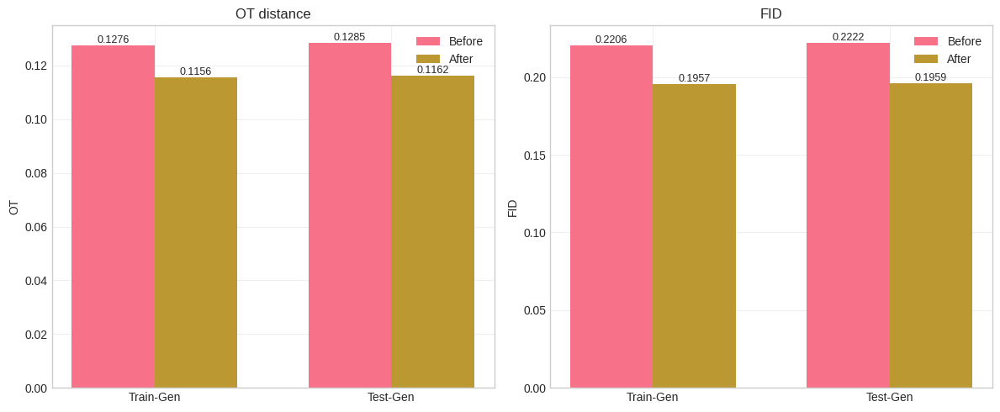

Saved: /content/drive/MyDrive/_ddpm_plots/before_after_ot_fid.png


In [98]:
baseline_results, ot_results = run_model_evaluation()
if baseline_results and ot_results:
    plot_before_after_ot_fid(baseline_results, ot_results)
    _, diffusion_probe = build_model_and_diffusion(device=device)


In [111]:
# ---------- EPOCH EVALUATION HELPERS ----------

import re, json

def _epoch_num_from_name(name: str) -> int:
    m = re.search(r"epoch(\d+)", name)
    return int(m.group(1)) if m else -1

def _sorted_ckpts(ckpt_dir):
    files = [f for f in os.listdir(ckpt_dir) if f.endswith(".pt")]
    return [os.path.join(ckpt_dir, f) for f in sorted(files, key=_epoch_num_from_name)]

def evaluate_checkpoints_in_dir(ckpt_dir, tag="baseline", total_samples=1500):
    """
    Runs your passive-phase evaluator on each checkpoint in a directory.
    Returns a list of dicts: [{'epoch': int, 'ot_train_gen':..., 'ot_test_gen':..., 'fid_train_gen':..., 'fid_test_gen':..., 'ot_train_test':..., 'fid_train_test':...}]
    """
    results = []
    for p in _sorted_ckpts(ckpt_dir):
        ep = _epoch_num_from_name(os.path.basename(p))
        print(f"[{tag}] evaluating epoch {ep} -> {os.path.basename(p)}")
        r = run_complete_diffusion_evaluation(
            p, train_ot_subset, test_ot_subset, trained_feature_network,
            device, total_samples=total_samples
        )
        if r:
            results.append({
                'epoch': ep,
                'ot_train_gen':   r['ot_distances']['train_gen'],
                'ot_test_gen':    r['ot_distances']['test_gen'],
                'fid_train_gen':  r['fid_scores']['train_gen'],
                'fid_test_gen':   r['fid_scores']['test_gen'],
                'ot_train_test':  r['ot_distances']['train_test'],
                'fid_train_test': r['fid_scores']['train_test'],
            })
    # sort by epoch in case of gaps
    results = sorted(results, key=lambda x: x['epoch'])
    # cache to json (optional)
    out = os.path.join(PLOTS_DIR, f"{tag}_epoch_eval.json")
    with open(out, "w") as f:
        json.dump(results, f, indent=2)
    print(f"Saved epoch eval: {out}")
    return results

def _plot_epoch_lines(xs, y_before, y_after, ylabel, title, fname):
    plt.figure(figsize=(8,5))
    plt.plot(xs, y_before, '-o', label='Before (Baseline)')
    plt.plot(xs, y_after,  '-s', label='After (OT-Enhanced)')
    plt.xlabel("Epoch"); plt.ylabel(ylabel); plt.title(title)
    plt.grid(True, alpha=0.3); plt.legend()
    path = os.path.join(PLOTS_DIR, fname)
    plt.savefig(path, dpi=200, bbox_inches='tight', facecolor='white')
    plt.show()
    print(f"Saved: {path}")

def plot_ot_fid_epoch_comparisons(baseline_epoch_results, ot_epoch_results):
    """
    Two figures:
      1) OT vs epoch (Before vs After) – we show fidelity (Test–Gen) on separate lines
      2) FID vs epoch (Before vs After) – same split
    """
    # align by the epochs that exist in BOTH runs
    epochs_b = {r['epoch'] for r in baseline_epoch_results}
    epochs_o = {r['epoch'] for r in ot_epoch_results}
    common   = sorted(list(epochs_b & epochs_o))
    B = {r['epoch']: r for r in baseline_epoch_results}
    O = {r['epoch']: r for r in ot_epoch_results}

    xs = common
    # OT
    _plot_epoch_lines(
        xs,
        [B[e]['ot_test_gen']  for e in xs],
        [O[e]['ot_test_gen']  for e in xs],
        ylabel="OT Distance",
        title="OT Fidelity (Test–Gen) vs Epoch",
        fname="epoch_compare_ot_fidelity.png"
    )

    # FID
    _plot_epoch_lines(
        xs,
        [B[e]['fid_test_gen']  for e in xs],
        [O[e]['fid_test_gen']  for e in xs],
        ylabel="FID Score",
        title="FID Fidelity (Test–Gen) vs Epoch",
        fname="epoch_compare_fid_fidelity.png"
    )



In [112]:
# ---------- precision-only plotting (no coverage) ----------

def plot_precision_only(precision_results, metric="ot", title_suffix="(Enhanced Generator)"):
    """
    Draw a single curve: metric vs noise level.
    metric: "ot" or "fid"
    """
    noise = [r['noise_level'] for r in precision_results]
    if metric == "ot":
        y = [r['ot_distance'] for r in precision_results]
        ylabel = "Sinkhorn OT Distance"
        title = f"Precision/Fidelity: OT vs Noise {title_suffix}"
        style = dict(linestyle='-', marker='o', linewidth=2, markersize=7)
    else:
        y = [r['fid_score'] for r in precision_results]
        ylabel = "FID Score"
        title = f"Precision/Fidelity: FID vs Noise {title_suffix}"
        style = dict(linestyle='--', marker='s', linewidth=2, markersize=7)

    fig, ax = plt.subplots(1, 1, figsize=(7.5, 5))
    ax.plot(noise, y, **style)
    ax.set_xlabel("Noise Level σ", fontsize=12)
    ax.set_ylabel(ylabel, fontsize=12)
    ax.set_title(title, fontsize=13, fontweight='bold')
    ax.grid(True, alpha=0.3)
    ax.tick_params(axis='both', which='major', labelsize=10)
    plt.tight_layout()
    return fig


In [113]:
from torch.utils.data import TensorDataset

@torch.no_grad()
def _extract_fid_features_from_tensor(feature_net, imgs_tensor, batch_size=256):
    ds = TensorDataset(imgs_tensor, torch.full((len(imgs_tensor),), -1, dtype=torch.long))
    feats, _ = extract_features_for_fid(feature_net, ds, device, batch_size=batch_size)
    return feats

@torch.no_grad()
def _extract_ot_features_from_tensor(feature_net, imgs_tensor, batch_size=256):
    ds = TensorDataset(imgs_tensor, torch.full((len(imgs_tensor),), -1, dtype=torch.long))
    feats, _ = extract_features_for_ot(feature_net, ds, device, batch_size=batch_size)
    return feats

def passive_style_plots_for_enhanced_last_ckpt(total_samples=5000):
    # latest enhanced checkpoint
    ckpts = _sorted_ckpts(ACTIVE_CHECKPOINT_DIR)
    if not ckpts:
        print("No enhanced checkpoints found.")
        return
    last_ckpt = ckpts[-1]
    print("Using enhanced checkpoint:", os.path.basename(last_ckpt))

    # generate samples & extract features
    _, diff = build_model_and_diffusion(device=device)
    ck = torch.load(last_ckpt, map_location=device)
    diff.model.load_state_dict(ck['model'])
    diff.model.eval()

    gen = generate_samples_in_batches(
        diff, total_samples=total_samples, processing_batch_size=256, computation_device=device
    )
    if gen is None:
        return

    gen_ot  = _extract_ot_features_from_tensor(trained_feature_network,  gen, batch_size=256)
    gen_fid = _extract_fid_features_from_tensor(trained_feature_network, gen, batch_size=256)

    # --- ONLY precision/fidelity vs noise (no coverage) ---
    precision_results = run_precision_fidelity_analysis(
        train_ot_subset, gen_ot, train_fid_subset, gen_fid, blur=0.05
    )

    fig_ot  = plot_precision_only(precision_results, metric="ot",  title_suffix="(Enhanced Generator)")
    fig_fid = plot_precision_only(precision_results, metric="fid", title_suffix="(Enhanced Generator)")

    # save
    out1 = os.path.join(PLOTS_DIR, "enhanced_precision_only_ot.png")
    out2 = os.path.join(PLOTS_DIR, "enhanced_precision_only_fid.png")
    fig_ot.savefig(out1,  dpi=200, bbox_inches='tight', facecolor='white')
    fig_fid.savefig(out2, dpi=200, bbox_inches='tight', facecolor='white')
    plt.show()
    print(f"Saved:\n- {out1}\n- {out2}")


[baseline] evaluating epoch 1 -> baseline_epoch001.pt
Starting diffusion model evaluation...
Loading checkpoint from: /content/drive/MyDrive/_ddpm_mnist_checkpoints_baseline/baseline_epoch001.pt
Model loaded successfully!
Generating 1500 samples in batches of 256...


sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

Generated 1500/1500 samples
Final generated tensor shape: torch.Size([1500, 1, 28, 28])
Extracting features from generated samples...


Extracting OT features: 100%|██████████| 6/6 [00:00<00:00, 193.21it/s]

Generated features shape: (1500, 128)
Computing distance metrics...



DIFFUSION MODEL EVALUATION RESULTS

=== OT Distances ===
Train-Test: 0.013730 (baseline)
Train-Gen:  0.187070  | ratio=13.63 → needs improvement
Test-Gen:   0.187806  | ratio=13.68 → needs improvement

=== FID Scores ===
Train-Test: 0.001075 (baseline)
Train-Gen:  0.330223  | ratio=307.27 → needs improvement
Test-Gen:   0.331486  | ratio=308.44 → needs improvement

=== Quality Summary ===
Mean ratio across OT/FID: 160.75 (needs improvement)
[baseline] evaluating epoch 2 -> baseline_epoch002.pt
Starting diffusion model evaluation...
Loading checkpoint from: /content/drive/MyDrive/_ddpm_mnist_checkpoints_baseline/baseline_epoch002.pt
Model loaded successfully!
Generating 1500 samples in batches of 256...


sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

Generated 1500/1500 samples
Final generated tensor shape: torch.Size([1500, 1, 28, 28])
Extracting features from generated samples...


Extracting OT features: 100%|██████████| 6/6 [00:00<00:00, 171.68it/s]

Generated features shape: (1500, 128)
Computing distance metrics...



DIFFUSION MODEL EVALUATION RESULTS

=== OT Distances ===
Train-Test: 0.013730 (baseline)
Train-Gen:  0.168707  | ratio=12.29 → needs improvement
Test-Gen:   0.168932  | ratio=12.30 → needs improvement

=== FID Scores ===
Train-Test: 0.001075 (baseline)
Train-Gen:  0.287279  | ratio=267.31 → needs improvement
Test-Gen:   0.287233  | ratio=267.27 → needs improvement

=== Quality Summary ===
Mean ratio across OT/FID: 139.79 (needs improvement)
[baseline] evaluating epoch 3 -> baseline_epoch003.pt
Starting diffusion model evaluation...
Loading checkpoint from: /content/drive/MyDrive/_ddpm_mnist_checkpoints_baseline/baseline_epoch003.pt
Model loaded successfully!
Generating 1500 samples in batches of 256...


sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

Generated 1500/1500 samples
Final generated tensor shape: torch.Size([1500, 1, 28, 28])
Extracting features from generated samples...


Extracting OT features: 100%|██████████| 6/6 [00:00<00:00, 189.17it/s]

Generated features shape: (1500, 128)
Computing distance metrics...



DIFFUSION MODEL EVALUATION RESULTS

=== OT Distances ===
Train-Test: 0.013730 (baseline)
Train-Gen:  0.137917  | ratio=10.05 → needs improvement
Test-Gen:   0.138450  | ratio=10.08 → needs improvement

=== FID Scores ===
Train-Test: 0.001075 (baseline)
Train-Gen:  0.231399  | ratio=215.31 → needs improvement
Test-Gen:   0.232327  | ratio=216.18 → needs improvement

=== Quality Summary ===
Mean ratio across OT/FID: 112.91 (needs improvement)
[baseline] evaluating epoch 4 -> baseline_epoch004.pt
Starting diffusion model evaluation...
Loading checkpoint from: /content/drive/MyDrive/_ddpm_mnist_checkpoints_baseline/baseline_epoch004.pt
Model loaded successfully!
Generating 1500 samples in batches of 256...


sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

Generated 1500/1500 samples
Final generated tensor shape: torch.Size([1500, 1, 28, 28])
Extracting features from generated samples...


Extracting OT features: 100%|██████████| 6/6 [00:00<00:00, 185.68it/s]

Generated features shape: (1500, 128)
Computing distance metrics...



DIFFUSION MODEL EVALUATION RESULTS

=== OT Distances ===
Train-Test: 0.013730 (baseline)
Train-Gen:  0.141125  | ratio=10.28 → needs improvement
Test-Gen:   0.141979  | ratio=10.34 → needs improvement

=== FID Scores ===
Train-Test: 0.001075 (baseline)
Train-Gen:  0.239150  | ratio=222.53 → needs improvement
Test-Gen:   0.240707  | ratio=223.98 → needs improvement

=== Quality Summary ===
Mean ratio across OT/FID: 116.78 (needs improvement)
[baseline] evaluating epoch 5 -> baseline_epoch005.pt
Starting diffusion model evaluation...
Loading checkpoint from: /content/drive/MyDrive/_ddpm_mnist_checkpoints_baseline/baseline_epoch005.pt
Model loaded successfully!
Generating 1500 samples in batches of 256...


sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

Generated 1500/1500 samples
Final generated tensor shape: torch.Size([1500, 1, 28, 28])
Extracting features from generated samples...


Extracting OT features: 100%|██████████| 6/6 [00:00<00:00, 187.68it/s]

Generated features shape: (1500, 128)
Computing distance metrics...



DIFFUSION MODEL EVALUATION RESULTS

=== OT Distances ===
Train-Test: 0.013730 (baseline)
Train-Gen:  0.136240  | ratio=9.92 → needs improvement
Test-Gen:   0.137350  | ratio=10.00 → needs improvement

=== FID Scores ===
Train-Test: 0.001075 (baseline)
Train-Gen:  0.231956  | ratio=215.83 → needs improvement
Test-Gen:   0.233515  | ratio=217.28 → needs improvement

=== Quality Summary ===
Mean ratio across OT/FID: 113.26 (needs improvement)
[baseline] evaluating epoch 6 -> baseline_epoch006.pt
Starting diffusion model evaluation...
Loading checkpoint from: /content/drive/MyDrive/_ddpm_mnist_checkpoints_baseline/baseline_epoch006.pt
Model loaded successfully!
Generating 1500 samples in batches of 256...


sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

Generated 1500/1500 samples
Final generated tensor shape: torch.Size([1500, 1, 28, 28])
Extracting features from generated samples...


Extracting OT features: 100%|██████████| 6/6 [00:00<00:00, 187.54it/s]

Generated features shape: (1500, 128)
Computing distance metrics...



DIFFUSION MODEL EVALUATION RESULTS

=== OT Distances ===
Train-Test: 0.013730 (baseline)
Train-Gen:  0.136753  | ratio=9.96 → needs improvement
Test-Gen:   0.137820  | ratio=10.04 → needs improvement

=== FID Scores ===
Train-Test: 0.001075 (baseline)
Train-Gen:  0.229817  | ratio=213.84 → needs improvement
Test-Gen:   0.231462  | ratio=215.37 → needs improvement

=== Quality Summary ===
Mean ratio across OT/FID: 112.30 (needs improvement)
[baseline] evaluating epoch 7 -> baseline_epoch007.pt
Starting diffusion model evaluation...
Loading checkpoint from: /content/drive/MyDrive/_ddpm_mnist_checkpoints_baseline/baseline_epoch007.pt
Model loaded successfully!
Generating 1500 samples in batches of 256...


sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

Generated 1500/1500 samples
Final generated tensor shape: torch.Size([1500, 1, 28, 28])
Extracting features from generated samples...


Extracting OT features: 100%|██████████| 6/6 [00:00<00:00, 186.73it/s]

Generated features shape: (1500, 128)
Computing distance metrics...



DIFFUSION MODEL EVALUATION RESULTS

=== OT Distances ===
Train-Test: 0.013730 (baseline)
Train-Gen:  0.141144  | ratio=10.28 → needs improvement
Test-Gen:   0.141853  | ratio=10.33 → needs improvement

=== FID Scores ===
Train-Test: 0.001075 (baseline)
Train-Gen:  0.238500  | ratio=221.92 → needs improvement
Test-Gen:   0.239600  | ratio=222.95 → needs improvement

=== Quality Summary ===
Mean ratio across OT/FID: 116.37 (needs improvement)
[baseline] evaluating epoch 8 -> baseline_epoch008.pt
Starting diffusion model evaluation...
Loading checkpoint from: /content/drive/MyDrive/_ddpm_mnist_checkpoints_baseline/baseline_epoch008.pt
Model loaded successfully!
Generating 1500 samples in batches of 256...


sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

Generated 1500/1500 samples
Final generated tensor shape: torch.Size([1500, 1, 28, 28])
Extracting features from generated samples...


Extracting OT features: 100%|██████████| 6/6 [00:00<00:00, 183.50it/s]

Generated features shape: (1500, 128)
Computing distance metrics...



DIFFUSION MODEL EVALUATION RESULTS

=== OT Distances ===
Train-Test: 0.013730 (baseline)
Train-Gen:  0.145399  | ratio=10.59 → needs improvement
Test-Gen:   0.146049  | ratio=10.64 → needs improvement

=== FID Scores ===
Train-Test: 0.001075 (baseline)
Train-Gen:  0.248398  | ratio=231.13 → needs improvement
Test-Gen:   0.249579  | ratio=232.23 → needs improvement

=== Quality Summary ===
Mean ratio across OT/FID: 121.15 (needs improvement)
[baseline] evaluating epoch 9 -> baseline_epoch009.pt
Starting diffusion model evaluation...
Loading checkpoint from: /content/drive/MyDrive/_ddpm_mnist_checkpoints_baseline/baseline_epoch009.pt
Model loaded successfully!
Generating 1500 samples in batches of 256...


sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

Generated 1500/1500 samples
Final generated tensor shape: torch.Size([1500, 1, 28, 28])
Extracting features from generated samples...


Extracting OT features: 100%|██████████| 6/6 [00:00<00:00, 189.10it/s]

Generated features shape: (1500, 128)
Computing distance metrics...



DIFFUSION MODEL EVALUATION RESULTS

=== OT Distances ===
Train-Test: 0.013730 (baseline)
Train-Gen:  0.135958  | ratio=9.90 → needs improvement
Test-Gen:   0.136411  | ratio=9.94 → needs improvement

=== FID Scores ===
Train-Test: 0.001075 (baseline)
Train-Gen:  0.230912  | ratio=214.86 → needs improvement
Test-Gen:   0.231527  | ratio=215.43 → needs improvement

=== Quality Summary ===
Mean ratio across OT/FID: 112.53 (needs improvement)
[baseline] evaluating epoch 10 -> baseline_epoch010.pt
Starting diffusion model evaluation...
Loading checkpoint from: /content/drive/MyDrive/_ddpm_mnist_checkpoints_baseline/baseline_epoch010.pt
Model loaded successfully!
Generating 1500 samples in batches of 256...


sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

Generated 1500/1500 samples
Final generated tensor shape: torch.Size([1500, 1, 28, 28])
Extracting features from generated samples...


Extracting OT features: 100%|██████████| 6/6 [00:00<00:00, 157.30it/s]

Generated features shape: (1500, 128)
Computing distance metrics...



DIFFUSION MODEL EVALUATION RESULTS

=== OT Distances ===
Train-Test: 0.013730 (baseline)
Train-Gen:  0.140807  | ratio=10.26 → needs improvement
Test-Gen:   0.141888  | ratio=10.33 → needs improvement

=== FID Scores ===
Train-Test: 0.001075 (baseline)
Train-Gen:  0.242635  | ratio=225.77 → needs improvement
Test-Gen:   0.244070  | ratio=227.10 → needs improvement

=== Quality Summary ===
Mean ratio across OT/FID: 118.37 (needs improvement)
[baseline] evaluating epoch 11 -> baseline_epoch011.pt
Starting diffusion model evaluation...
Loading checkpoint from: /content/drive/MyDrive/_ddpm_mnist_checkpoints_baseline/baseline_epoch011.pt
Model loaded successfully!
Generating 1500 samples in batches of 256...


sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

Generated 1500/1500 samples
Final generated tensor shape: torch.Size([1500, 1, 28, 28])
Extracting features from generated samples...


Extracting OT features: 100%|██████████| 6/6 [00:00<00:00, 191.61it/s]

Generated features shape: (1500, 128)
Computing distance metrics...



DIFFUSION MODEL EVALUATION RESULTS

=== OT Distances ===
Train-Test: 0.013730 (baseline)
Train-Gen:  0.130469  | ratio=9.50 → needs improvement
Test-Gen:   0.131812  | ratio=9.60 → needs improvement

=== FID Scores ===
Train-Test: 0.001075 (baseline)
Train-Gen:  0.227762  | ratio=211.93 → needs improvement
Test-Gen:   0.229567  | ratio=213.61 → needs improvement

=== Quality Summary ===
Mean ratio across OT/FID: 111.16 (needs improvement)
[baseline] evaluating epoch 12 -> baseline_epoch012.pt
Starting diffusion model evaluation...
Loading checkpoint from: /content/drive/MyDrive/_ddpm_mnist_checkpoints_baseline/baseline_epoch012.pt
Model loaded successfully!
Generating 1500 samples in batches of 256...


sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

Generated 1500/1500 samples
Final generated tensor shape: torch.Size([1500, 1, 28, 28])
Extracting features from generated samples...


Extracting OT features: 100%|██████████| 6/6 [00:00<00:00, 189.53it/s]

Generated features shape: (1500, 128)
Computing distance metrics...



DIFFUSION MODEL EVALUATION RESULTS

=== OT Distances ===
Train-Test: 0.013730 (baseline)
Train-Gen:  0.134066  | ratio=9.76 → needs improvement
Test-Gen:   0.134792  | ratio=9.82 → needs improvement

=== FID Scores ===
Train-Test: 0.001075 (baseline)
Train-Gen:  0.228370  | ratio=212.50 → needs improvement
Test-Gen:   0.229492  | ratio=213.54 → needs improvement

=== Quality Summary ===
Mean ratio across OT/FID: 111.40 (needs improvement)
[baseline] evaluating epoch 13 -> baseline_epoch013.pt
Starting diffusion model evaluation...
Loading checkpoint from: /content/drive/MyDrive/_ddpm_mnist_checkpoints_baseline/baseline_epoch013.pt
Model loaded successfully!
Generating 1500 samples in batches of 256...


sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

Generated 1500/1500 samples
Final generated tensor shape: torch.Size([1500, 1, 28, 28])
Extracting features from generated samples...


Extracting OT features: 100%|██████████| 6/6 [00:00<00:00, 177.82it/s]

Generated features shape: (1500, 128)
Computing distance metrics...



DIFFUSION MODEL EVALUATION RESULTS

=== OT Distances ===
Train-Test: 0.013730 (baseline)
Train-Gen:  0.127706  | ratio=9.30 → needs improvement
Test-Gen:   0.128459  | ratio=9.36 → needs improvement

=== FID Scores ===
Train-Test: 0.001075 (baseline)
Train-Gen:  0.221161  | ratio=205.79 → needs improvement
Test-Gen:   0.222367  | ratio=206.91 → needs improvement

=== Quality Summary ===
Mean ratio across OT/FID: 107.84 (needs improvement)
[baseline] evaluating epoch 14 -> baseline_epoch014.pt
Starting diffusion model evaluation...
Loading checkpoint from: /content/drive/MyDrive/_ddpm_mnist_checkpoints_baseline/baseline_epoch014.pt
Model loaded successfully!
Generating 1500 samples in batches of 256...


sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

Generated 1500/1500 samples
Final generated tensor shape: torch.Size([1500, 1, 28, 28])
Extracting features from generated samples...


Extracting OT features: 100%|██████████| 6/6 [00:00<00:00, 190.58it/s]

Generated features shape: (1500, 128)
Computing distance metrics...



DIFFUSION MODEL EVALUATION RESULTS

=== OT Distances ===
Train-Test: 0.013730 (baseline)
Train-Gen:  0.133348  | ratio=9.71 → needs improvement
Test-Gen:   0.134256  | ratio=9.78 → needs improvement

=== FID Scores ===
Train-Test: 0.001075 (baseline)
Train-Gen:  0.233414  | ratio=217.19 → needs improvement
Test-Gen:   0.234834  | ratio=218.51 → needs improvement

=== Quality Summary ===
Mean ratio across OT/FID: 113.80 (needs improvement)
[baseline] evaluating epoch 15 -> baseline_epoch015.pt
Starting diffusion model evaluation...
Loading checkpoint from: /content/drive/MyDrive/_ddpm_mnist_checkpoints_baseline/baseline_epoch015.pt
Model loaded successfully!
Generating 1500 samples in batches of 256...


sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

Generated 1500/1500 samples
Final generated tensor shape: torch.Size([1500, 1, 28, 28])
Extracting features from generated samples...


Extracting OT features: 100%|██████████| 6/6 [00:00<00:00, 150.31it/s]

Generated features shape: (1500, 128)
Computing distance metrics...



DIFFUSION MODEL EVALUATION RESULTS

=== OT Distances ===
Train-Test: 0.013730 (baseline)
Train-Gen:  0.136779  | ratio=9.96 → needs improvement
Test-Gen:   0.137483  | ratio=10.01 → needs improvement

=== FID Scores ===
Train-Test: 0.001075 (baseline)
Train-Gen:  0.232496  | ratio=216.34 → needs improvement
Test-Gen:   0.233765  | ratio=217.52 → needs improvement

=== Quality Summary ===
Mean ratio across OT/FID: 113.46 (needs improvement)
[baseline] evaluating epoch 16 -> baseline_epoch016.pt
Starting diffusion model evaluation...
Loading checkpoint from: /content/drive/MyDrive/_ddpm_mnist_checkpoints_baseline/baseline_epoch016.pt
Model loaded successfully!
Generating 1500 samples in batches of 256...


sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

Generated 1500/1500 samples
Final generated tensor shape: torch.Size([1500, 1, 28, 28])
Extracting features from generated samples...


Extracting OT features: 100%|██████████| 6/6 [00:00<00:00, 183.69it/s]

Generated features shape: (1500, 128)
Computing distance metrics...



DIFFUSION MODEL EVALUATION RESULTS

=== OT Distances ===
Train-Test: 0.013730 (baseline)
Train-Gen:  0.139146  | ratio=10.13 → needs improvement
Test-Gen:   0.139831  | ratio=10.18 → needs improvement

=== FID Scores ===
Train-Test: 0.001075 (baseline)
Train-Gen:  0.240250  | ratio=223.55 → needs improvement
Test-Gen:   0.241393  | ratio=224.61 → needs improvement

=== Quality Summary ===
Mean ratio across OT/FID: 117.12 (needs improvement)
[baseline] evaluating epoch 17 -> baseline_epoch017.pt
Starting diffusion model evaluation...
Loading checkpoint from: /content/drive/MyDrive/_ddpm_mnist_checkpoints_baseline/baseline_epoch017.pt
Model loaded successfully!
Generating 1500 samples in batches of 256...


sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

Generated 1500/1500 samples
Final generated tensor shape: torch.Size([1500, 1, 28, 28])
Extracting features from generated samples...


Extracting OT features: 100%|██████████| 6/6 [00:00<00:00, 192.16it/s]

Generated features shape: (1500, 128)
Computing distance metrics...



DIFFUSION MODEL EVALUATION RESULTS

=== OT Distances ===
Train-Test: 0.013730 (baseline)
Train-Gen:  0.128030  | ratio=9.33 → needs improvement
Test-Gen:   0.128736  | ratio=9.38 → needs improvement

=== FID Scores ===
Train-Test: 0.001075 (baseline)
Train-Gen:  0.225122  | ratio=209.47 → needs improvement
Test-Gen:   0.226484  | ratio=210.74 → needs improvement

=== Quality Summary ===
Mean ratio across OT/FID: 109.73 (needs improvement)
[baseline] evaluating epoch 18 -> baseline_epoch018.pt
Starting diffusion model evaluation...
Loading checkpoint from: /content/drive/MyDrive/_ddpm_mnist_checkpoints_baseline/baseline_epoch018.pt
Model loaded successfully!
Generating 1500 samples in batches of 256...


sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

Generated 1500/1500 samples
Final generated tensor shape: torch.Size([1500, 1, 28, 28])
Extracting features from generated samples...


Extracting OT features: 100%|██████████| 6/6 [00:00<00:00, 179.64it/s]

Generated features shape: (1500, 128)
Computing distance metrics...



DIFFUSION MODEL EVALUATION RESULTS

=== OT Distances ===
Train-Test: 0.013730 (baseline)
Train-Gen:  0.131123  | ratio=9.55 → needs improvement
Test-Gen:   0.132231  | ratio=9.63 → needs improvement

=== FID Scores ===
Train-Test: 0.001075 (baseline)
Train-Gen:  0.226771  | ratio=211.01 → needs improvement
Test-Gen:   0.228136  | ratio=212.28 → needs improvement

=== Quality Summary ===
Mean ratio across OT/FID: 110.62 (needs improvement)
[baseline] evaluating epoch 19 -> baseline_epoch019.pt
Starting diffusion model evaluation...
Loading checkpoint from: /content/drive/MyDrive/_ddpm_mnist_checkpoints_baseline/baseline_epoch019.pt
Model loaded successfully!
Generating 1500 samples in batches of 256...


sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

Generated 1500/1500 samples
Final generated tensor shape: torch.Size([1500, 1, 28, 28])
Extracting features from generated samples...


Extracting OT features: 100%|██████████| 6/6 [00:00<00:00, 195.77it/s]

Generated features shape: (1500, 128)
Computing distance metrics...



DIFFUSION MODEL EVALUATION RESULTS

=== OT Distances ===
Train-Test: 0.013730 (baseline)
Train-Gen:  0.151594  | ratio=11.04 → needs improvement
Test-Gen:   0.152273  | ratio=11.09 → needs improvement

=== FID Scores ===
Train-Test: 0.001075 (baseline)
Train-Gen:  0.261747  | ratio=243.55 → needs improvement
Test-Gen:   0.262840  | ratio=244.57 → needs improvement

=== Quality Summary ===
Mean ratio across OT/FID: 127.56 (needs improvement)
[baseline] evaluating epoch 20 -> baseline_epoch020.pt
Starting diffusion model evaluation...
Loading checkpoint from: /content/drive/MyDrive/_ddpm_mnist_checkpoints_baseline/baseline_epoch020.pt
Model loaded successfully!
Generating 1500 samples in batches of 256...


sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

Generated 1500/1500 samples
Final generated tensor shape: torch.Size([1500, 1, 28, 28])
Extracting features from generated samples...


Extracting OT features: 100%|██████████| 6/6 [00:00<00:00, 182.89it/s]

Generated features shape: (1500, 128)
Computing distance metrics...



DIFFUSION MODEL EVALUATION RESULTS

=== OT Distances ===
Train-Test: 0.013730 (baseline)
Train-Gen:  0.129895  | ratio=9.46 → needs improvement
Test-Gen:   0.130720  | ratio=9.52 → needs improvement

=== FID Scores ===
Train-Test: 0.001075 (baseline)
Train-Gen:  0.225462  | ratio=209.79 → needs improvement
Test-Gen:   0.226462  | ratio=210.72 → needs improvement

=== Quality Summary ===
Mean ratio across OT/FID: 109.87 (needs improvement)
[baseline] evaluating epoch 21 -> baseline_epoch021.pt
Starting diffusion model evaluation...
Loading checkpoint from: /content/drive/MyDrive/_ddpm_mnist_checkpoints_baseline/baseline_epoch021.pt
Model loaded successfully!
Generating 1500 samples in batches of 256...


sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

Generated 1500/1500 samples
Final generated tensor shape: torch.Size([1500, 1, 28, 28])
Extracting features from generated samples...


Extracting OT features: 100%|██████████| 6/6 [00:00<00:00, 191.01it/s]

Generated features shape: (1500, 128)
Computing distance metrics...



DIFFUSION MODEL EVALUATION RESULTS

=== OT Distances ===
Train-Test: 0.013730 (baseline)
Train-Gen:  0.136947  | ratio=9.97 → needs improvement
Test-Gen:   0.137442  | ratio=10.01 → needs improvement

=== FID Scores ===
Train-Test: 0.001075 (baseline)
Train-Gen:  0.231081  | ratio=215.02 → needs improvement
Test-Gen:   0.231785  | ratio=215.67 → needs improvement

=== Quality Summary ===
Mean ratio across OT/FID: 112.67 (needs improvement)
[baseline] evaluating epoch 22 -> baseline_epoch022.pt
Starting diffusion model evaluation...
Loading checkpoint from: /content/drive/MyDrive/_ddpm_mnist_checkpoints_baseline/baseline_epoch022.pt
Model loaded successfully!
Generating 1500 samples in batches of 256...


sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

Generated 1500/1500 samples
Final generated tensor shape: torch.Size([1500, 1, 28, 28])
Extracting features from generated samples...


Extracting OT features: 100%|██████████| 6/6 [00:00<00:00, 194.68it/s]

Generated features shape: (1500, 128)
Computing distance metrics...



DIFFUSION MODEL EVALUATION RESULTS

=== OT Distances ===
Train-Test: 0.013730 (baseline)
Train-Gen:  0.125794  | ratio=9.16 → needs improvement
Test-Gen:   0.126287  | ratio=9.20 → needs improvement

=== FID Scores ===
Train-Test: 0.001075 (baseline)
Train-Gen:  0.220045  | ratio=204.75 → needs improvement
Test-Gen:   0.220944  | ratio=205.59 → needs improvement

=== Quality Summary ===
Mean ratio across OT/FID: 107.17 (needs improvement)
[baseline] evaluating epoch 23 -> baseline_epoch023.pt
Starting diffusion model evaluation...
Loading checkpoint from: /content/drive/MyDrive/_ddpm_mnist_checkpoints_baseline/baseline_epoch023.pt
Model loaded successfully!
Generating 1500 samples in batches of 256...


sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

Generated 1500/1500 samples
Final generated tensor shape: torch.Size([1500, 1, 28, 28])
Extracting features from generated samples...


Extracting OT features: 100%|██████████| 6/6 [00:00<00:00, 188.60it/s]

Generated features shape: (1500, 128)
Computing distance metrics...



DIFFUSION MODEL EVALUATION RESULTS

=== OT Distances ===
Train-Test: 0.013730 (baseline)
Train-Gen:  0.136736  | ratio=9.96 → needs improvement
Test-Gen:   0.137435  | ratio=10.01 → needs improvement

=== FID Scores ===
Train-Test: 0.001075 (baseline)
Train-Gen:  0.234831  | ratio=218.51 → needs improvement
Test-Gen:   0.236033  | ratio=219.63 → needs improvement

=== Quality Summary ===
Mean ratio across OT/FID: 114.53 (needs improvement)
[baseline] evaluating epoch 24 -> baseline_epoch024.pt
Starting diffusion model evaluation...
Loading checkpoint from: /content/drive/MyDrive/_ddpm_mnist_checkpoints_baseline/baseline_epoch024.pt
Model loaded successfully!
Generating 1500 samples in batches of 256...


sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

Generated 1500/1500 samples
Final generated tensor shape: torch.Size([1500, 1, 28, 28])
Extracting features from generated samples...


Extracting OT features: 100%|██████████| 6/6 [00:00<00:00, 186.21it/s]

Generated features shape: (1500, 128)
Computing distance metrics...



DIFFUSION MODEL EVALUATION RESULTS

=== OT Distances ===
Train-Test: 0.013730 (baseline)
Train-Gen:  0.132615  | ratio=9.66 → needs improvement
Test-Gen:   0.133124  | ratio=9.70 → needs improvement

=== FID Scores ===
Train-Test: 0.001075 (baseline)
Train-Gen:  0.230285  | ratio=214.28 → needs improvement
Test-Gen:   0.230952  | ratio=214.90 → needs improvement

=== Quality Summary ===
Mean ratio across OT/FID: 112.13 (needs improvement)
[baseline] evaluating epoch 25 -> baseline_epoch025.pt
Starting diffusion model evaluation...
Loading checkpoint from: /content/drive/MyDrive/_ddpm_mnist_checkpoints_baseline/baseline_epoch025.pt
Model loaded successfully!
Generating 1500 samples in batches of 256...


sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

Generated 1500/1500 samples
Final generated tensor shape: torch.Size([1500, 1, 28, 28])
Extracting features from generated samples...


Extracting OT features: 100%|██████████| 6/6 [00:00<00:00, 156.11it/s]

Generated features shape: (1500, 128)
Computing distance metrics...



DIFFUSION MODEL EVALUATION RESULTS

=== OT Distances ===
Train-Test: 0.013730 (baseline)
Train-Gen:  0.129994  | ratio=9.47 → needs improvement
Test-Gen:   0.130757  | ratio=9.52 → needs improvement

=== FID Scores ===
Train-Test: 0.001075 (baseline)
Train-Gen:  0.225455  | ratio=209.78 → needs improvement
Test-Gen:   0.226476  | ratio=210.73 → needs improvement

=== Quality Summary ===
Mean ratio across OT/FID: 109.88 (needs improvement)
[baseline] evaluating epoch 26 -> baseline_epoch026.pt
Starting diffusion model evaluation...
Loading checkpoint from: /content/drive/MyDrive/_ddpm_mnist_checkpoints_baseline/baseline_epoch026.pt
Model loaded successfully!
Generating 1500 samples in batches of 256...


sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

Generated 1500/1500 samples
Final generated tensor shape: torch.Size([1500, 1, 28, 28])
Extracting features from generated samples...


Extracting OT features: 100%|██████████| 6/6 [00:00<00:00, 157.09it/s]

Generated features shape: (1500, 128)
Computing distance metrics...



DIFFUSION MODEL EVALUATION RESULTS

=== OT Distances ===
Train-Test: 0.013730 (baseline)
Train-Gen:  0.131836  | ratio=9.60 → needs improvement
Test-Gen:   0.132332  | ratio=9.64 → needs improvement

=== FID Scores ===
Train-Test: 0.001075 (baseline)
Train-Gen:  0.226749  | ratio=210.99 → needs improvement
Test-Gen:   0.227548  | ratio=211.73 → needs improvement

=== Quality Summary ===
Mean ratio across OT/FID: 110.49 (needs improvement)
[baseline] evaluating epoch 27 -> baseline_epoch027.pt
Starting diffusion model evaluation...
Loading checkpoint from: /content/drive/MyDrive/_ddpm_mnist_checkpoints_baseline/baseline_epoch027.pt
Model loaded successfully!
Generating 1500 samples in batches of 256...


sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

Generated 1500/1500 samples
Final generated tensor shape: torch.Size([1500, 1, 28, 28])
Extracting features from generated samples...


Extracting OT features: 100%|██████████| 6/6 [00:00<00:00, 189.95it/s]

Generated features shape: (1500, 128)
Computing distance metrics...



DIFFUSION MODEL EVALUATION RESULTS

=== OT Distances ===
Train-Test: 0.013730 (baseline)
Train-Gen:  0.140785  | ratio=10.25 → needs improvement
Test-Gen:   0.141683  | ratio=10.32 → needs improvement

=== FID Scores ===
Train-Test: 0.001075 (baseline)
Train-Gen:  0.242629  | ratio=225.76 → needs improvement
Test-Gen:   0.243878  | ratio=226.93 → needs improvement

=== Quality Summary ===
Mean ratio across OT/FID: 118.32 (needs improvement)
[baseline] evaluating epoch 28 -> baseline_epoch028.pt
Starting diffusion model evaluation...
Loading checkpoint from: /content/drive/MyDrive/_ddpm_mnist_checkpoints_baseline/baseline_epoch028.pt
Model loaded successfully!
Generating 1500 samples in batches of 256...


sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

Generated 1500/1500 samples
Final generated tensor shape: torch.Size([1500, 1, 28, 28])
Extracting features from generated samples...


Extracting OT features: 100%|██████████| 6/6 [00:00<00:00, 193.39it/s]

Generated features shape: (1500, 128)
Computing distance metrics...



DIFFUSION MODEL EVALUATION RESULTS

=== OT Distances ===
Train-Test: 0.013730 (baseline)
Train-Gen:  0.134930  | ratio=9.83 → needs improvement
Test-Gen:   0.135821  | ratio=9.89 → needs improvement

=== FID Scores ===
Train-Test: 0.001075 (baseline)
Train-Gen:  0.238278  | ratio=221.72 → needs improvement
Test-Gen:   0.239858  | ratio=223.19 → needs improvement

=== Quality Summary ===
Mean ratio across OT/FID: 116.16 (needs improvement)
[baseline] evaluating epoch 29 -> baseline_epoch029.pt
Starting diffusion model evaluation...
Loading checkpoint from: /content/drive/MyDrive/_ddpm_mnist_checkpoints_baseline/baseline_epoch029.pt
Model loaded successfully!
Generating 1500 samples in batches of 256...


sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

Generated 1500/1500 samples
Final generated tensor shape: torch.Size([1500, 1, 28, 28])
Extracting features from generated samples...


Extracting OT features: 100%|██████████| 6/6 [00:00<00:00, 183.46it/s]

Generated features shape: (1500, 128)
Computing distance metrics...



DIFFUSION MODEL EVALUATION RESULTS

=== OT Distances ===
Train-Test: 0.013730 (baseline)
Train-Gen:  0.124660  | ratio=9.08 → needs improvement
Test-Gen:   0.125749  | ratio=9.16 → needs improvement

=== FID Scores ===
Train-Test: 0.001075 (baseline)
Train-Gen:  0.214283  | ratio=199.39 → needs improvement
Test-Gen:   0.215966  | ratio=200.95 → needs improvement

=== Quality Summary ===
Mean ratio across OT/FID: 104.65 (needs improvement)
[baseline] evaluating epoch 30 -> baseline_epoch030.pt
Starting diffusion model evaluation...
Loading checkpoint from: /content/drive/MyDrive/_ddpm_mnist_checkpoints_baseline/baseline_epoch030.pt
Model loaded successfully!
Generating 1500 samples in batches of 256...


sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

Generated 1500/1500 samples
Final generated tensor shape: torch.Size([1500, 1, 28, 28])
Extracting features from generated samples...


Extracting OT features: 100%|██████████| 6/6 [00:00<00:00, 171.77it/s]

Generated features shape: (1500, 128)
Computing distance metrics...



DIFFUSION MODEL EVALUATION RESULTS

=== OT Distances ===
Train-Test: 0.013730 (baseline)
Train-Gen:  0.128549  | ratio=9.36 → needs improvement
Test-Gen:   0.129031  | ratio=9.40 → needs improvement

=== FID Scores ===
Train-Test: 0.001075 (baseline)
Train-Gen:  0.219174  | ratio=203.94 → needs improvement
Test-Gen:   0.220033  | ratio=204.74 → needs improvement

=== Quality Summary ===
Mean ratio across OT/FID: 106.86 (needs improvement)
[baseline] evaluating epoch 31 -> baseline_epoch031.pt
Starting diffusion model evaluation...
Loading checkpoint from: /content/drive/MyDrive/_ddpm_mnist_checkpoints_baseline/baseline_epoch031.pt
Model loaded successfully!
Generating 1500 samples in batches of 256...


sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

Generated 1500/1500 samples
Final generated tensor shape: torch.Size([1500, 1, 28, 28])
Extracting features from generated samples...


Extracting OT features: 100%|██████████| 6/6 [00:00<00:00, 186.14it/s]

Generated features shape: (1500, 128)
Computing distance metrics...



DIFFUSION MODEL EVALUATION RESULTS

=== OT Distances ===
Train-Test: 0.013730 (baseline)
Train-Gen:  0.133803  | ratio=9.75 → needs improvement
Test-Gen:   0.134548  | ratio=9.80 → needs improvement

=== FID Scores ===
Train-Test: 0.001075 (baseline)
Train-Gen:  0.232509  | ratio=216.35 → needs improvement
Test-Gen:   0.233612  | ratio=217.37 → needs improvement

=== Quality Summary ===
Mean ratio across OT/FID: 113.32 (needs improvement)
[baseline] evaluating epoch 32 -> baseline_epoch032.pt
Starting diffusion model evaluation...
Loading checkpoint from: /content/drive/MyDrive/_ddpm_mnist_checkpoints_baseline/baseline_epoch032.pt
Model loaded successfully!
Generating 1500 samples in batches of 256...


sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

Generated 1500/1500 samples
Final generated tensor shape: torch.Size([1500, 1, 28, 28])
Extracting features from generated samples...


Extracting OT features: 100%|██████████| 6/6 [00:00<00:00, 157.99it/s]

Generated features shape: (1500, 128)
Computing distance metrics...



DIFFUSION MODEL EVALUATION RESULTS

=== OT Distances ===
Train-Test: 0.013730 (baseline)
Train-Gen:  0.134588  | ratio=9.80 → needs improvement
Test-Gen:   0.135038  | ratio=9.84 → needs improvement

=== FID Scores ===
Train-Test: 0.001075 (baseline)
Train-Gen:  0.235962  | ratio=219.56 → needs improvement
Test-Gen:   0.236495  | ratio=220.06 → needs improvement

=== Quality Summary ===
Mean ratio across OT/FID: 114.81 (needs improvement)
[baseline] evaluating epoch 33 -> baseline_epoch033.pt
Starting diffusion model evaluation...
Loading checkpoint from: /content/drive/MyDrive/_ddpm_mnist_checkpoints_baseline/baseline_epoch033.pt
Model loaded successfully!
Generating 1500 samples in batches of 256...


sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

Generated 1500/1500 samples
Final generated tensor shape: torch.Size([1500, 1, 28, 28])
Extracting features from generated samples...


Extracting OT features: 100%|██████████| 6/6 [00:00<00:00, 181.38it/s]

Generated features shape: (1500, 128)
Computing distance metrics...



DIFFUSION MODEL EVALUATION RESULTS

=== OT Distances ===
Train-Test: 0.013730 (baseline)
Train-Gen:  0.135140  | ratio=9.84 → needs improvement
Test-Gen:   0.136026  | ratio=9.91 → needs improvement

=== FID Scores ===
Train-Test: 0.001075 (baseline)
Train-Gen:  0.235121  | ratio=218.78 → needs improvement
Test-Gen:   0.236308  | ratio=219.88 → needs improvement

=== Quality Summary ===
Mean ratio across OT/FID: 114.60 (needs improvement)
[baseline] evaluating epoch 34 -> baseline_epoch034.pt
Starting diffusion model evaluation...
Loading checkpoint from: /content/drive/MyDrive/_ddpm_mnist_checkpoints_baseline/baseline_epoch034.pt
Model loaded successfully!
Generating 1500 samples in batches of 256...


sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

Generated 1500/1500 samples
Final generated tensor shape: torch.Size([1500, 1, 28, 28])
Extracting features from generated samples...


Extracting OT features: 100%|██████████| 6/6 [00:00<00:00, 182.48it/s]

Generated features shape: (1500, 128)
Computing distance metrics...



DIFFUSION MODEL EVALUATION RESULTS

=== OT Distances ===
Train-Test: 0.013730 (baseline)
Train-Gen:  0.145908  | ratio=10.63 → needs improvement
Test-Gen:   0.146678  | ratio=10.68 → needs improvement

=== FID Scores ===
Train-Test: 0.001075 (baseline)
Train-Gen:  0.254908  | ratio=237.19 → needs improvement
Test-Gen:   0.256066  | ratio=238.27 → needs improvement

=== Quality Summary ===
Mean ratio across OT/FID: 124.19 (needs improvement)
[baseline] evaluating epoch 35 -> baseline_epoch035.pt
Starting diffusion model evaluation...
Loading checkpoint from: /content/drive/MyDrive/_ddpm_mnist_checkpoints_baseline/baseline_epoch035.pt
Model loaded successfully!
Generating 1500 samples in batches of 256...


sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

Generated 1500/1500 samples
Final generated tensor shape: torch.Size([1500, 1, 28, 28])
Extracting features from generated samples...


Extracting OT features: 100%|██████████| 6/6 [00:00<00:00, 191.17it/s]

Generated features shape: (1500, 128)
Computing distance metrics...



DIFFUSION MODEL EVALUATION RESULTS

=== OT Distances ===
Train-Test: 0.013730 (baseline)
Train-Gen:  0.128030  | ratio=9.33 → needs improvement
Test-Gen:   0.129060  | ratio=9.40 → needs improvement

=== FID Scores ===
Train-Test: 0.001075 (baseline)
Train-Gen:  0.220440  | ratio=205.12 → needs improvement
Test-Gen:   0.221989  | ratio=206.56 → needs improvement

=== Quality Summary ===
Mean ratio across OT/FID: 107.60 (needs improvement)
Saved epoch eval: /content/drive/MyDrive/_ddpm_plots/baseline_epoch_eval.json
[ot-enhanced] evaluating epoch 1 -> ot_enhanced_epoch001.pt
Starting diffusion model evaluation...
Loading checkpoint from: /content/drive/MyDrive/_ddpm_mnist_checkpoints_active/ot_enhanced_epoch001.pt
Model loaded successfully!
Generating 1500 samples in batches of 256...


sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

Generated 1500/1500 samples
Final generated tensor shape: torch.Size([1500, 1, 28, 28])
Extracting features from generated samples...


Extracting OT features: 100%|██████████| 6/6 [00:00<00:00, 161.62it/s]

Generated features shape: (1500, 128)
Computing distance metrics...



DIFFUSION MODEL EVALUATION RESULTS

=== OT Distances ===
Train-Test: 0.013730 (baseline)
Train-Gen:  0.118766  | ratio=8.65 → needs improvement
Test-Gen:   0.118409  | ratio=8.62 → needs improvement

=== FID Scores ===
Train-Test: 0.001075 (baseline)
Train-Gen:  0.192679  | ratio=179.29 → needs improvement
Test-Gen:   0.192189  | ratio=178.83 → needs improvement

=== Quality Summary ===
Mean ratio across OT/FID: 93.85 (needs improvement)
[ot-enhanced] evaluating epoch 2 -> ot_enhanced_epoch002.pt
Starting diffusion model evaluation...
Loading checkpoint from: /content/drive/MyDrive/_ddpm_mnist_checkpoints_active/ot_enhanced_epoch002.pt
Model loaded successfully!
Generating 1500 samples in batches of 256...


sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

Generated 1500/1500 samples
Final generated tensor shape: torch.Size([1500, 1, 28, 28])
Extracting features from generated samples...


Extracting OT features: 100%|██████████| 6/6 [00:00<00:00, 173.12it/s]

Generated features shape: (1500, 128)
Computing distance metrics...



DIFFUSION MODEL EVALUATION RESULTS

=== OT Distances ===
Train-Test: 0.013730 (baseline)
Train-Gen:  0.130205  | ratio=9.48 → needs improvement
Test-Gen:   0.130539  | ratio=9.51 → needs improvement

=== FID Scores ===
Train-Test: 0.001075 (baseline)
Train-Gen:  0.215160  | ratio=200.20 → needs improvement
Test-Gen:   0.215310  | ratio=200.34 → needs improvement

=== Quality Summary ===
Mean ratio across OT/FID: 104.88 (needs improvement)
[ot-enhanced] evaluating epoch 3 -> ot_enhanced_epoch003.pt
Starting diffusion model evaluation...
Loading checkpoint from: /content/drive/MyDrive/_ddpm_mnist_checkpoints_active/ot_enhanced_epoch003.pt
Model loaded successfully!
Generating 1500 samples in batches of 256...


sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

Generated 1500/1500 samples
Final generated tensor shape: torch.Size([1500, 1, 28, 28])
Extracting features from generated samples...


Extracting OT features: 100%|██████████| 6/6 [00:00<00:00, 188.89it/s]

Generated features shape: (1500, 128)
Computing distance metrics...



DIFFUSION MODEL EVALUATION RESULTS

=== OT Distances ===
Train-Test: 0.013730 (baseline)
Train-Gen:  0.124011  | ratio=9.03 → needs improvement
Test-Gen:   0.124852  | ratio=9.09 → needs improvement

=== FID Scores ===
Train-Test: 0.001075 (baseline)
Train-Gen:  0.217286  | ratio=202.18 → needs improvement
Test-Gen:   0.218286  | ratio=203.11 → needs improvement

=== Quality Summary ===
Mean ratio across OT/FID: 105.86 (needs improvement)
[ot-enhanced] evaluating epoch 4 -> ot_enhanced_epoch004.pt
Starting diffusion model evaluation...
Loading checkpoint from: /content/drive/MyDrive/_ddpm_mnist_checkpoints_active/ot_enhanced_epoch004.pt
Model loaded successfully!
Generating 1500 samples in batches of 256...


sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

Generated 1500/1500 samples
Final generated tensor shape: torch.Size([1500, 1, 28, 28])
Extracting features from generated samples...


Extracting OT features: 100%|██████████| 6/6 [00:00<00:00, 175.65it/s]

Generated features shape: (1500, 128)
Computing distance metrics...



DIFFUSION MODEL EVALUATION RESULTS

=== OT Distances ===
Train-Test: 0.013730 (baseline)
Train-Gen:  0.141798  | ratio=10.33 → needs improvement
Test-Gen:   0.141808  | ratio=10.33 → needs improvement

=== FID Scores ===
Train-Test: 0.001075 (baseline)
Train-Gen:  0.243745  | ratio=226.80 → needs improvement
Test-Gen:   0.243876  | ratio=226.92 → needs improvement

=== Quality Summary ===
Mean ratio across OT/FID: 118.60 (needs improvement)
[ot-enhanced] evaluating epoch 5 -> ot_enhanced_epoch005.pt
Starting diffusion model evaluation...
Loading checkpoint from: /content/drive/MyDrive/_ddpm_mnist_checkpoints_active/ot_enhanced_epoch005.pt
Model loaded successfully!
Generating 1500 samples in batches of 256...


sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

Generated 1500/1500 samples
Final generated tensor shape: torch.Size([1500, 1, 28, 28])
Extracting features from generated samples...


Extracting OT features: 100%|██████████| 6/6 [00:00<00:00, 156.02it/s]

Generated features shape: (1500, 128)
Computing distance metrics...



DIFFUSION MODEL EVALUATION RESULTS

=== OT Distances ===
Train-Test: 0.013730 (baseline)
Train-Gen:  0.135855  | ratio=9.90 → needs improvement
Test-Gen:   0.136631  | ratio=9.95 → needs improvement

=== FID Scores ===
Train-Test: 0.001075 (baseline)
Train-Gen:  0.230662  | ratio=214.63 → needs improvement
Test-Gen:   0.231411  | ratio=215.33 → needs improvement

=== Quality Summary ===
Mean ratio across OT/FID: 112.45 (needs improvement)
[ot-enhanced] evaluating epoch 6 -> ot_enhanced_epoch006.pt
Starting diffusion model evaluation...
Loading checkpoint from: /content/drive/MyDrive/_ddpm_mnist_checkpoints_active/ot_enhanced_epoch006.pt
Model loaded successfully!
Generating 1500 samples in batches of 256...


sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

Generated 1500/1500 samples
Final generated tensor shape: torch.Size([1500, 1, 28, 28])
Extracting features from generated samples...


Extracting OT features: 100%|██████████| 6/6 [00:00<00:00, 184.29it/s]

Generated features shape: (1500, 128)
Computing distance metrics...



DIFFUSION MODEL EVALUATION RESULTS

=== OT Distances ===
Train-Test: 0.013730 (baseline)
Train-Gen:  0.114598  | ratio=8.35 → needs improvement
Test-Gen:   0.114811  | ratio=8.36 → needs improvement

=== FID Scores ===
Train-Test: 0.001075 (baseline)
Train-Gen:  0.192692  | ratio=179.30 → needs improvement
Test-Gen:   0.193019  | ratio=179.60 → needs improvement

=== Quality Summary ===
Mean ratio across OT/FID: 93.90 (needs improvement)
[ot-enhanced] evaluating epoch 7 -> ot_enhanced_epoch007.pt
Starting diffusion model evaluation...
Loading checkpoint from: /content/drive/MyDrive/_ddpm_mnist_checkpoints_active/ot_enhanced_epoch007.pt
Model loaded successfully!
Generating 1500 samples in batches of 256...


sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

Generated 1500/1500 samples
Final generated tensor shape: torch.Size([1500, 1, 28, 28])
Extracting features from generated samples...


Extracting OT features: 100%|██████████| 6/6 [00:00<00:00, 191.78it/s]

Generated features shape: (1500, 128)
Computing distance metrics...



DIFFUSION MODEL EVALUATION RESULTS

=== OT Distances ===
Train-Test: 0.013730 (baseline)
Train-Gen:  0.113715  | ratio=8.28 → needs improvement
Test-Gen:   0.114141  | ratio=8.31 → needs improvement

=== FID Scores ===
Train-Test: 0.001075 (baseline)
Train-Gen:  0.190296  | ratio=177.07 → needs improvement
Test-Gen:   0.190755  | ratio=177.50 → needs improvement

=== Quality Summary ===
Mean ratio across OT/FID: 92.79 (needs improvement)
[ot-enhanced] evaluating epoch 8 -> ot_enhanced_epoch008.pt
Starting diffusion model evaluation...
Loading checkpoint from: /content/drive/MyDrive/_ddpm_mnist_checkpoints_active/ot_enhanced_epoch008.pt
Model loaded successfully!
Generating 1500 samples in batches of 256...


sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

Generated 1500/1500 samples
Final generated tensor shape: torch.Size([1500, 1, 28, 28])
Extracting features from generated samples...


Extracting OT features: 100%|██████████| 6/6 [00:00<00:00, 150.60it/s]

Generated features shape: (1500, 128)
Computing distance metrics...



DIFFUSION MODEL EVALUATION RESULTS

=== OT Distances ===
Train-Test: 0.013730 (baseline)
Train-Gen:  0.115869  | ratio=8.44 → needs improvement
Test-Gen:   0.115226  | ratio=8.39 → needs improvement

=== FID Scores ===
Train-Test: 0.001075 (baseline)
Train-Gen:  0.193559  | ratio=180.10 → needs improvement
Test-Gen:   0.192769  | ratio=179.37 → needs improvement

=== Quality Summary ===
Mean ratio across OT/FID: 94.08 (needs improvement)
[ot-enhanced] evaluating epoch 9 -> ot_enhanced_epoch009.pt
Starting diffusion model evaluation...
Loading checkpoint from: /content/drive/MyDrive/_ddpm_mnist_checkpoints_active/ot_enhanced_epoch009.pt
Model loaded successfully!
Generating 1500 samples in batches of 256...


sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

Generated 1500/1500 samples
Final generated tensor shape: torch.Size([1500, 1, 28, 28])
Extracting features from generated samples...


Extracting OT features: 100%|██████████| 6/6 [00:00<00:00, 154.63it/s]

Generated features shape: (1500, 128)
Computing distance metrics...



DIFFUSION MODEL EVALUATION RESULTS

=== OT Distances ===
Train-Test: 0.013730 (baseline)
Train-Gen:  0.111154  | ratio=8.10 → needs improvement
Test-Gen:   0.111142  | ratio=8.10 → needs improvement

=== FID Scores ===
Train-Test: 0.001075 (baseline)
Train-Gen:  0.188110  | ratio=175.03 → needs improvement
Test-Gen:   0.188267  | ratio=175.18 → needs improvement

=== Quality Summary ===
Mean ratio across OT/FID: 91.60 (needs improvement)
[ot-enhanced] evaluating epoch 10 -> ot_enhanced_epoch010.pt
Starting diffusion model evaluation...
Loading checkpoint from: /content/drive/MyDrive/_ddpm_mnist_checkpoints_active/ot_enhanced_epoch010.pt
Model loaded successfully!
Generating 1500 samples in batches of 256...


sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

Generated 1500/1500 samples
Final generated tensor shape: torch.Size([1500, 1, 28, 28])
Extracting features from generated samples...


Extracting OT features: 100%|██████████| 6/6 [00:00<00:00, 181.90it/s]

Generated features shape: (1500, 128)
Computing distance metrics...



DIFFUSION MODEL EVALUATION RESULTS

=== OT Distances ===
Train-Test: 0.013730 (baseline)
Train-Gen:  0.115346  | ratio=8.40 → needs improvement
Test-Gen:   0.115408  | ratio=8.41 → needs improvement

=== FID Scores ===
Train-Test: 0.001075 (baseline)
Train-Gen:  0.193892  | ratio=180.41 → needs improvement
Test-Gen:   0.194272  | ratio=180.77 → needs improvement

=== Quality Summary ===
Mean ratio across OT/FID: 94.50 (needs improvement)
[ot-enhanced] evaluating epoch 11 -> ot_enhanced_epoch011.pt
Starting diffusion model evaluation...
Loading checkpoint from: /content/drive/MyDrive/_ddpm_mnist_checkpoints_active/ot_enhanced_epoch011.pt
Model loaded successfully!
Generating 1500 samples in batches of 256...


sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

Generated 1500/1500 samples
Final generated tensor shape: torch.Size([1500, 1, 28, 28])
Extracting features from generated samples...


Extracting OT features: 100%|██████████| 6/6 [00:00<00:00, 154.12it/s]

Generated features shape: (1500, 128)
Computing distance metrics...



DIFFUSION MODEL EVALUATION RESULTS

=== OT Distances ===
Train-Test: 0.013730 (baseline)
Train-Gen:  0.132048  | ratio=9.62 → needs improvement
Test-Gen:   0.132695  | ratio=9.66 → needs improvement

=== FID Scores ===
Train-Test: 0.001075 (baseline)
Train-Gen:  0.222318  | ratio=206.86 → needs improvement
Test-Gen:   0.222904  | ratio=207.41 → needs improvement

=== Quality Summary ===
Mean ratio across OT/FID: 108.39 (needs improvement)
[ot-enhanced] evaluating epoch 12 -> ot_enhanced_epoch012.pt
Starting diffusion model evaluation...
Loading checkpoint from: /content/drive/MyDrive/_ddpm_mnist_checkpoints_active/ot_enhanced_epoch012.pt
Model loaded successfully!
Generating 1500 samples in batches of 256...


sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

Generated 1500/1500 samples
Final generated tensor shape: torch.Size([1500, 1, 28, 28])
Extracting features from generated samples...


Extracting OT features: 100%|██████████| 6/6 [00:00<00:00, 184.35it/s]

Generated features shape: (1500, 128)
Computing distance metrics...



DIFFUSION MODEL EVALUATION RESULTS

=== OT Distances ===
Train-Test: 0.013730 (baseline)
Train-Gen:  0.111200  | ratio=8.10 → needs improvement
Test-Gen:   0.111789  | ratio=8.14 → needs improvement

=== FID Scores ===
Train-Test: 0.001075 (baseline)
Train-Gen:  0.188387  | ratio=175.29 → needs improvement
Test-Gen:   0.189402  | ratio=176.24 → needs improvement

=== Quality Summary ===
Mean ratio across OT/FID: 91.94 (needs improvement)
[ot-enhanced] evaluating epoch 13 -> ot_enhanced_epoch013.pt
Starting diffusion model evaluation...
Loading checkpoint from: /content/drive/MyDrive/_ddpm_mnist_checkpoints_active/ot_enhanced_epoch013.pt
Model loaded successfully!
Generating 1500 samples in batches of 256...


sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

Generated 1500/1500 samples
Final generated tensor shape: torch.Size([1500, 1, 28, 28])
Extracting features from generated samples...


Extracting OT features: 100%|██████████| 6/6 [00:00<00:00, 186.28it/s]

Generated features shape: (1500, 128)
Computing distance metrics...



DIFFUSION MODEL EVALUATION RESULTS

=== OT Distances ===
Train-Test: 0.013730 (baseline)
Train-Gen:  0.121896  | ratio=8.88 → needs improvement
Test-Gen:   0.122595  | ratio=8.93 → needs improvement

=== FID Scores ===
Train-Test: 0.001075 (baseline)
Train-Gen:  0.200908  | ratio=186.94 → needs improvement
Test-Gen:   0.201817  | ratio=187.79 → needs improvement

=== Quality Summary ===
Mean ratio across OT/FID: 98.13 (needs improvement)
[ot-enhanced] evaluating epoch 14 -> ot_enhanced_epoch014.pt
Starting diffusion model evaluation...
Loading checkpoint from: /content/drive/MyDrive/_ddpm_mnist_checkpoints_active/ot_enhanced_epoch014.pt
Model loaded successfully!
Generating 1500 samples in batches of 256...


sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

Generated 1500/1500 samples
Final generated tensor shape: torch.Size([1500, 1, 28, 28])
Extracting features from generated samples...


Extracting OT features: 100%|██████████| 6/6 [00:00<00:00, 181.09it/s]

Generated features shape: (1500, 128)
Computing distance metrics...



DIFFUSION MODEL EVALUATION RESULTS

=== OT Distances ===
Train-Test: 0.013730 (baseline)
Train-Gen:  0.105441  | ratio=7.68 → needs improvement
Test-Gen:   0.105188  | ratio=7.66 → needs improvement

=== FID Scores ===
Train-Test: 0.001075 (baseline)
Train-Gen:  0.182697  | ratio=170.00 → needs improvement
Test-Gen:   0.182602  | ratio=169.91 → needs improvement

=== Quality Summary ===
Mean ratio across OT/FID: 88.81 (needs improvement)
[ot-enhanced] evaluating epoch 15 -> ot_enhanced_epoch015.pt
Starting diffusion model evaluation...
Loading checkpoint from: /content/drive/MyDrive/_ddpm_mnist_checkpoints_active/ot_enhanced_epoch015.pt
Model loaded successfully!
Generating 1500 samples in batches of 256...


sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

Generated 1500/1500 samples
Final generated tensor shape: torch.Size([1500, 1, 28, 28])
Extracting features from generated samples...


Extracting OT features: 100%|██████████| 6/6 [00:00<00:00, 144.06it/s]

Generated features shape: (1500, 128)
Computing distance metrics...



DIFFUSION MODEL EVALUATION RESULTS

=== OT Distances ===
Train-Test: 0.013730 (baseline)
Train-Gen:  0.108617  | ratio=7.91 → needs improvement
Test-Gen:   0.108079  | ratio=7.87 → needs improvement

=== FID Scores ===
Train-Test: 0.001075 (baseline)
Train-Gen:  0.183981  | ratio=171.19 → needs improvement
Test-Gen:   0.183286  | ratio=170.55 → needs improvement

=== Quality Summary ===
Mean ratio across OT/FID: 89.38 (needs improvement)
[ot-enhanced] evaluating epoch 16 -> ot_enhanced_epoch016.pt
Starting diffusion model evaluation...
Loading checkpoint from: /content/drive/MyDrive/_ddpm_mnist_checkpoints_active/ot_enhanced_epoch016.pt
Model loaded successfully!
Generating 1500 samples in batches of 256...


sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

Generated 1500/1500 samples
Final generated tensor shape: torch.Size([1500, 1, 28, 28])
Extracting features from generated samples...


Extracting OT features: 100%|██████████| 6/6 [00:00<00:00, 192.26it/s]

Generated features shape: (1500, 128)
Computing distance metrics...



DIFFUSION MODEL EVALUATION RESULTS

=== OT Distances ===
Train-Test: 0.013730 (baseline)
Train-Gen:  0.115578  | ratio=8.42 → needs improvement
Test-Gen:   0.115057  | ratio=8.38 → needs improvement

=== FID Scores ===
Train-Test: 0.001075 (baseline)
Train-Gen:  0.190790  | ratio=177.53 → needs improvement
Test-Gen:   0.190578  | ratio=177.33 → needs improvement

=== Quality Summary ===
Mean ratio across OT/FID: 92.91 (needs improvement)
[ot-enhanced] evaluating epoch 17 -> ot_enhanced_epoch017.pt
Starting diffusion model evaluation...
Loading checkpoint from: /content/drive/MyDrive/_ddpm_mnist_checkpoints_active/ot_enhanced_epoch017.pt
Model loaded successfully!
Generating 1500 samples in batches of 256...


sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

Generated 1500/1500 samples
Final generated tensor shape: torch.Size([1500, 1, 28, 28])
Extracting features from generated samples...


Extracting OT features: 100%|██████████| 6/6 [00:00<00:00, 152.76it/s]

Generated features shape: (1500, 128)
Computing distance metrics...



DIFFUSION MODEL EVALUATION RESULTS

=== OT Distances ===
Train-Test: 0.013730 (baseline)
Train-Gen:  0.128740  | ratio=9.38 → needs improvement
Test-Gen:   0.129256  | ratio=9.41 → needs improvement

=== FID Scores ===
Train-Test: 0.001075 (baseline)
Train-Gen:  0.215030  | ratio=200.08 → needs improvement
Test-Gen:   0.215488  | ratio=200.51 → needs improvement

=== Quality Summary ===
Mean ratio across OT/FID: 104.85 (needs improvement)
[ot-enhanced] evaluating epoch 18 -> ot_enhanced_epoch018.pt
Starting diffusion model evaluation...
Loading checkpoint from: /content/drive/MyDrive/_ddpm_mnist_checkpoints_active/ot_enhanced_epoch018.pt
Model loaded successfully!
Generating 1500 samples in batches of 256...


sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

Generated 1500/1500 samples
Final generated tensor shape: torch.Size([1500, 1, 28, 28])
Extracting features from generated samples...


Extracting OT features: 100%|██████████| 6/6 [00:00<00:00, 185.48it/s]

Generated features shape: (1500, 128)
Computing distance metrics...



DIFFUSION MODEL EVALUATION RESULTS

=== OT Distances ===
Train-Test: 0.013730 (baseline)
Train-Gen:  0.128553  | ratio=9.36 → needs improvement
Test-Gen:   0.129596  | ratio=9.44 → needs improvement

=== FID Scores ===
Train-Test: 0.001075 (baseline)
Train-Gen:  0.209890  | ratio=195.30 → needs improvement
Test-Gen:   0.211193  | ratio=196.51 → needs improvement

=== Quality Summary ===
Mean ratio across OT/FID: 102.65 (needs improvement)
[ot-enhanced] evaluating epoch 19 -> ot_enhanced_epoch019.pt
Starting diffusion model evaluation...
Loading checkpoint from: /content/drive/MyDrive/_ddpm_mnist_checkpoints_active/ot_enhanced_epoch019.pt
Model loaded successfully!
Generating 1500 samples in batches of 256...


sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

Generated 1500/1500 samples
Final generated tensor shape: torch.Size([1500, 1, 28, 28])
Extracting features from generated samples...


Extracting OT features: 100%|██████████| 6/6 [00:00<00:00, 193.08it/s]

Generated features shape: (1500, 128)
Computing distance metrics...



DIFFUSION MODEL EVALUATION RESULTS

=== OT Distances ===
Train-Test: 0.013730 (baseline)
Train-Gen:  0.113369  | ratio=8.26 → needs improvement
Test-Gen:   0.113794  | ratio=8.29 → needs improvement

=== FID Scores ===
Train-Test: 0.001075 (baseline)
Train-Gen:  0.190918  | ratio=177.65 → needs improvement
Test-Gen:   0.191255  | ratio=177.96 → needs improvement

=== Quality Summary ===
Mean ratio across OT/FID: 93.04 (needs improvement)
[ot-enhanced] evaluating epoch 20 -> ot_enhanced_epoch020.pt
Starting diffusion model evaluation...
Loading checkpoint from: /content/drive/MyDrive/_ddpm_mnist_checkpoints_active/ot_enhanced_epoch020.pt
Model loaded successfully!
Generating 1500 samples in batches of 256...


sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

Generated 1500/1500 samples
Final generated tensor shape: torch.Size([1500, 1, 28, 28])
Extracting features from generated samples...


Extracting OT features: 100%|██████████| 6/6 [00:00<00:00, 151.60it/s]

Generated features shape: (1500, 128)
Computing distance metrics...



DIFFUSION MODEL EVALUATION RESULTS

=== OT Distances ===
Train-Test: 0.013730 (baseline)
Train-Gen:  0.136251  | ratio=9.92 → needs improvement
Test-Gen:   0.136772  | ratio=9.96 → needs improvement

=== FID Scores ===
Train-Test: 0.001075 (baseline)
Train-Gen:  0.221580  | ratio=206.18 → needs improvement
Test-Gen:   0.221981  | ratio=206.55 → needs improvement

=== Quality Summary ===
Mean ratio across OT/FID: 108.15 (needs improvement)
[ot-enhanced] evaluating epoch 21 -> ot_enhanced_epoch021.pt
Starting diffusion model evaluation...
Loading checkpoint from: /content/drive/MyDrive/_ddpm_mnist_checkpoints_active/ot_enhanced_epoch021.pt
Model loaded successfully!
Generating 1500 samples in batches of 256...


sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

Generated 1500/1500 samples
Final generated tensor shape: torch.Size([1500, 1, 28, 28])
Extracting features from generated samples...


Extracting OT features: 100%|██████████| 6/6 [00:00<00:00, 158.55it/s]

Generated features shape: (1500, 128)
Computing distance metrics...



DIFFUSION MODEL EVALUATION RESULTS

=== OT Distances ===
Train-Test: 0.013730 (baseline)
Train-Gen:  0.118070  | ratio=8.60 → needs improvement
Test-Gen:   0.117609  | ratio=8.57 → needs improvement

=== FID Scores ===
Train-Test: 0.001075 (baseline)
Train-Gen:  0.198478  | ratio=184.68 → needs improvement
Test-Gen:   0.197652  | ratio=183.91 → needs improvement

=== Quality Summary ===
Mean ratio across OT/FID: 96.44 (needs improvement)
[ot-enhanced] evaluating epoch 22 -> ot_enhanced_epoch022.pt
Starting diffusion model evaluation...
Loading checkpoint from: /content/drive/MyDrive/_ddpm_mnist_checkpoints_active/ot_enhanced_epoch022.pt
Model loaded successfully!
Generating 1500 samples in batches of 256...


sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

Generated 1500/1500 samples
Final generated tensor shape: torch.Size([1500, 1, 28, 28])
Extracting features from generated samples...


Extracting OT features: 100%|██████████| 6/6 [00:00<00:00, 191.42it/s]

Generated features shape: (1500, 128)
Computing distance metrics...



DIFFUSION MODEL EVALUATION RESULTS

=== OT Distances ===
Train-Test: 0.013730 (baseline)
Train-Gen:  0.141894  | ratio=10.33 → needs improvement
Test-Gen:   0.142284  | ratio=10.36 → needs improvement

=== FID Scores ===
Train-Test: 0.001075 (baseline)
Train-Gen:  0.239437  | ratio=222.79 → needs improvement
Test-Gen:   0.239323  | ratio=222.69 → needs improvement

=== Quality Summary ===
Mean ratio across OT/FID: 116.54 (needs improvement)
[ot-enhanced] evaluating epoch 23 -> ot_enhanced_epoch023.pt
Starting diffusion model evaluation...
Loading checkpoint from: /content/drive/MyDrive/_ddpm_mnist_checkpoints_active/ot_enhanced_epoch023.pt
Model loaded successfully!
Generating 1500 samples in batches of 256...


sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

Generated 1500/1500 samples
Final generated tensor shape: torch.Size([1500, 1, 28, 28])
Extracting features from generated samples...


Extracting OT features: 100%|██████████| 6/6 [00:00<00:00, 179.13it/s]

Generated features shape: (1500, 128)
Computing distance metrics...



DIFFUSION MODEL EVALUATION RESULTS

=== OT Distances ===
Train-Test: 0.013730 (baseline)
Train-Gen:  0.117946  | ratio=8.59 → needs improvement
Test-Gen:   0.117676  | ratio=8.57 → needs improvement

=== FID Scores ===
Train-Test: 0.001075 (baseline)
Train-Gen:  0.193100  | ratio=179.68 → needs improvement
Test-Gen:   0.192527  | ratio=179.14 → needs improvement

=== Quality Summary ===
Mean ratio across OT/FID: 94.00 (needs improvement)
[ot-enhanced] evaluating epoch 24 -> ot_enhanced_epoch024.pt
Starting diffusion model evaluation...
Loading checkpoint from: /content/drive/MyDrive/_ddpm_mnist_checkpoints_active/ot_enhanced_epoch024.pt
Model loaded successfully!
Generating 1500 samples in batches of 256...


sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

Generated 1500/1500 samples
Final generated tensor shape: torch.Size([1500, 1, 28, 28])
Extracting features from generated samples...


Extracting OT features: 100%|██████████| 6/6 [00:00<00:00, 169.06it/s]

Generated features shape: (1500, 128)
Computing distance metrics...



DIFFUSION MODEL EVALUATION RESULTS

=== OT Distances ===
Train-Test: 0.013730 (baseline)
Train-Gen:  0.138940  | ratio=10.12 → needs improvement
Test-Gen:   0.139559  | ratio=10.16 → needs improvement

=== FID Scores ===
Train-Test: 0.001075 (baseline)
Train-Gen:  0.233485  | ratio=217.26 → needs improvement
Test-Gen:   0.234356  | ratio=218.07 → needs improvement

=== Quality Summary ===
Mean ratio across OT/FID: 113.90 (needs improvement)
[ot-enhanced] evaluating epoch 25 -> ot_enhanced_epoch025.pt
Starting diffusion model evaluation...
Loading checkpoint from: /content/drive/MyDrive/_ddpm_mnist_checkpoints_active/ot_enhanced_epoch025.pt
Model loaded successfully!
Generating 1500 samples in batches of 256...


sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

Generated 1500/1500 samples
Final generated tensor shape: torch.Size([1500, 1, 28, 28])
Extracting features from generated samples...


Extracting OT features: 100%|██████████| 6/6 [00:00<00:00, 155.80it/s]

Generated features shape: (1500, 128)
Computing distance metrics...



DIFFUSION MODEL EVALUATION RESULTS

=== OT Distances ===
Train-Test: 0.013730 (baseline)
Train-Gen:  0.112613  | ratio=8.20 → needs improvement
Test-Gen:   0.113038  | ratio=8.23 → needs improvement

=== FID Scores ===
Train-Test: 0.001075 (baseline)
Train-Gen:  0.194230  | ratio=180.73 → needs improvement
Test-Gen:   0.194979  | ratio=181.43 → needs improvement

=== Quality Summary ===
Mean ratio across OT/FID: 94.65 (needs improvement)
[ot-enhanced] evaluating epoch 26 -> ot_enhanced_epoch026.pt
Starting diffusion model evaluation...
Loading checkpoint from: /content/drive/MyDrive/_ddpm_mnist_checkpoints_active/ot_enhanced_epoch026.pt
Model loaded successfully!
Generating 1500 samples in batches of 256...


sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

Generated 1500/1500 samples
Final generated tensor shape: torch.Size([1500, 1, 28, 28])
Extracting features from generated samples...


Extracting OT features: 100%|██████████| 6/6 [00:00<00:00, 183.14it/s]

Generated features shape: (1500, 128)
Computing distance metrics...



DIFFUSION MODEL EVALUATION RESULTS

=== OT Distances ===
Train-Test: 0.013730 (baseline)
Train-Gen:  0.121689  | ratio=8.86 → needs improvement
Test-Gen:   0.122137  | ratio=8.90 → needs improvement

=== FID Scores ===
Train-Test: 0.001075 (baseline)
Train-Gen:  0.209118  | ratio=194.58 → needs improvement
Test-Gen:   0.209308  | ratio=194.76 → needs improvement

=== Quality Summary ===
Mean ratio across OT/FID: 101.78 (needs improvement)
[ot-enhanced] evaluating epoch 27 -> ot_enhanced_epoch027.pt
Starting diffusion model evaluation...
Loading checkpoint from: /content/drive/MyDrive/_ddpm_mnist_checkpoints_active/ot_enhanced_epoch027.pt
Model loaded successfully!
Generating 1500 samples in batches of 256...


sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

Generated 1500/1500 samples
Final generated tensor shape: torch.Size([1500, 1, 28, 28])
Extracting features from generated samples...


Extracting OT features: 100%|██████████| 6/6 [00:00<00:00, 187.87it/s]

Generated features shape: (1500, 128)
Computing distance metrics...



DIFFUSION MODEL EVALUATION RESULTS

=== OT Distances ===
Train-Test: 0.013730 (baseline)
Train-Gen:  0.111483  | ratio=8.12 → needs improvement
Test-Gen:   0.112021  | ratio=8.16 → needs improvement

=== FID Scores ===
Train-Test: 0.001075 (baseline)
Train-Gen:  0.195391  | ratio=181.81 → needs improvement
Test-Gen:   0.196092  | ratio=182.46 → needs improvement

=== Quality Summary ===
Mean ratio across OT/FID: 95.14 (needs improvement)
[ot-enhanced] evaluating epoch 28 -> ot_enhanced_epoch028.pt
Starting diffusion model evaluation...
Loading checkpoint from: /content/drive/MyDrive/_ddpm_mnist_checkpoints_active/ot_enhanced_epoch028.pt
Model loaded successfully!
Generating 1500 samples in batches of 256...


sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

Generated 1500/1500 samples
Final generated tensor shape: torch.Size([1500, 1, 28, 28])
Extracting features from generated samples...


Extracting OT features: 100%|██████████| 6/6 [00:00<00:00, 168.72it/s]

Generated features shape: (1500, 128)
Computing distance metrics...



DIFFUSION MODEL EVALUATION RESULTS

=== OT Distances ===
Train-Test: 0.013730 (baseline)
Train-Gen:  0.118076  | ratio=8.60 → needs improvement
Test-Gen:   0.118427  | ratio=8.63 → needs improvement

=== FID Scores ===
Train-Test: 0.001075 (baseline)
Train-Gen:  0.209277  | ratio=194.73 → needs improvement
Test-Gen:   0.209568  | ratio=195.00 → needs improvement

=== Quality Summary ===
Mean ratio across OT/FID: 101.74 (needs improvement)
[ot-enhanced] evaluating epoch 29 -> ot_enhanced_epoch029.pt
Starting diffusion model evaluation...
Loading checkpoint from: /content/drive/MyDrive/_ddpm_mnist_checkpoints_active/ot_enhanced_epoch029.pt
Model loaded successfully!
Generating 1500 samples in batches of 256...


sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

Generated 1500/1500 samples
Final generated tensor shape: torch.Size([1500, 1, 28, 28])
Extracting features from generated samples...


Extracting OT features: 100%|██████████| 6/6 [00:00<00:00, 169.11it/s]

Generated features shape: (1500, 128)
Computing distance metrics...



DIFFUSION MODEL EVALUATION RESULTS

=== OT Distances ===
Train-Test: 0.013730 (baseline)
Train-Gen:  0.128520  | ratio=9.36 → needs improvement
Test-Gen:   0.128726  | ratio=9.38 → needs improvement

=== FID Scores ===
Train-Test: 0.001075 (baseline)
Train-Gen:  0.212351  | ratio=197.59 → needs improvement
Test-Gen:   0.212367  | ratio=197.61 → needs improvement

=== Quality Summary ===
Mean ratio across OT/FID: 103.48 (needs improvement)
[ot-enhanced] evaluating epoch 30 -> ot_enhanced_epoch030.pt
Starting diffusion model evaluation...
Loading checkpoint from: /content/drive/MyDrive/_ddpm_mnist_checkpoints_active/ot_enhanced_epoch030.pt
Model loaded successfully!
Generating 1500 samples in batches of 256...


sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

Generated 1500/1500 samples
Final generated tensor shape: torch.Size([1500, 1, 28, 28])
Extracting features from generated samples...


Extracting OT features: 100%|██████████| 6/6 [00:00<00:00, 191.64it/s]

Generated features shape: (1500, 128)
Computing distance metrics...



DIFFUSION MODEL EVALUATION RESULTS

=== OT Distances ===
Train-Test: 0.013730 (baseline)
Train-Gen:  0.122335  | ratio=8.91 → needs improvement
Test-Gen:   0.123250  | ratio=8.98 → needs improvement

=== FID Scores ===
Train-Test: 0.001075 (baseline)
Train-Gen:  0.205904  | ratio=191.59 → needs improvement
Test-Gen:   0.207057  | ratio=192.66 → needs improvement

=== Quality Summary ===
Mean ratio across OT/FID: 100.54 (needs improvement)
[ot-enhanced] evaluating epoch 31 -> ot_enhanced_epoch031.pt
Starting diffusion model evaluation...
Loading checkpoint from: /content/drive/MyDrive/_ddpm_mnist_checkpoints_active/ot_enhanced_epoch031.pt
Model loaded successfully!
Generating 1500 samples in batches of 256...


sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

Generated 1500/1500 samples
Final generated tensor shape: torch.Size([1500, 1, 28, 28])
Extracting features from generated samples...


Extracting OT features: 100%|██████████| 6/6 [00:00<00:00, 184.92it/s]

Generated features shape: (1500, 128)
Computing distance metrics...



DIFFUSION MODEL EVALUATION RESULTS

=== OT Distances ===
Train-Test: 0.013730 (baseline)
Train-Gen:  0.125152  | ratio=9.12 → needs improvement
Test-Gen:   0.125411  | ratio=9.13 → needs improvement

=== FID Scores ===
Train-Test: 0.001075 (baseline)
Train-Gen:  0.212758  | ratio=197.97 → needs improvement
Test-Gen:   0.213289  | ratio=198.46 → needs improvement

=== Quality Summary ===
Mean ratio across OT/FID: 103.67 (needs improvement)
[ot-enhanced] evaluating epoch 32 -> ot_enhanced_epoch032.pt
Starting diffusion model evaluation...
Loading checkpoint from: /content/drive/MyDrive/_ddpm_mnist_checkpoints_active/ot_enhanced_epoch032.pt
Model loaded successfully!
Generating 1500 samples in batches of 256...


sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

Generated 1500/1500 samples
Final generated tensor shape: torch.Size([1500, 1, 28, 28])
Extracting features from generated samples...


Extracting OT features: 100%|██████████| 6/6 [00:00<00:00, 187.88it/s]

Generated features shape: (1500, 128)
Computing distance metrics...



DIFFUSION MODEL EVALUATION RESULTS

=== OT Distances ===
Train-Test: 0.013730 (baseline)
Train-Gen:  0.121436  | ratio=8.84 → needs improvement
Test-Gen:   0.122000  | ratio=8.89 → needs improvement

=== FID Scores ===
Train-Test: 0.001075 (baseline)
Train-Gen:  0.212391  | ratio=197.63 → needs improvement
Test-Gen:   0.213402  | ratio=198.57 → needs improvement

=== Quality Summary ===
Mean ratio across OT/FID: 103.48 (needs improvement)
[ot-enhanced] evaluating epoch 33 -> ot_enhanced_epoch033.pt
Starting diffusion model evaluation...
Loading checkpoint from: /content/drive/MyDrive/_ddpm_mnist_checkpoints_active/ot_enhanced_epoch033.pt
Model loaded successfully!
Generating 1500 samples in batches of 256...


sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

Generated 1500/1500 samples
Final generated tensor shape: torch.Size([1500, 1, 28, 28])
Extracting features from generated samples...


Extracting OT features: 100%|██████████| 6/6 [00:00<00:00, 161.09it/s]

Generated features shape: (1500, 128)
Computing distance metrics...



DIFFUSION MODEL EVALUATION RESULTS

=== OT Distances ===
Train-Test: 0.013730 (baseline)
Train-Gen:  0.109029  | ratio=7.94 → needs improvement
Test-Gen:   0.109039  | ratio=7.94 → needs improvement

=== FID Scores ===
Train-Test: 0.001075 (baseline)
Train-Gen:  0.192194  | ratio=178.83 → needs improvement
Test-Gen:   0.192422  | ratio=179.05 → needs improvement

=== Quality Summary ===
Mean ratio across OT/FID: 93.44 (needs improvement)
[ot-enhanced] evaluating epoch 34 -> ot_enhanced_epoch034.pt
Starting diffusion model evaluation...
Loading checkpoint from: /content/drive/MyDrive/_ddpm_mnist_checkpoints_active/ot_enhanced_epoch034.pt
Model loaded successfully!
Generating 1500 samples in batches of 256...


sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

Generated 1500/1500 samples
Final generated tensor shape: torch.Size([1500, 1, 28, 28])
Extracting features from generated samples...


Extracting OT features: 100%|██████████| 6/6 [00:00<00:00, 182.78it/s]

Generated features shape: (1500, 128)
Computing distance metrics...



DIFFUSION MODEL EVALUATION RESULTS

=== OT Distances ===
Train-Test: 0.013730 (baseline)
Train-Gen:  0.121900  | ratio=8.88 → needs improvement
Test-Gen:   0.122356  | ratio=8.91 → needs improvement

=== FID Scores ===
Train-Test: 0.001075 (baseline)
Train-Gen:  0.207518  | ratio=193.09 → needs improvement
Test-Gen:   0.208257  | ratio=193.78 → needs improvement

=== Quality Summary ===
Mean ratio across OT/FID: 101.17 (needs improvement)
[ot-enhanced] evaluating epoch 35 -> ot_enhanced_epoch035.pt
Starting diffusion model evaluation...
Loading checkpoint from: /content/drive/MyDrive/_ddpm_mnist_checkpoints_active/ot_enhanced_epoch035.pt
Model loaded successfully!
Generating 1500 samples in batches of 256...


sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

Generated 1500/1500 samples
Final generated tensor shape: torch.Size([1500, 1, 28, 28])
Extracting features from generated samples...


Extracting OT features: 100%|██████████| 6/6 [00:00<00:00, 154.63it/s]

Generated features shape: (1500, 128)
Computing distance metrics...



DIFFUSION MODEL EVALUATION RESULTS

=== OT Distances ===
Train-Test: 0.013730 (baseline)
Train-Gen:  0.117055  | ratio=8.53 → needs improvement
Test-Gen:   0.117402  | ratio=8.55 → needs improvement

=== FID Scores ===
Train-Test: 0.001075 (baseline)
Train-Gen:  0.198205  | ratio=184.43 → needs improvement
Test-Gen:   0.198377  | ratio=184.59 → needs improvement

=== Quality Summary ===
Mean ratio across OT/FID: 96.52 (needs improvement)
Saved epoch eval: /content/drive/MyDrive/_ddpm_plots/ot-enhanced_epoch_eval.json


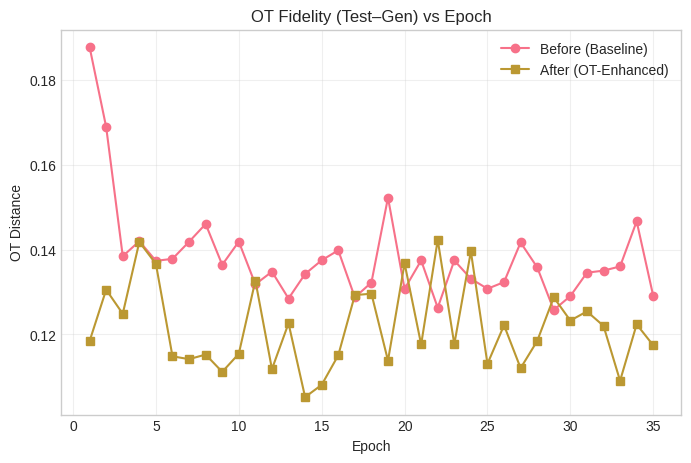

Saved: /content/drive/MyDrive/_ddpm_plots/epoch_compare_ot_fidelity.png


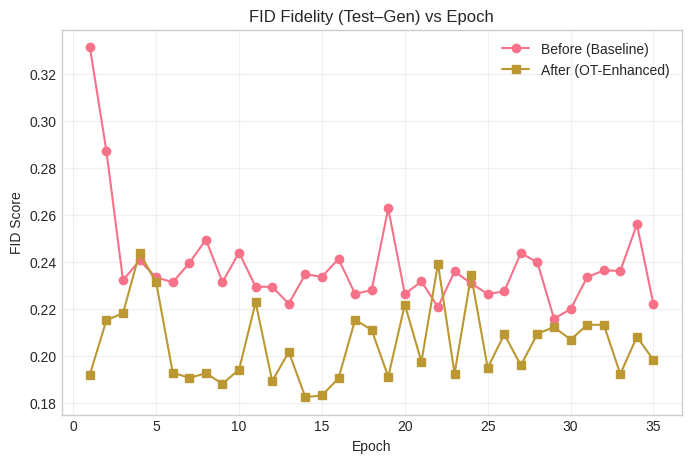

Saved: /content/drive/MyDrive/_ddpm_plots/epoch_compare_fid_fidelity.png
Using enhanced checkpoint: ot_enhanced_epoch035.pt
Generating 5000 samples in batches of 256...


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

Generated 5000/5000 samples
Final generated tensor shape: torch.Size([5000, 1, 28, 28])


Extracting FID features: 100%|██████████| 20/20 [00:00<00:00, 249.71it/s]


Precision/Fidelity Analysis Experiment
----------------------------------------
Testing noise level: 0.000
  OT distance: 0.128250
  FID score: 0.199047
Testing noise level: 0.111
  OT distance: 0.128810
  FID score: 0.519518
Testing noise level: 0.222
  OT distance: 0.131308
  FID score: 1.526260
Testing noise level: 0.333
  OT distance: 0.135680
  FID score: 3.210351
Testing noise level: 0.444
  OT distance: 0.142111
  FID score: 5.627846
Testing noise level: 0.556
  OT distance: 0.150487
  FID score: 8.736911
Testing noise level: 0.667
  OT distance: 0.159325
  FID score: 12.483447
Testing noise level: 0.778
  OT distance: 0.170012
  FID score: 16.935666
Testing noise level: 0.889
  OT distance: 0.182123
  FID score: 22.194749
Testing noise level: 1.000
  OT distance: 0.194365
  FID score: 27.979270


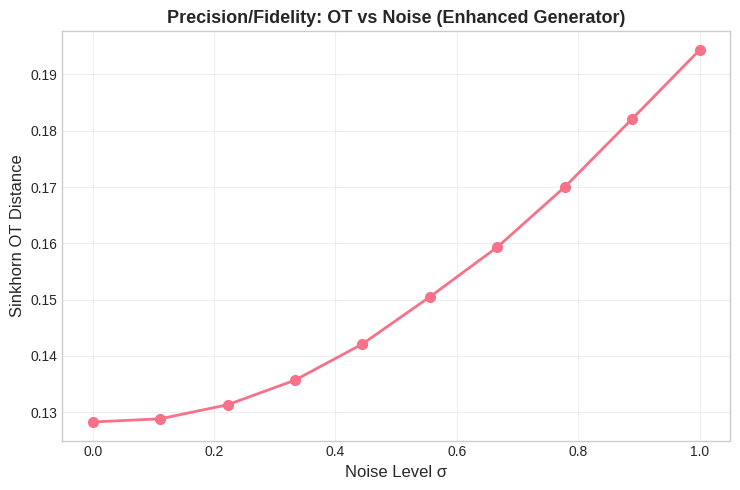

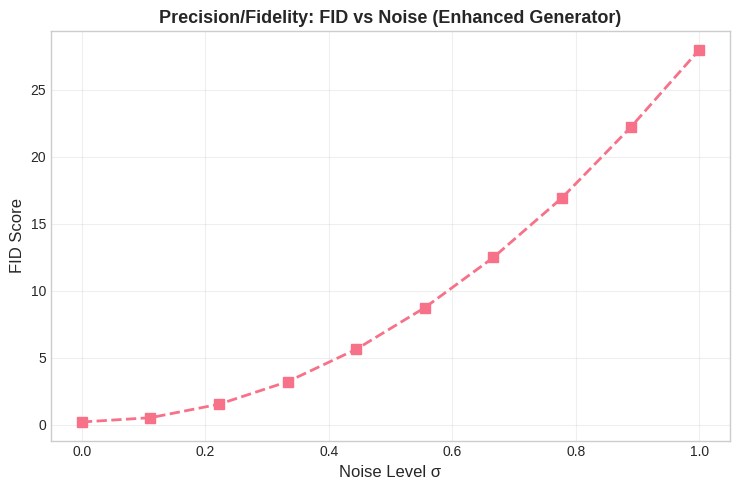

Saved:
- /content/drive/MyDrive/_ddpm_plots/enhanced_precision_only_ot.png
- /content/drive/MyDrive/_ddpm_plots/enhanced_precision_only_fid.png


In [114]:
# 1) Compare across epochs (before vs after)
baseline_epoch_results = evaluate_checkpoints_in_dir(BASELINE_CHECKPOINT_DIR, "baseline", total_samples=1500)
ot_epoch_results       = evaluate_checkpoints_in_dir(ACTIVE_CHECKPOINT_DIR,   "ot-enhanced", total_samples=1500)
plot_ot_fid_epoch_comparisons(baseline_epoch_results, ot_epoch_results)

# 2) Passive-style plots for the latest enhanced checkpoint
passive_style_plots_for_enhanced_last_ckpt(total_samples=5000)


